#**Import Libraries**

In [ ]:
!pip install pyswarms
!pip install tensorflow
!pip install keras-tuner
!pip install tabulate
!pip install psutil
!pip install pydot
!pip install graphviz
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.3/491.3 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 870.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 85.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 86.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 90.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 

In [ ]:
# Import standard libraries
import glob
import os
import psutil
import random
import shutil
import time
from concurrent.futures import ThreadPoolExecutor
from functools import lru_cache
from PIL import Image
import cv2

# Import data processing and visualization libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pydot
import seaborn as sns
from matplotlib.pyplot import figure
from tabulate import tabulate

# Import TensorFlow and Keras libraries
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras import layers, models, Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.initializers import GlorotUniform
from tensorflow.keras.layers import Conv2D, Dense, Dropout, Flatten, Input, MaxPooling2D
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import plot_model

# Import scikit-learn metrics libraries
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from datetime import datetime

In [ ]:
# Set all random seeds for reproducibility
SEED = 42  # You can use any integer value
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# For deterministic behavior in TensorFlow
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

# For TensorFlow 2.x, this is the recommended way to set determinism
tf.config.experimental.enable_op_determinism()

# If you're using GPU, you might want to limit parallelism
# This is optional but can help with reproducibility
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['VECLIB_MAXIMUM_THREADS'] = '1'
os.environ['NUMEXPR_NUM_THREADS'] = '1'

#**Data Loading**

In [ ]:
# Import 'drive' module from the 'google.colab' package.
from google.colab import drive

# Connect Google Drive to Colab.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Change the current working directory to '/content/drive/MyDrive/Data'
%cd /content/drive/MyDrive/Batik

/content/drive/MyDrive/Batik


In [ ]:
pth = "/content/drive/MyDrive/Batik"

#**Resize Data**

In [ ]:
data_dir = '/content/drive/MyDrive/Batik/Dataset'
base_dir = '/content/drive/MyDrive/Batik/'
processed_dir = os.path.join(base_dir, 'Processed')  # Directory for resized images
train_dir = os.path.join(base_dir, 'Train')
test_dir = os.path.join(base_dir, 'Test')

In [ ]:
# Define target size for resizing
TARGET_SIZE = (227, 227)

In [ ]:
# Create processed directory
os.makedirs(processed_dir, exist_ok=True)

In [ ]:
# Create class subdirectories in processed directory
classes = ['Kawung', 'Parang', 'Truntum']
for cls in classes:
    os.makedirs(os.path.join(processed_dir, cls), exist_ok=True)

In [ ]:
def resize_images(source_dir, dest_dir, target_size):
    """Resize images and save to destination directory"""
    if not os.path.exists(source_dir):
        print(f"Source directory {source_dir} does not exist!")
        return

    count = 0
    for filename in os.listdir(source_dir):
        source_path = os.path.join(source_dir, filename)
        dest_path = os.path.join(dest_dir, filename)

        # Skip if not a file or zero size
        if not os.path.isfile(source_path) or os.path.getsize(source_path) == 0:
            print(f"Skipped {filename} - not a valid file or zero size")
            continue

        try:
            with Image.open(source_path) as img:
                # Resize image
                img_resized = img.resize(target_size, Image.LANCZOS)
                # Save resized image
                img_resized.save(dest_path)
                count += 1
        except Exception as e:
            print(f"Error processing {filename}: {e}")

    print(f"Processed {count} images in {source_dir}")

In [ ]:
print("===== COMPONENT 1: RESIZING IMAGES =====")
for cls in classes:
    source_class_dir = os.path.join(data_dir, cls)
    dest_class_dir = os.path.join(processed_dir, cls)
    print(f"Resizing {cls} images...")
    resize_images(source_class_dir, dest_class_dir, TARGET_SIZE)

print("Image resizing complete!")
print(f"Resized images saved to: {processed_dir}")

===== COMPONENT 1: RESIZING IMAGES =====
Resizing Kawung images...
Processed 1000 images in /content/drive/MyDrive/Batik/Dataset/Kawung
Resizing Parang images...
Processed 1000 images in /content/drive/MyDrive/Batik/Dataset/Parang
Resizing Truntum images...
Processed 1000 images in /content/drive/MyDrive/Batik/Dataset/Truntum
Image resizing complete!
Resized images saved to: /content/drive/MyDrive/Batik/Processed


#**Data Split**

In [ ]:
# Create train and test directories
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

In [ ]:
# Create class subdirectories in train and test directories
for cls in classes:
    os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(test_dir, cls), exist_ok=True)

In [ ]:
def split_data(source_dir, train_dir, test_dir, split_size):
    """Split data from source directory into training and testing sets"""
    files = []
    for filename in os.listdir(source_dir):
        file_path = os.path.join(source_dir, filename)
        if os.path.isfile(file_path) and os.path.getsize(file_path) > 0:
            files.append(filename)
        else:
            print(f'Skipped {filename} because it is not a valid file or zero length')

    if not files:
        print(f"No files found in {source_dir}")
        return

    # Sort files to ensure consistent order before shuffling
    files.sort()

    # Shuffle files with fixed seed for reproducibility
    random.seed(SEED)
    shuffled_set = random.sample(files, len(files))

    # Split files
    training_length = int(len(files) * split_size)
    training_set = shuffled_set[:training_length]
    testing_set = shuffled_set[training_length:]

    # Copy files to respective directories
    for filename in training_set:
        source_path = os.path.join(source_dir, filename)
        dest_path = os.path.join(train_dir, filename)
        shutil.copyfile(source_path, dest_path)

    for filename in testing_set:
        source_path = os.path.join(source_dir, filename)
        dest_path = os.path.join(test_dir, filename)
        shutil.copyfile(source_path, dest_path)

    print(f"Split complete: {len(training_set)} training, {len(testing_set)} testing")

In [ ]:
# Split data for each class
print("\n===== COMPONENT 2: SPLITTING DATA =====")
split_size = 0.8
for cls in classes:
    print(f"Splitting {cls} data...")
    source_class_dir = os.path.join(processed_dir, cls)
    train_class_dir = os.path.join(train_dir, cls)
    test_class_dir = os.path.join(test_dir, cls)
    split_data(source_class_dir, train_class_dir, test_class_dir, split_size)

print("Data splitting complete!")
print(f"Training data saved to: {train_dir}")
print(f"Testing data saved to: {test_dir}")


===== COMPONENT 2: SPLITTING DATA =====
Splitting Kawung data...
Split complete: 800 training, 200 testing
Splitting Parang data...
Split complete: 800 training, 200 testing
Splitting Truntum data...
Split complete: 800 training, 200 testing
Data splitting complete!
Training data saved to: /content/drive/MyDrive/Batik/Train
Testing data saved to: /content/drive/MyDrive/Batik/Test


In [ ]:
# Print summary statistics
for cls in classes:
    train_count = len(os.listdir(os.path.join(train_dir, cls)))
    test_count = len(os.listdir(os.path.join(test_dir, cls)))
    total = train_count + test_count
    print(f"{cls}: {train_count} training ({train_count/total:.1%}), {test_count} testing ({test_count/total:.1%})")

Kawung: 800 training (80.0%), 200 testing (20.0%)
Parang: 800 training (80.0%), 200 testing (20.0%)
Truntum: 800 training (80.0%), 200 testing (20.0%)


#**Normalisasi Augmentasi Data**

In [ ]:
def preprocess_input_alexnet(x):
    # Scale to [0, 1]
    x = x / 255.0
    return x

In [ ]:
BATCH_SIZE = 32
CLASS_MODE = 'categorical'

# Generator for training with augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_alexnet,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest',
    validation_split=0.2  # 20% of training data used for validation
)

In [ ]:
# Generator for test data (only normalization)
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_alexnet
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=CLASS_MODE,
    subset='training',
    seed=SEED
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=CLASS_MODE,
    subset='validation',
    seed=SEED
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=CLASS_MODE,
    shuffle=False
)

Found 1920 images belonging to 3 classes.
Found 480 images belonging to 3 classes.
Found 600 images belonging to 3 classes.



Sample augmented images from training set:


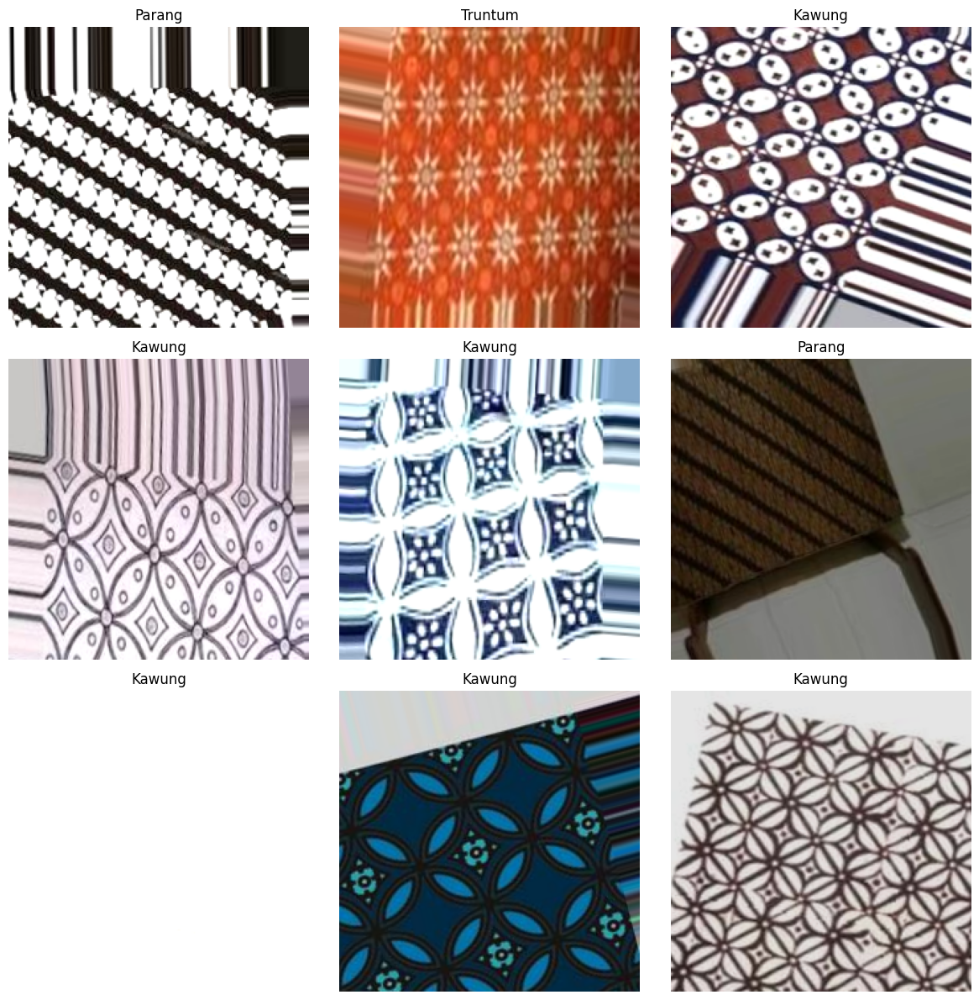

In [ ]:
# Function to visualize augmented images
def denormalize_alexnet(image):
    """Denormalize image for visualization"""
    image = image.copy()
    # Inverse of scaling to [0, 1]
    image = image * 255
    return image.astype('uint8')

def plot_augmented_images(generator):
    """Plot augmented images from generator"""
    images, labels = next(generator)
    class_names = list(generator.class_indices.keys())
    plt.figure(figsize=(12, 12))
    for i in range(min(9, len(images))):
        ax = plt.subplot(3, 3, i + 1)
        deno_img = denormalize_alexnet(images[i])
        plt.imshow(deno_img)
        class_idx = np.argmax(labels[i])
        plt.title(f"{class_names[class_idx]}", size=12)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Visualize augmented images
print("\nSample augmented images from training set:")
plot_augmented_images(train_generator)

In [ ]:
# Print dataset summary
class_indices = train_generator.class_indices
class_names = list(class_indices.keys())
print("\n=== Dataset Summary ===")
print(f"Class names: {class_names}")
print(f"Class indices: {class_indices}")
print(f"Training samples: {train_generator.samples}")
print(f"Validation samples: {validation_generator.samples}")
print(f"Test samples: {test_generator.samples}")


=== Dataset Summary ===
Class names: ['Kawung', 'Parang', 'Truntum']
Class indices: {'Kawung': 0, 'Parang': 1, 'Truntum': 2}
Training samples: 1920
Validation samples: 480
Test samples: 600


#**Standard AlexNet Model**

##**AlexNet Architecture**

In [ ]:
def create_alexnet_model(num_classes=3):
    """Create and compile an AlexNet model for 3 classes"""
    print("\n=== Creating AlexNet Model with Glorot Uniform Initialization ===")

    # AlexNet architecture
    model = Sequential([
        # First convolutional layer
        Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',
               activation='relu', input_shape=(227, 227, 3),
               kernel_initializer='glorot_uniform', name='conv1'),
        MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool1'),

        # Second convolutional layer
        Conv2D(256, kernel_size=(5, 5), padding='same', activation='relu',
               kernel_initializer='glorot_uniform', name='conv2'),
        MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool2'),

        # Third convolutional layer
        Conv2D(384, kernel_size=(3, 3), padding='same', activation='relu',
               kernel_initializer='glorot_uniform', name='conv3'),

        # Fourth convolutional layer
        Conv2D(384, kernel_size=(3, 3), padding='same', activation='relu',
               kernel_initializer='glorot_uniform', name='conv4'),

        # Fifth convolutional layer
        Conv2D(256, kernel_size=(3, 3), padding='same', activation='relu',
               kernel_initializer='glorot_uniform', name='conv5'),
        MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool5'),

        # Fully connected layers
        Flatten(name='flatten'),
        Dense(4096, activation='relu', kernel_initializer='glorot_uniform', name='fc6'),
        Dropout(0.5, name='dropout6'),
        Dense(4096, activation='relu', kernel_initializer='glorot_uniform', name='fc7'),
        Dropout(0.5, name='dropout7'),

        # Output layer - dynamically set based on number of classes
        Dense(num_classes, activation='softmax', kernel_initializer='glorot_uniform', name='fc8')
    ])

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print("\nAlexNet Model Summary:")
    model.summary()

    return model

# Create the model
standard_model = create_alexnet_model(len(class_names))


=== Creating AlexNet Model with Glorot Uniform Initialization ===

AlexNet Model Summary:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 55, 55, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 27, 27, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 27, 27, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 13, 13, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 13, 13, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 13, 13, 384)    │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 13, 13, 256)    │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool5 (MaxPooling2D)            │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 9216)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc6 (Dense)                     │ (None, 4096)           │    37,752,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout6 (Dropout)              │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc7 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout7 (Dropout)              │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc8 (Dense)                     │ (None, 3)              │        12,291 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 58,293,635 (222.37 MB)

 Trainable params: 58,293,635 (222.37 MB)

 Non-trainable params: 0 (0.00 B)

##**Train Model**

In [ ]:
def train_standard_model(model, epochs=50):
    """Train the standard AlexNet model"""
    print("\n=== Training Standard AlexNet ===")

    # Create callbacks
    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=7,
        restore_best_weights=True,
        verbose=1
    )

    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=0.00001,
        verbose=1
    )

    checkpoint = ModelCheckpoint(
        'standard_alexnet_best_model.h5',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    )

    # Train the model - set shuffle=False for reproducibility
    standard_history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // BATCH_SIZE,
        epochs=epochs,
        validation_data=validation_generator,
        validation_steps=validation_generator.samples // BATCH_SIZE,
        callbacks=[early_stop, reduce_lr, checkpoint],
        verbose=1,
        shuffle=False  # Important: disable shuffling for reproducible results
    )

    return standard_history

# Train the model
standard_history = train_standard_model(standard_model, epochs=50)


=== Training Standard AlexNet ===


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 932ms/step - accuracy: 0.3320 - loss: 3.8313
Epoch 1: val_accuracy improved from -inf to 0.33333, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.3322 - loss: 3.7987 - val_accuracy: 0.3333 - val_loss: 1.0990 - learning_rate: 0.0010
Epoch 2/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2997 - loss: 1.1002
Epoch 2: val_accuracy did not improve from 0.33333
60/60 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.2999 - loss: 1.1002 - val_accuracy: 0.3333 - val_loss: 1.0987 - learning_rate: 0.0010
Epoch 3/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - accuracy: 0.3289 - loss: 1.0990
Epoch 3: val_accuracy did not improve from 0.33333
60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.3289 - loss: 1.0990 - val_accuracy: 0.3333 - val_loss: 1.0987 - learning_rate: 0.0010
Epoch 4/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 890ms/step - accuracy: 0.3227 - loss: 1.0992
Epoch 4: val_accuracy did not improve from 0.33333
60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.3226 - loss: 1.0992 - val_accuracy: 0.3333 - val_loss: 1.0987 - learning_rate: 0.0010
Epoch 5/50
60/60 ━━━━━━━━━━━━━━━━━━━

60/60 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.3140 - loss: 1.0990 - val_accuracy: 0.3396 - val_loss: 1.0986 - learning_rate: 1.0000e-05
Epoch 13/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3242 - loss: 1.0988
Epoch 13: val_accuracy improved from 0.33958 to 0.37708, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - accuracy: 0.3245 - loss: 1.0988 - val_accuracy: 0.3771 - val_loss: 1.0985 - learning_rate: 1.0000e-05
Epoch 14/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3098 - loss: 1.0987
Epoch 14: val_accuracy improved from 0.37708 to 0.41042, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 86s 1s/step - accuracy: 0.3102 - loss: 1.0987 - val_accuracy: 0.4104 - val_loss: 1.0985 - learning_rate: 1.0000e-05
Epoch 15/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3259 - loss: 1.0988
Epoch 15: val_accuracy did not improve from 0.41042
60/60 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.3261 - loss: 1.0988 - val_accuracy: 0.4042 - val_loss: 1.0985 - learning_rate: 1.0000e-05
Epoch 16/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 896ms/step - accuracy: 0.3394 - loss: 1.0986
Epoch 16: val_accuracy did not improve from 0.41042
60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.3392 - loss: 1.0986 - val_accuracy: 0.3688 - val_loss: 1.0984 - learning_rate: 1.0000e-05
Epoch 17/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 880ms/step - accuracy: 0.3414 - loss: 1.0987
Epoch 17: val_accuracy did not improve from 0.41042
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.3415 - loss: 1.0987 - val_accuracy: 0.3458 - val_loss: 1.0980 - learning_rate: 1.0000e-05
Epoch 18/50
60

60/60 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.4384 - loss: 1.0169 - val_accuracy: 0.4500 - val_loss: 1.0087 - learning_rate: 1.0000e-05
Epoch 25/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5003 - loss: 1.0057
Epoch 25: val_accuracy improved from 0.45000 to 0.51875, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.5002 - loss: 1.0059 - val_accuracy: 0.5188 - val_loss: 1.0029 - learning_rate: 1.0000e-05
Epoch 26/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4917 - loss: 1.0043
Epoch 26: val_accuracy did not improve from 0.51875
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.4915 - loss: 1.0044 - val_accuracy: 0.5000 - val_loss: 0.9964 - learning_rate: 1.0000e-05
Epoch 27/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 880ms/step - accuracy: 0.4951 - loss: 1.0041
Epoch 27: val_accuracy did not improve from 0.51875
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.4951 - loss: 1.0041 - val_accuracy: 0.5000 - val_loss: 0.9980 - learning_rate: 1.0000e-05
Epoch 28/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 873ms/step - accuracy: 0.5273 - loss: 1.0121
Epoch 28: val_accuracy improved from 0.51875 to 0.53542, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step - accuracy: 0.5270 - loss: 1.0120 - val_accuracy: 0.5354 - val_loss: 0.9666 - learning_rate: 1.0000e-05
Epoch 29/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5088 - loss: 0.9776
Epoch 29: val_accuracy improved from 0.53542 to 0.58125, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.5089 - loss: 0.9775 - val_accuracy: 0.5813 - val_loss: 0.9468 - learning_rate: 1.0000e-05
Epoch 30/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5439 - loss: 0.9563
Epoch 30: val_accuracy improved from 0.58125 to 0.60833, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.5436 - loss: 0.9563 - val_accuracy: 0.6083 - val_loss: 0.9280 - learning_rate: 1.0000e-05
Epoch 31/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5206 - loss: 0.9526
Epoch 31: val_accuracy did not improve from 0.60833
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.5208 - loss: 0.9525 - val_accuracy: 0.5896 - val_loss: 0.8979 - learning_rate: 1.0000e-05
Epoch 32/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 873ms/step - accuracy: 0.5369 - loss: 0.9244
Epoch 32: val_accuracy did not improve from 0.60833
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 998ms/step - accuracy: 0.5370 - loss: 0.9243 - val_accuracy: 0.5938 - val_loss: 0.8997 - learning_rate: 1.0000e-05
Epoch 33/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 879ms/step - accuracy: 0.5520 - loss: 0.8956
Epoch 33: val_accuracy did not improve from 0.60833
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.5523 - loss: 0.8956 - val_accuracy: 0.5979 - val_loss: 0.8528 - learning_rate: 1.0000e-05
Epoch 34/50

60/60 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.5692 - loss: 0.8967 - val_accuracy: 0.6604 - val_loss: 0.8531 - learning_rate: 1.0000e-05
Epoch 35/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6039 - loss: 0.8581
Epoch 35: val_accuracy did not improve from 0.66042
60/60 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.6037 - loss: 0.8583 - val_accuracy: 0.5938 - val_loss: 0.8831 - learning_rate: 1.0000e-05
Epoch 36/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 883ms/step - accuracy: 0.5662 - loss: 0.8841
Epoch 36: val_accuracy improved from 0.66042 to 0.68125, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.5663 - loss: 0.8839 - val_accuracy: 0.6812 - val_loss: 0.8051 - learning_rate: 1.0000e-05
Epoch 37/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5777 - loss: 0.8723
Epoch 37: val_accuracy did not improve from 0.68125
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.5780 - loss: 0.8721 - val_accuracy: 0.6083 - val_loss: 0.8508 - learning_rate: 1.0000e-05
Epoch 38/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 870ms/step - accuracy: 0.5834 - loss: 0.8415
Epoch 38: val_accuracy did not improve from 0.68125
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 997ms/step - accuracy: 0.5837 - loss: 0.8414 - val_accuracy: 0.6583 - val_loss: 0.7782 - learning_rate: 1.0000e-05
Epoch 39/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 880ms/step - accuracy: 0.6095 - loss: 0.8323
Epoch 39: val_accuracy did not improve from 0.68125
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.6096 - loss: 0.8324 - val_accuracy: 0.6375 - val_loss: 0.8068 - learning_rate: 1.0000e-05
Epoch 40/50

60/60 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.5966 - loss: 0.8452 - val_accuracy: 0.6938 - val_loss: 0.7541 - learning_rate: 1.0000e-05
Epoch 41/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6263 - loss: 0.8107
Epoch 41: val_accuracy did not improve from 0.69375
60/60 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.6264 - loss: 0.8105 - val_accuracy: 0.6792 - val_loss: 0.7552 - learning_rate: 1.0000e-05
Epoch 42/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 874ms/step - accuracy: 0.6477 - loss: 0.7987
Epoch 42: val_accuracy did not improve from 0.69375
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.6475 - loss: 0.7987 - val_accuracy: 0.6917 - val_loss: 0.7105 - learning_rate: 1.0000e-05
Epoch 43/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 870ms/step - accuracy: 0.6666 - loss: 0.7736
Epoch 43: val_accuracy did not improve from 0.69375
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 997ms/step - accuracy: 0.6663 - loss: 0.7736 - val_accuracy: 0.6917 - val_loss: 0.7139 - learning_rate: 1.0000e-05
Epoch 44/50

60/60 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.6445 - loss: 0.7626 - val_accuracy: 0.7000 - val_loss: 0.7140 - learning_rate: 1.0000e-05
Epoch 46/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6371 - loss: 0.7751
Epoch 46: val_accuracy improved from 0.70000 to 0.72083, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.6372 - loss: 0.7749 - val_accuracy: 0.7208 - val_loss: 0.6697 - learning_rate: 1.0000e-05
Epoch 47/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6839 - loss: 0.7252
Epoch 47: val_accuracy improved from 0.72083 to 0.73750, saving model to standard_alexnet_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - accuracy: 0.6835 - loss: 0.7256 - val_accuracy: 0.7375 - val_loss: 0.6796 - learning_rate: 1.0000e-05
Epoch 48/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6535 - loss: 0.7626
Epoch 48: val_accuracy did not improve from 0.73750
60/60 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.6538 - loss: 0.7623 - val_accuracy: 0.7312 - val_loss: 0.6611 - learning_rate: 1.0000e-05
Epoch 49/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 878ms/step - accuracy: 0.6627 - loss: 0.7367
Epoch 49: val_accuracy did not improve from 0.73750
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.6626 - loss: 0.7368 - val_accuracy: 0.6875 - val_loss: 0.6971 - learning_rate: 1.0000e-05
Epoch 50/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 876ms/step - accuracy: 0.6473 - loss: 0.7637
Epoch 50: val_accuracy did not improve from 0.73750
60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.6472 - loss: 0.7637 - val_accuracy: 0.7229 - val_loss: 0.6539 - learning_rate: 1.0000e-05
Restoring mode

##**Visualisasi Training History**

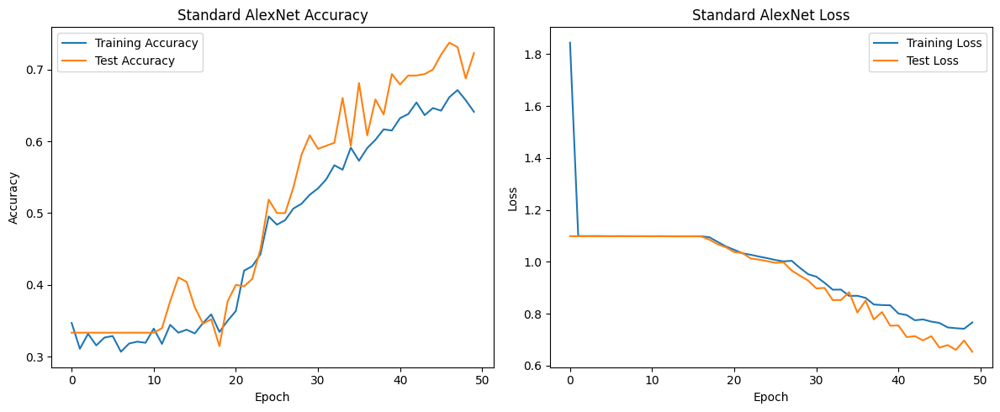

In [ ]:
def plot_training_history(history):
    """Plot the training and validation metrics"""
    plt.figure(figsize=(12, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Test Accuracy')
    plt.title('Standard AlexNet Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Test Loss')
    plt.title('Standard AlexNet Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot training history
plot_training_history(standard_history)

##**Evaluasi Model**

In [ ]:
def evaluate_standard_model(model):
    """Evaluate the standard AlexNet model on test and training data"""
    print("\n=== Evaluating Standard AlexNet on Test Data ===")

    # Evaluate on test data
    test_loss, test_acc = model.evaluate(test_generator, verbose=1)
    print(f"Test Loss: {test_loss:.4f}")
    print(f"Test Accuracy: {test_acc:.4f}")

    # Evaluate on training data
    train_loss, train_acc = model.evaluate(train_generator, verbose=1)
    print(f"Final Training Accuracy: {train_acc:.4f}")
    print(f"Final Training Loss: {train_loss:.4f}")

    return test_acc, train_acc, test_loss, train_loss

# Evaluate the model
test_acc, train_acc, test_loss, train_loss = evaluate_standard_model(standard_model)


=== Evaluating Standard AlexNet on Test Data ===
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - accuracy: 0.6210 - loss: 0.8512
Test Loss: 0.6966
Test Accuracy: 0.7000
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 483ms/step - accuracy: 0.6614 - loss: 0.7231
Final Training Accuracy: 0.6708
Final Training Loss: 0.7141


##**Matriks Evaluasi**

19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step

Classification Report for Standard AlexNet:
              precision    recall  f1-score   support

      Kawung       0.62      0.53      0.57       200
      Parang       0.74      0.67      0.70       200
     Truntum       0.73      0.91      0.81       200

    accuracy                           0.70       600
   macro avg       0.70      0.70      0.69       600
weighted avg       0.70      0.70      0.69       600



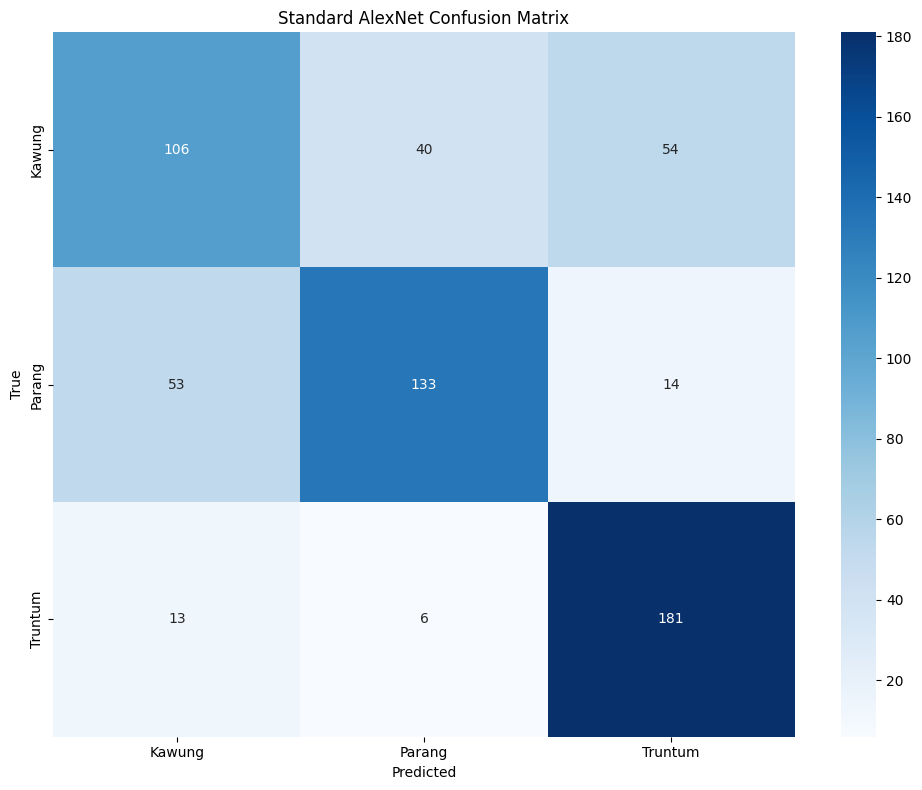

In [ ]:
def get_detailed_metrics(model):
    """Generate detailed performance metrics and visualizations"""
    # Get predictions
    y_pred_prob = model.predict(test_generator, verbose=1)
    y_pred = np.argmax(y_pred_prob, axis=1)

    test_generator.reset()
    y_true = test_generator.classes

    # Classification report
    print("\nClassification Report for Standard AlexNet:")
    std_report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Confusion matrix
    plt.figure(figsize=(10, 8))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title('Standard AlexNet Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()

    # Create metrics dictionary
    metrics = {
        'Accuracy': test_acc,
        'Macro-precision': std_report['macro avg']['precision'],
        'Macro-recall': std_report['macro avg']['recall'],
        'Macro-F1-score': std_report['macro avg']['f1-score'],
        'Training-Accuracy': train_acc
    }

    return metrics, std_report

# Get detailed metrics
standard_metrics, standard_report = get_detailed_metrics(standard_model)

In [ ]:
# Print metrics summary
print("\n=== Standard AlexNet Performance Summary ===")
for metric, value in standard_metrics.items():
    print(f"{metric}: {value:.4f}")


=== Standard AlexNet Performance Summary ===
Accuracy: 0.7000
Macro-precision: 0.6954
Macro-recall: 0.7000
Macro-F1-score: 0.6927
Training-Accuracy: 0.6708


#**AlexNet Optimization Using PSO**

In [ ]:
# Define the set_seeds function that will be called before each model evaluation
def set_seeds(seed=SEED):
    """
    Set all random seeds for reproducibility
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    # For deterministic behavior in TensorFlow
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    # For TensorFlow 2.x, this is the recommended way to set determinism
    tf.config.experimental.enable_op_determinism()
    # If you're using GPU, you might want to limit parallelism
    os.environ['OMP_NUM_THREADS'] = '1'
    os.environ['OPENBLAS_NUM_THREADS'] = '1'
    os.environ['MKL_NUM_THREADS'] = '1'
    os.environ['VECLIB_MAXIMUM_THREADS'] = '1'
    os.environ['NUMEXPR_NUM_THREADS'] = '1'

In [ ]:
# Define parameter mappings
dropout_rate_options = [0.1, 0.2, 0.3, 0.4, 0.5]
learning_rate_options = [0.1, 0.01, 0.001, 0.0001]
activation_functions = ['relu', 'sigmoid', 'tanh']
optimizers = ['Adam', 'SGD']

##**AlexNet Architecture**

In [ ]:
def create_alexnet_model_with_params(params):
    # Extract parameters using indices from the defined lists
    dropout_rate = dropout_rate_options[int(params['dropout_rate'])]
    learning_rate = learning_rate_options[int(params['learning_rate'])]

    # Get activation function from list (e.g., 'tanh')
    activation = activation_functions[int(params['activation'])]

    # Create optimizer with proper learning rate
    optimizer_name = optimizers[int(params['optimizer'])]
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_name == 'SGD':
        optimizer = SGD(learning_rate=learning_rate, momentum=0.9)
    else:
        # Handle cases where optimizer_name might not be recognized
        # For simplicity, default to Adam if not found
        optimizer = Adam(learning_rate=learning_rate)

    # Create AlexNet with configurable parameters
    model = Sequential([
        # First convolutional block
        Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',
               activation=activation,
               input_shape=(227, 227, 3)),
        MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),

        # Second convolutional block
        Conv2D(256, kernel_size=(5, 5), padding='same', activation=activation),
        MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),

        # Remaining convolutional layers
        Conv2D(384, kernel_size=(3, 3), padding='same', activation=activation),
        Conv2D(384, kernel_size=(3, 3), padding='same', activation=activation),
        Conv2D(256, kernel_size=(3, 3), padding='same', activation=activation),
        MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),

        # Flatten layer
        Flatten(),

        # Fully connected layers with fixed neuron counts
        Dense(4096, activation=activation),
        Dropout(dropout_rate),
        Dense(4096, activation=activation),
        Dropout(dropout_rate),

        # Output layer - dynamically set based on number of classes
        Dense(len(class_names), activation='softmax')
    ])

    # Compile the model
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

##**Evaluasi Model dengan Hyperparameter Tertentu**

In [ ]:
# Function to evaluate a model with given hyperparameters
def evaluate_model(params, epochs=5, verbose=0):
    """
    Train and evaluate a model with given hyperparameters.
    Optimized for faster evaluation.
    """
    # Reset random seeds before each model evaluation
    set_seeds()

    # Create model
    model = create_alexnet_model_with_params(params)

    # Use reduced callbacks for faster training
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.00001, verbose=0)
    ]

    # Use smaller steps for faster evaluation during optimization
    steps_per_epoch = min(train_generator.samples // BATCH_SIZE, 10)  # Limit steps for faster iteration
    validation_steps = min(validation_generator.samples // BATCH_SIZE, 5)

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=epochs,
        validation_data=validation_generator,
        validation_steps=validation_steps,
        callbacks=callbacks,
        verbose=verbose,
        shuffle=False  # Disable shuffling for reproducibility
    )

    # Get the best validation accuracy
    val_acc = max(history.history['val_accuracy'])

    # Clear keras session to free memory
    K.clear_session()

    return val_acc

##**Implementasi PSO**

In [ ]:
# Optimized Particle class
class Particle:
    def __init__(self, bounds, particle_id=0):
        """
        Initialize a particle with random position and velocity within bounds.
        Optimized for faster initialization and better reproducibility.
        """
        # Set seed for this specific particle initialization for reproducibility
        set_seeds(42 + particle_id)  # Different seed for each particle but reproducible

        self.position = {}
        self.velocity = {}
        self.best_position = {}
        self.best_score = 0.0  # For accuracy, higher is better

        # Initialize position and velocity for each parameter
        for param, max_idx in bounds.items():
            # For all parameters, we're now selecting indices
            # Initialize with a random integer index
            self.position[param] = np.random.randint(0, max_idx)
            # Velocity can still be float as it affects the probability of switching indices
            self.velocity[param] = np.random.uniform(-1, 1)

        self.best_position = self.position.copy()

    def __str__(self):
        """String representation for printing particle state"""
        pos_str = ", ".join([f"{k}={v:.4f}" for k, v in self.position.items()])
        vel_str = ", ".join([f"Vel_{k}={v:.4f}" for k, v in self.velocity.items()])
        return f"Position: [{pos_str}], Velocity: [{vel_str}], Best Score: {self.best_score:.4f}"

In [ ]:
class PSO:
    def __init__(self, bounds, num_particles=10, max_iter=50,
                 w=0.729, c1=1.494, c2=1.494):
        """
        Particle Swarm Optimization implementation

        Args:
            bounds (dict): Parameter bounds for each hyperparameter
            num_particles (int): Number of particles in the swarm
            max_iter (int): Maximum number of iterations
            w (float): Inertia weight
            c1 (float): Cognitive parameter
            c2 (float): Social parameter
        """
        self.bounds = bounds
        self.num_particles = num_particles
        self.max_iter = max_iter
        self.w = w  # Inertia weight
        self.c1 = c1  # Cognitive coefficient
        self.c2 = c2  # Social coefficient

        self.global_best_position = None
        self.global_best_score = 0.0

    def optimize(self, fitness_function):
        """
        Run Particle Swarm Optimization

        Args:
            fitness_function (callable): Function to evaluate particle's fitness

        Returns:
            tuple: Best parameters, best score, and optimization history
        """
        # Initialize particles
        particles = [Particle(self.bounds, particle_id=i) for i in range(self.num_particles)]

        # Track optimization history with more detailed information
        history = {
            'iterations': [],
            'global_best_scores': [],
            'best_positions': [],
            'particle_positions': [],
            'particle_velocities': [],
            'particle_scores': [],
            'initial_scores': []
        }

        # Capture initial state
        initial_positions = []
        initial_velocities = []
        initial_scores = []

        for particle in particles:
            initial_positions.append(particle.position.copy())
            initial_velocities.append(particle.velocity.copy())

        history['particle_positions'].append(initial_positions)
        history['particle_velocities'].append(initial_velocities)

        # Main PSO loop
        for iter in range(self.max_iter):
            current_positions = []
            current_velocities = []
            current_scores = []

            # Evaluate each particle
            for i, particle in enumerate(particles):
                # Convert particle position to parameter dict
                params = {k: v for k, v in particle.position.items()}

                # Evaluate fitness
                score = fitness_function(params)
                current_scores.append(score)

                if iter == 0:
                    initial_scores.append(score)

                # Update particle's best position
                if score > particle.best_score:
                    particle.best_score = score
                    particle.best_position = particle.position.copy()

                # Update global best position
                if score > self.global_best_score:
                    self.global_best_score = score
                    self.global_best_position = particle.position.copy()

            # Save initial scores after first evaluation
            if iter == 0:
                history['initial_scores'] = initial_scores.copy()

            # Update particle velocities and positions
            for particle in particles:
                r1, r2 = np.random.rand(2)

                for param in self.bounds.keys():
                    # Update velocity
                    cognitive_component = (self.c1 * r1 *
                        (particle.best_position[param] - particle.position[param]))
                    social_component = (self.c2 * r2 *
                        (self.global_best_position[param] - particle.position[param]))

                    particle.velocity[param] = (
                        self.w * particle.velocity[param] +
                        cognitive_component +
                        social_component
                    )

                    # Update position
                    particle.position[param] += particle.velocity[param]

                    # Clip position to bounds and ensure it's an integer index
                    max_idx = self.bounds[param]
                    # For discrete parameters, round to nearest integer and clip
                    particle.position[param] = max(0, min(int(round(particle.position[param])), max_idx - 1))

                # Capture updated position and velocity
                current_positions.append(particle.position.copy())
                current_velocities.append(particle.velocity.copy())

            # Record history
            history['iterations'].append(iter)
            history['global_best_scores'].append(self.global_best_score)
            history['best_positions'].append(self.global_best_position.copy())
            history['particle_positions'].append(current_positions)
            history['particle_velocities'].append(current_velocities)
            history['particle_scores'].append(current_scores)

            print(f"Iteration {iter+1}/{self.max_iter}: Best Score = {self.global_best_score:.4f}")

        return (self.global_best_position,
                self.global_best_score,
                history)

##**Define PSO Hyperparameter**

In [ ]:
# Define parameter bounds for PSO - now using indices for the discrete options
param_bounds = {
    'dropout_rate': len(dropout_rate_options),
    'learning_rate': len(learning_rate_options),
    'activation': len(activation_functions),
    'optimizer': len(optimizers)
}


In [ ]:
# Define fitness function for PSO
def fitness_function(params):
    """Fitness function for PSO that returns validation accuracy."""
    try:
        # Convert integer indices to actual parameter values for display
        display_params = {
            'dropout_rate': dropout_rate_options[int(params['dropout_rate'])],
            'learning_rate': learning_rate_options[int(params['learning_rate'])],
            'activation': activation_functions[int(params['activation'])],
            'optimizer': optimizers[int(params['optimizer'])]
        }
        print(f"Evaluating parameters: {display_params}")

        # Use a specific seed for this evaluation
        set_seeds(hash(str(params)) % 100000)
        start_time = time.time()

        # Reduce epochs for faster PSO optimization
        accuracy = evaluate_model(params, epochs=5, verbose=1)

        print(f"Evaluation completed in {time.time() - start_time:.2f} seconds. Accuracy: {accuracy:.4f}")
        return accuracy
    except Exception as e:
        print(f"Error evaluating model: {e}")
        return 0.0

In [ ]:
# Set main seed before running PSO
set_seeds(42)

# Run PSO to find best hyperparameters
print("\n=== Running PSO for Hyperparameter Optimization ===")
pso = PSO(
    bounds=param_bounds,
    num_particles=10,  # Adjust based on available compute resources
    max_iter=20,       # Adjust based on available compute resources
    w=0.792,
    c1=1.494,
    c2=1.494,
)

best_params, best_score, pso_results_history = pso.optimize(fitness_function)


=== Running PSO for Hyperparameter Optimization ===
Evaluating parameters: {'dropout_rate': 0.4, 'learning_rate': 0.001, 'activation': 'relu', 'optimizer': 'Adam'}


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.3107 - loss: 1.5698 - val_accuracy: 0.3562 - val_loss: 1.0868 - learning_rate: 0.0010
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.3663 - loss: 1.0874 - val_accuracy: 0.3562 - val_loss: 1.0959 - learning_rate: 0.0010
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.3334 - loss: 1.0994 - val_accuracy: 0.3812 - val_loss: 1.0947 - learning_rate: 0.0010
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.3655 - loss: 1.0896 - val_accuracy: 0.3187 - val_loss: 1.0952 - learning_rate: 2.0000e-04
Evaluation completed in 51.71 seconds. Accuracy: 0.3812
Evaluating parameters: {'dropout_rate': 0.5, 'learning_rate': 0.01, 'activation': 'relu', 'optimizer': 'SGD'}
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.3510 - loss: 1.0995 - val_accuracy: 0.3562 - val_loss: 1.0883 - learning_rate: 0.0100
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.3581 - loss: 1.0847 - 

##**Menampilkan hasil Iterasi**

In [ ]:
def display_pso_results(pso_instance, history):
    param_keys = list(pso_instance.bounds.keys())
    num_iterations = len(history['iterations'])

    def print_table_row(idx, pos, vel, score=None):
        print(f"| {idx:4d} | ", end="")

        for param in param_keys:
            if param == 'dropout_rate':
                actual_val = dropout_rate_options[int(pos[param])]
                print(f"{actual_val:9.3f} | ", end="")
            elif param == 'learning_rate':
                actual_val = learning_rate_options[int(pos[param])]
                print(f"{actual_val:9.5f} | ", end="")
            elif param == 'activation':
                actual_val = activation_functions[int(pos[param])]
                print(f"{actual_val:<9s} | ", end="")
            elif param == 'optimizer':
                actual_val = optimizers[int(pos[param])]
                print(f"{actual_val:<9s} | ", end="")
            else:
                print(f"{pos[param]:5.1f} | ", end="")

        for param in param_keys:
            print(f"{vel[param]:6.3f} | ", end="")

        if score is not None:
            accuracy = score * 100
            print(f"{accuracy:6.3f}% |")
        else:
            print("    N/A |")

    def print_table_header():
        print("| Part | ", end="")
        for param in param_keys:
            if param == 'dropout_rate':
                print(f"{'Drop':<9} | ", end="")
            elif param == 'learning_rate':
                print(f"{'LR':<9} | ", end="")
            elif param == 'activation':
                print(f"{'Activ':<9} | ", end="")
            elif param == 'optimizer':
                print(f"{'Optim':<9} | ", end="")
            else:
                print(f"{param[:5].upper():<9} | ", end="")

        for param in param_keys:
            if param == 'dropout_rate':
                print(f"VelDrop | ", end="")
            elif param == 'learning_rate':
                print(f"VelLR | ", end="")
            elif param == 'activation':
                print(f"VelActiv | ", end="")
            elif param == 'optimizer':
                print(f"VelOptim | ", end="")
            else:
                print(f"Vel{param[:3].upper()} | ", end="")
        print(" Acc% |")
        total_width = 10 + (len(param_keys) * 12) + (len(param_keys) * 10) + 8
        print("-" * total_width)

    print("\n" + "="*100)
    print("                                    PSO OPTIMIZATION RESULTS")
    print("="*100)

    print("\nSTARTING PSO OPTIMIZATION")
    print("INITIAL PARTICLE POSITIONS AND VELOCITIES")
    print("-" * 100)

    print_table_header()

    for i, particle_pos in enumerate(history['particle_positions'][0]):
        particle_vel = history['particle_velocities'][0][i]

        if i < len(history['initial_scores']):
            score = history['initial_scores'][i]
        else:
            score = None

        print_table_row(i+1, particle_pos, particle_vel, score)

    total_width = 10 + (len(param_keys) * 12) + (len(param_keys) * 10) + 8
    print("-" * total_width)

    for iter_idx in range(num_iterations):
        best_position = history['best_positions'][iter_idx]
        global_best_score_until_now = history['global_best_scores'][iter_idx]

        scores_in_current_iteration = history['particle_scores'][iter_idx]
        max_acc_in_current_iteration = max(scores_in_current_iteration) if scores_in_current_iteration else 0.0

        print(f"\nITERATION {iter_idx+1}")
        print(f"Global Best Accuracy (overall until this iteration): {global_best_score_until_now*100:.4f}%")
        print(f"Max Accuracy in this Iteration's Evaluations: {max_acc_in_current_iteration*100:.4f}%")

        print("Global Best Parameters: ", end="")
        for param, value in best_position.items():
            if param == 'dropout_rate':
                actual_val = dropout_rate_options[int(value)]
            elif param == 'learning_rate':
                actual_val = learning_rate_options[int(value)]
            elif param == 'activation':
                actual_val = activation_functions[int(value)]
            elif param == 'optimizer':
                actual_val = optimizers[int(value)]
            else:
                actual_val = value
            print(f"{param}={actual_val}, ", end="")
        print()

        if iter_idx > 0:
            prev_global_best_score = history['global_best_scores'][iter_idx-1]
            score_change = abs(global_best_score_until_now - prev_global_best_score) / prev_global_best_score if prev_global_best_score > 0 else 1
            acc_stability = min(10, int(10 * (1 - score_change * 10)))
            param_stability = min(10, int(10 * (1 - score_change * 10)))
        else:
            acc_stability = 0
            param_stability = 0

        print(f"Accuracy Stability: {acc_stability}/10, Param Stability: {param_stability}/10")

        print(f"\nITER {iter_idx+1} - PARTICLE POSITIONS, VELOCITIES, AND THEIR ACCURACIES")
        total_width = 10 + (len(param_keys) * 12) + (len(param_keys) * 10) + 8
        print("-" * total_width)

        print_table_header()

        pos_to_display_idx = iter_idx
        scores_to_display_idx = iter_idx

        for i, particle_pos in enumerate(history['particle_positions'][pos_to_display_idx]):
            particle_vel = history['particle_velocities'][pos_to_display_idx][i]

            if i < len(history['particle_scores'][scores_to_display_idx]):
                score = history['particle_scores'][scores_to_display_idx][i]
            else:
                score = None

            print_table_row(i+1, particle_pos, particle_vel, score)

        print("-" * total_width)

    initial_accuracy = history['initial_scores'][0] * 100 if history['initial_scores'] else None
    final_accuracy = history['global_best_scores'][-1] * 100

    print("\n")
    print("="*70)
    print("CONVERGENCE SUMMARY")
    print("="*70)
    print("| Parameter | Value                                 |")
    print("-"*70)
    print(f"| Total Iterations | {num_iterations}/{pso_instance.max_iter} |")
    if initial_accuracy is not None:
        print(f"| Initial Accuracy | {initial_accuracy:.4f}%                  |")
    print(f"| Final Accuracy   | {final_accuracy:.4f}%                  |")

    if initial_accuracy is not None:
        improvement = ((final_accuracy - initial_accuracy) / initial_accuracy) * 100
        print(f"| Improvement      | {improvement:.2f}%                  |")

    if len(history['global_best_scores']) > 3:
        recent_scores = history['global_best_scores'][-3:]
        score_range = max(recent_scores) - min(recent_scores)
        status = "Converged" if score_range < 0.01 else "Not Converged"
    else:
        status = "Insufficient Data"

    print(f"| Status           | {status}                    |")

    print(f"| Best Parameters  |                                       |")
    for param, value in history['best_positions'][-1].items():
        param_name = {
            'dropout_rate': 'Dropout Rate',
            'learning_rate': 'Learning Rate',
            'activation': 'Activation',
            'optimizer': 'Optimizer'
        }.get(param, param)

        if param == 'dropout_rate':
            actual_value = f"Index {int(value)} (Rate: {dropout_rate_options[int(value)]})"
        elif param == 'learning_rate':
            actual_value = f"Index {int(value)} (Rate: {learning_rate_options[int(value)]})"
        elif param == 'activation':
            actual_value = f"Index {int(value)} ({activation_functions[int(value)]})"
        elif param == 'optimizer':
            actual_value = f"Index {int(value)} ({optimizers[int(value)]})"
        else:
            actual_value = str(value)

        print(f"|  - {param_name:<12} | {actual_value:<25} |")

    print("="*70)
    print(f"FINAL TEST ACCURACY: {final_accuracy:.4f}%")
    print("="*70)

In [ ]:
# Tampilkan hasil PSO secara independen
print("\n\n=== DETAILED PSO RESULTS ===")
# Tampilkan kondisi awal dan iterasi pertama
display_pso_results(pso, pso_results_history)



=== DETAILED PSO RESULTS ===

                                    PSO OPTIMIZATION RESULTS

STARTING PSO OPTIMIZATION
INITIAL PARTICLE POSITIONS AND VELOCITIES
----------------------------------------------------------------------------------------------------
| Part | Drop      | LR        | Activ     | Optim     | VelDrop | VelLR | VelActiv | VelOptim |  Acc% |
----------------------------------------------------------------------------------------------------------
|    1 |     0.400 |   0.00100 | relu      | Adam      |  0.901 |  0.559 | -0.688 | -0.800 | 38.125% |
|    2 |     0.500 |   0.01000 | relu      | SGD       | -0.006 | -0.733 | -0.656 |  0.718 | 42.500% |
|    3 |     0.500 |   0.01000 | relu      | SGD       | -0.135 |  0.489 | -0.631 |  0.218 | 48.125% |
|    4 |     0.400 |   0.10000 | sigmoid   | Adam      | -0.391 | -0.437 |  0.915 | -0.054 | 40.000% |
|    5 |     0.100 |   0.00010 | sigmoid   | Adam      |  0.368 |  0.516 |  0.979 | -0.914 | 42.500% |
|    6 |  

In [ ]:
# Map categorical parameters to their actual values
activation_functions = ['relu', 'sigmoid', 'tanh']
optimizers = ['Adam', 'SGD']

print("\n=== Best Hyperparameters Found by PSO ===")
print(f"Dropout rate: {dropout_rate_options[int(best_params['dropout_rate'])]:.4f}")
print(f"Learning rate: {learning_rate_options[int(best_params['learning_rate'])]:.6f}")
print(f"Activation function: {activation_functions[int(best_params['activation'])]}")
print(f"Optimizer: {optimizers[int(best_params['optimizer'])]}")
print(f"Best validation accuracy: {best_score:.4f}")


=== Best Hyperparameters Found by PSO ===
Dropout rate: 0.1000
Learning rate: 0.010000
Activation function: relu
Optimizer: SGD
Best validation accuracy: 0.6250


##**Visualisasi Hasil Konvergensi PSO**

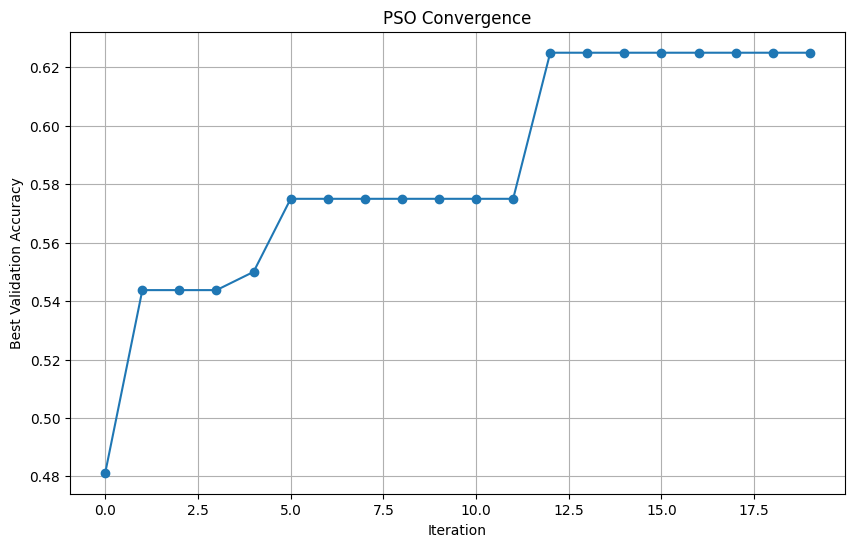

In [ ]:
# Plotting code (after running PSO)
plt.figure(figsize=(10, 6))
plt.plot(pso_results_history['iterations'], pso_results_history['global_best_scores'], 'o-')
plt.title('PSO Convergence')
plt.xlabel('Iteration')
plt.ylabel('Best Validation Accuracy')
plt.grid(True)
plt.show()

#**Final Model**

##**Final Model Training**

In [ ]:
# Train Final PSO-Optimized Model
print("\n===== TRAINING FINAL MODEL WITH OPTIMIZED HYPERPARAMETERS =====")
final_model = create_alexnet_model_with_params(best_params)
print("\nFinal Model Summary:")
final_model.summary()


===== TRAINING FINAL MODEL WITH OPTIMIZED HYPERPARAMETERS =====

Final Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 55, 55, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 27, 27, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 27, 27, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 13, 13, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 13, 13, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 13, 13, 384)    │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 13, 13, 256)    │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 9216)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │    37,752,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │        12,291 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 58,293,635 (222.37 MB)

 Trainable params: 58,293,635 (222.37 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Create callbacks for final training
checkpoint = ModelCheckpoint(
    'alexnet_pso_best_model.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=0.00001,
    verbose=1
)

In [ ]:
# Train the final model
epochs = 50  # Use same epochs as standard model for fair comparison
history = final_model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // BATCH_SIZE,
    callbacks=[checkpoint, early_stop, reduce_lr],
    verbose=1
)

Epoch 1/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.3473 - loss: 1.0898
Epoch 1: val_accuracy improved from -inf to 0.51042, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.3478 - loss: 1.0896 - val_accuracy: 0.5104 - val_loss: 1.0521 - learning_rate: 0.0100
Epoch 2/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 969ms/step - accuracy: 0.4476 - loss: 1.0499
Epoch 2: val_accuracy did not improve from 0.51042
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.4477 - loss: 1.0497 - val_accuracy: 0.3562 - val_loss: 1.0958 - learning_rate: 0.0100
Epoch 3/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 826ms/step - accuracy: 0.4536 - loss: 0.9968
Epoch 3: val_accuracy did not improve from 0.51042
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 957ms/step - accuracy: 0.4534 - loss: 0.9971 - val_accuracy: 0.3792 - val_loss: 1.0499 - learning_rate: 0.0100
Epoch 4/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 836ms/step - accuracy: 0.4629 - loss: 1.0131
Epoch 4: val_accuracy improved from 0.51042 to 0.52500, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.4631 - loss: 1.0131 - val_accuracy: 0.5250 - val_loss: 0.9243 - learning_rate: 0.0100
Epoch 5/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 981ms/step - accuracy: 0.5190 - loss: 0.9316
Epoch 5: val_accuracy improved from 0.52500 to 0.53750, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - accuracy: 0.5192 - loss: 0.9317 - val_accuracy: 0.5375 - val_loss: 0.9314 - learning_rate: 0.0100
Epoch 6/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6060 - loss: 0.8505
Epoch 6: val_accuracy improved from 0.53750 to 0.65833, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.6061 - loss: 0.8503 - val_accuracy: 0.6583 - val_loss: 0.7857 - learning_rate: 0.0100
Epoch 7/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6298 - loss: 0.7706
Epoch 7: val_accuracy improved from 0.65833 to 0.72292, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - accuracy: 0.6299 - loss: 0.7706 - val_accuracy: 0.7229 - val_loss: 0.6977 - learning_rate: 0.0100
Epoch 8/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6561 - loss: 0.7364
Epoch 8: val_accuracy did not improve from 0.72292
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.6566 - loss: 0.7360 - val_accuracy: 0.7125 - val_loss: 0.6798 - learning_rate: 0.0100
Epoch 9/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 827ms/step - accuracy: 0.6826 - loss: 0.7241
Epoch 9: val_accuracy improved from 0.72292 to 0.76042, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.6830 - loss: 0.7234 - val_accuracy: 0.7604 - val_loss: 0.6074 - learning_rate: 0.0100
Epoch 10/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7298 - loss: 0.6359
Epoch 10: val_accuracy did not improve from 0.76042
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.7297 - loss: 0.6360 - val_accuracy: 0.6521 - val_loss: 0.6982 - learning_rate: 0.0100
Epoch 11/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 828ms/step - accuracy: 0.7387 - loss: 0.6057
Epoch 11: val_accuracy improved from 0.76042 to 0.83125, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.7386 - loss: 0.6059 - val_accuracy: 0.8313 - val_loss: 0.4686 - learning_rate: 0.0100
Epoch 12/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 975ms/step - accuracy: 0.7508 - loss: 0.5984
Epoch 12: val_accuracy did not improve from 0.83125
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.7508 - loss: 0.5986 - val_accuracy: 0.6854 - val_loss: 0.6791 - learning_rate: 0.0100
Epoch 13/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 835ms/step - accuracy: 0.7576 - loss: 0.5918
Epoch 13: val_accuracy did not improve from 0.83125
60/60 ━━━━━━━━━━━━━━━━━━━━ 58s 963ms/step - accuracy: 0.7578 - loss: 0.5912 - val_accuracy: 0.8271 - val_loss: 0.4733 - learning_rate: 0.0100
Epoch 14/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 833ms/step - accuracy: 0.7837 - loss: 0.5246
Epoch 14: val_accuracy did not improve from 0.83125

Epoch 14: ReduceLROnPlateau reducing learning rate to 0.0019999999552965165.
60/60 ━━━━━━━━━━━━━━━━━━━━ 58s 962ms/step - accuracy: 0.7840 - loss: 0.5240 - val_acc

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.8056 - loss: 0.4832 - val_accuracy: 0.8729 - val_loss: 0.3631 - learning_rate: 0.0020
Epoch 16/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 972ms/step - accuracy: 0.8780 - loss: 0.3499
Epoch 16: val_accuracy improved from 0.87292 to 0.88958, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.8780 - loss: 0.3496 - val_accuracy: 0.8896 - val_loss: 0.3153 - learning_rate: 0.0020
Epoch 17/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8595 - loss: 0.3517
Epoch 17: val_accuracy improved from 0.88958 to 0.89375, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.8597 - loss: 0.3515 - val_accuracy: 0.8938 - val_loss: 0.3053 - learning_rate: 0.0020
Epoch 18/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8774 - loss: 0.3082
Epoch 18: val_accuracy did not improve from 0.89375
60/60 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.8776 - loss: 0.3081 - val_accuracy: 0.8833 - val_loss: 0.3371 - learning_rate: 0.0020
Epoch 19/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 837ms/step - accuracy: 0.8810 - loss: 0.3090
Epoch 19: val_accuracy improved from 0.89375 to 0.89792, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.8812 - loss: 0.3088 - val_accuracy: 0.8979 - val_loss: 0.2621 - learning_rate: 0.0020
Epoch 20/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8851 - loss: 0.3107
Epoch 20: val_accuracy improved from 0.89792 to 0.90625, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8853 - loss: 0.3104 - val_accuracy: 0.9062 - val_loss: 0.2556 - learning_rate: 0.0020
Epoch 21/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8884 - loss: 0.2958
Epoch 21: val_accuracy improved from 0.90625 to 0.91875, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.8885 - loss: 0.2957 - val_accuracy: 0.9187 - val_loss: 0.2511 - learning_rate: 0.0020
Epoch 22/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9087 - loss: 0.2767
Epoch 22: val_accuracy did not improve from 0.91875
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.9087 - loss: 0.2764 - val_accuracy: 0.8917 - val_loss: 0.3702 - learning_rate: 0.0020
Epoch 23/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 826ms/step - accuracy: 0.8915 - loss: 0.2881
Epoch 23: val_accuracy did not improve from 0.91875
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 953ms/step - accuracy: 0.8916 - loss: 0.2878 - val_accuracy: 0.9187 - val_loss: 0.2416 - learning_rate: 0.0020
Epoch 24/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 830ms/step - accuracy: 0.9126 - loss: 0.2347
Epoch 24: val_accuracy did not improve from 0.91875
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 956ms/step - accuracy: 0.9126 - loss: 0.2346 - val_accuracy: 0.8938 - val_loss: 0.2690 - learning_rate: 0.0020
Epoch 25/50
60/60 ━━━━━━

60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.9256 - loss: 0.2171 - val_accuracy: 0.9229 - val_loss: 0.2338 - learning_rate: 0.0020
Epoch 26/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 969ms/step - accuracy: 0.9267 - loss: 0.2069
Epoch 26: val_accuracy did not improve from 0.92292
60/60 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.9266 - loss: 0.2071 - val_accuracy: 0.9125 - val_loss: 0.2543 - learning_rate: 0.0020
Epoch 27/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 831ms/step - accuracy: 0.9166 - loss: 0.2242
Epoch 27: val_accuracy did not improve from 0.92292
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 957ms/step - accuracy: 0.9164 - loss: 0.2244 - val_accuracy: 0.9083 - val_loss: 0.2496 - learning_rate: 0.0020
Epoch 28/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 832ms/step - accuracy: 0.9188 - loss: 0.2109
Epoch 28: val_accuracy did not improve from 0.92292
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 959ms/step - accuracy: 0.9189 - loss: 0.2108 - val_accuracy: 0.9208 - val_loss: 0.2194 - learning_rate: 0.0020
Epoch 29/50
60/60 ━━━

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.9277 - loss: 0.2093 - val_accuracy: 0.9292 - val_loss: 0.2142 - learning_rate: 0.0020
Epoch 31/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9145 - loss: 0.2159
Epoch 31: val_accuracy did not improve from 0.92917
60/60 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.9144 - loss: 0.2165 - val_accuracy: 0.9167 - val_loss: 0.2118 - learning_rate: 0.0020
Epoch 32/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 831ms/step - accuracy: 0.9296 - loss: 0.2032
Epoch 32: val_accuracy did not improve from 0.92917
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 960ms/step - accuracy: 0.9294 - loss: 0.2034 - val_accuracy: 0.9229 - val_loss: 0.2152 - learning_rate: 0.0020
Epoch 33/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 834ms/step - accuracy: 0.9422 - loss: 0.1657
Epoch 33: val_accuracy did not improve from 0.92917
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 959ms/step - accuracy: 0.9421 - loss: 0.1659 - val_accuracy: 0.9167 - val_loss: 0.2228 - learning_rate: 0.0020
Epoch 34/50
60/60 ━━━━━━

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.9330 - loss: 0.1869 - val_accuracy: 0.9333 - val_loss: 0.1818 - learning_rate: 0.0020
Epoch 35/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9230 - loss: 0.1996
Epoch 35: val_accuracy did not improve from 0.93333
60/60 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.9230 - loss: 0.1997 - val_accuracy: 0.9062 - val_loss: 0.2641 - learning_rate: 0.0020
Epoch 36/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 833ms/step - accuracy: 0.9415 - loss: 0.1589
Epoch 36: val_accuracy did not improve from 0.93333
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 960ms/step - accuracy: 0.9414 - loss: 0.1592 - val_accuracy: 0.9271 - val_loss: 0.1920 - learning_rate: 0.0020
Epoch 37/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 836ms/step - accuracy: 0.9303 - loss: 0.1857
Epoch 37: val_accuracy did not improve from 0.93333

Epoch 37: ReduceLROnPlateau reducing learning rate to 0.0003999999724328518.
60/60 ━━━━━━━━━━━━━━━━━━━━ 58s 964ms/step - accuracy: 0.9302 - loss: 0.1861 - val_accura

60/60 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.9153 - loss: 0.2222 - val_accuracy: 0.9396 - val_loss: 0.1544 - learning_rate: 4.0000e-04
Epoch 39/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9435 - loss: 0.1578
Epoch 39: val_accuracy did not improve from 0.93958
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.9436 - loss: 0.1576 - val_accuracy: 0.9396 - val_loss: 0.1935 - learning_rate: 4.0000e-04
Epoch 40/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 827ms/step - accuracy: 0.9477 - loss: 0.1342
Epoch 40: val_accuracy improved from 0.93958 to 0.94792, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.9477 - loss: 0.1341 - val_accuracy: 0.9479 - val_loss: 0.1434 - learning_rate: 4.0000e-04
Epoch 41/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 974ms/step - accuracy: 0.9595 - loss: 0.1232
Epoch 41: val_accuracy did not improve from 0.94792
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.9593 - loss: 0.1234 - val_accuracy: 0.9458 - val_loss: 0.1798 - learning_rate: 4.0000e-04
Epoch 42/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 832ms/step - accuracy: 0.9573 - loss: 0.1180
Epoch 42: val_accuracy did not improve from 0.94792
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 960ms/step - accuracy: 0.9572 - loss: 0.1180 - val_accuracy: 0.9333 - val_loss: 0.1880 - learning_rate: 4.0000e-04
Epoch 43/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 833ms/step - accuracy: 0.9561 - loss: 0.1142
Epoch 43: val_accuracy did not improve from 0.94792
60/60 ━━━━━━━━━━━━━━━━━━━━ 58s 962ms/step - accuracy: 0.9562 - loss: 0.1143 - val_accuracy: 0.9396 - val_loss: 0.1401 - learning_rate: 4.0000e-04
Epoch

60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.9511 - loss: 0.1272 - val_accuracy: 0.9521 - val_loss: 0.1461 - learning_rate: 4.0000e-04
Epoch 45/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 977ms/step - accuracy: 0.9565 - loss: 0.1241
Epoch 45: val_accuracy did not improve from 0.95208
60/60 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.9564 - loss: 0.1242 - val_accuracy: 0.9479 - val_loss: 0.1312 - learning_rate: 4.0000e-04
Epoch 46/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 827ms/step - accuracy: 0.9490 - loss: 0.1331
Epoch 46: val_accuracy improved from 0.95208 to 0.96042, saving model to alexnet_pso_best_model.h5


60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.9490 - loss: 0.1329 - val_accuracy: 0.9604 - val_loss: 0.1166 - learning_rate: 4.0000e-04
Epoch 47/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9541 - loss: 0.1253
Epoch 47: val_accuracy did not improve from 0.96042
60/60 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.9541 - loss: 0.1253 - val_accuracy: 0.9500 - val_loss: 0.1452 - learning_rate: 4.0000e-04
Epoch 48/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 834ms/step - accuracy: 0.9454 - loss: 0.1292
Epoch 48: val_accuracy did not improve from 0.96042
60/60 ━━━━━━━━━━━━━━━━━━━━ 58s 962ms/step - accuracy: 0.9456 - loss: 0.1291 - val_accuracy: 0.9438 - val_loss: 0.1714 - learning_rate: 4.0000e-04
Epoch 49/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 832ms/step - accuracy: 0.9538 - loss: 0.1238
Epoch 49: val_accuracy did not improve from 0.96042

Epoch 49: ReduceLROnPlateau reducing learning rate to 7.999999215826393e-05.
60/60 ━━━━━━━━━━━━━━━━━━━━ 58s 961ms/step - accuracy: 0.9539 - loss: 0.1237 

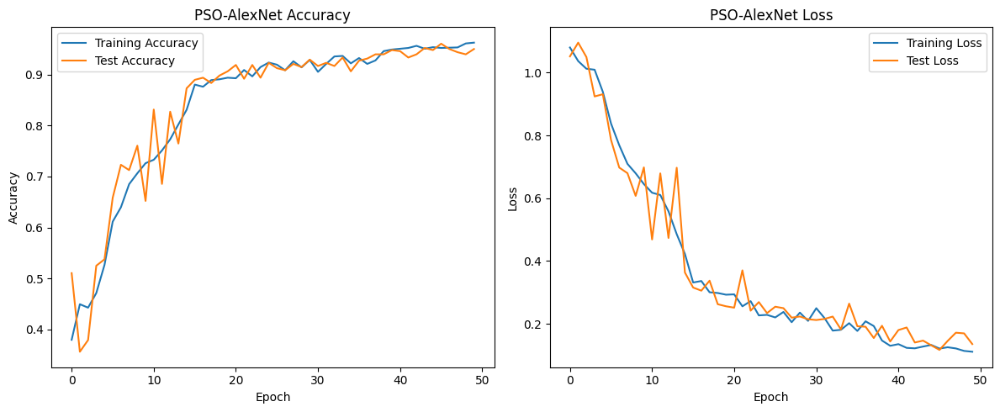

In [ ]:
# Plot training history
plt.figure(figsize=(12, 5))
# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('PSO-AlexNet Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('PSO-AlexNet Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()

##**Evaluasi Model Final**

In [ ]:
# Evaluate the final model on test data
print("\n=== Evaluating Final PSO-AlexNet Model on Test Data ===")
test_loss, test_acc = final_model.evaluate(test_generator, verbose=1)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


=== Evaluating Final PSO-AlexNet Model on Test Data ===
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.9262 - loss: 0.1753
Test Loss: 0.1284
Test Accuracy: 0.9500


In [ ]:
# Get final training accuracy
train_loss, train_acc = final_model.evaluate(train_generator, verbose=1)
print(f"Final Training Accuracy: {train_acc:.4f}")

# Make predictions on test data
y_pred_prob = final_model.predict(test_generator, verbose=1)
y_pred = np.argmax(y_pred_prob, axis=1)

# Get true labels
test_generator.reset()
y_true = test_generator.classes

# Classification report
print("\nClassification Report for PSO-AlexNet:")
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
print(classification_report(y_true, y_pred, target_names=class_names))

60/60 ━━━━━━━━━━━━━━━━━━━━ 30s 493ms/step - accuracy: 0.9604 - loss: 0.1047
Final Training Accuracy: 0.9594
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step

Classification Report for PSO-AlexNet:
              precision    recall  f1-score   support

      Kawung       0.95      0.90      0.93       200
      Parang       0.97      0.99      0.98       200
     Truntum       0.93      0.95      0.94       200

    accuracy                           0.95       600
   macro avg       0.95      0.95      0.95       600
weighted avg       0.95      0.95      0.95       600



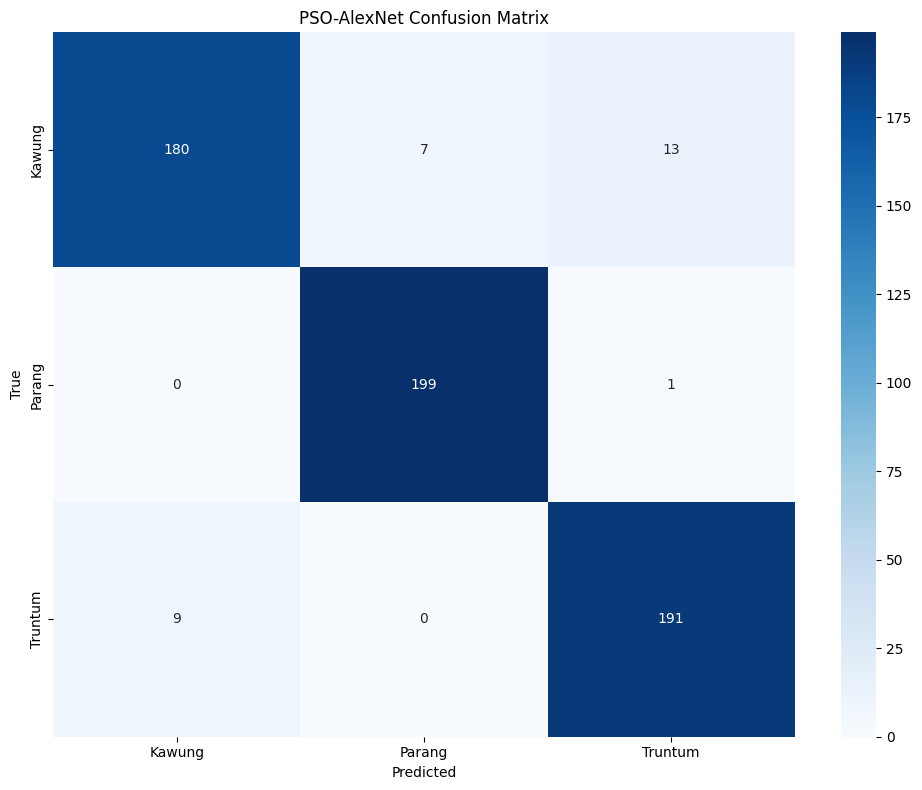

In [ ]:
# Confusion matrix
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('PSO-AlexNet Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

In [ ]:
# Create metrics dictionary
pso_metrics = {
    'Accuracy': test_acc,
    'Macro-precision': report['macro avg']['precision'],
    'Macro-recall': report['macro avg']['recall'],
    'Macro-F1-score': report['macro avg']['f1-score'],
    'Training-Accuracy': train_acc
}

#**Result Summary**

In [ ]:
# Compare Standard and PSO-Optimized Models
print("\n===== COMPARISON BETWEEN STANDARD AND PSO-OPTIMIZED MODELS =====")
print("\n=== Comparison of the standard model with PSO-optimized AlexNet ===")

headers = ["Metric", "Standard AlexNet", "PSO-AlexNet", "Improvement (%)"]
comparison_data = []

for metric in standard_metrics:
    if isinstance(standard_metrics[metric], (int, float)) and isinstance(pso_metrics[metric], (int, float)):
        improvement = ((pso_metrics[metric] - standard_metrics[metric]) / standard_metrics[metric]) * 100
        improvement_str = f"{improvement:.2f}%"
    else:
        improvement_str = "N/A"

    row = [
        metric,
        f"{standard_metrics[metric]:.5f}" if isinstance(standard_metrics[metric], float) else standard_metrics[metric],
        f"{pso_metrics[metric]:.5f}" if isinstance(pso_metrics[metric], float) else pso_metrics[metric],
        improvement_str
    ]
    comparison_data.append(row)

print(tabulate(comparison_data, headers=headers, tablefmt="grid"))


===== COMPARISON BETWEEN STANDARD AND PSO-OPTIMIZED MODELS =====

=== Comparison of the standard model with PSO-optimized AlexNet ===
+-------------------+--------------------+---------------+-------------------+
| Metric            |   Standard AlexNet |   PSO-AlexNet | Improvement (%)   |
+===================+====================+===============+===================+
| Accuracy          |            0.7     |       0.95    | 35.71%            |
+-------------------+--------------------+---------------+-------------------+
| Macro-precision   |            0.6954  |       0.95004 | 36.62%            |
+-------------------+--------------------+---------------+-------------------+
| Macro-recall      |            0.7     |       0.95    | 35.71%            |
+-------------------+--------------------+---------------+-------------------+
| Macro-F1-score    |            0.69266 |       0.94965 | 37.10%            |
+-------------------+--------------------+---------------+-----------------

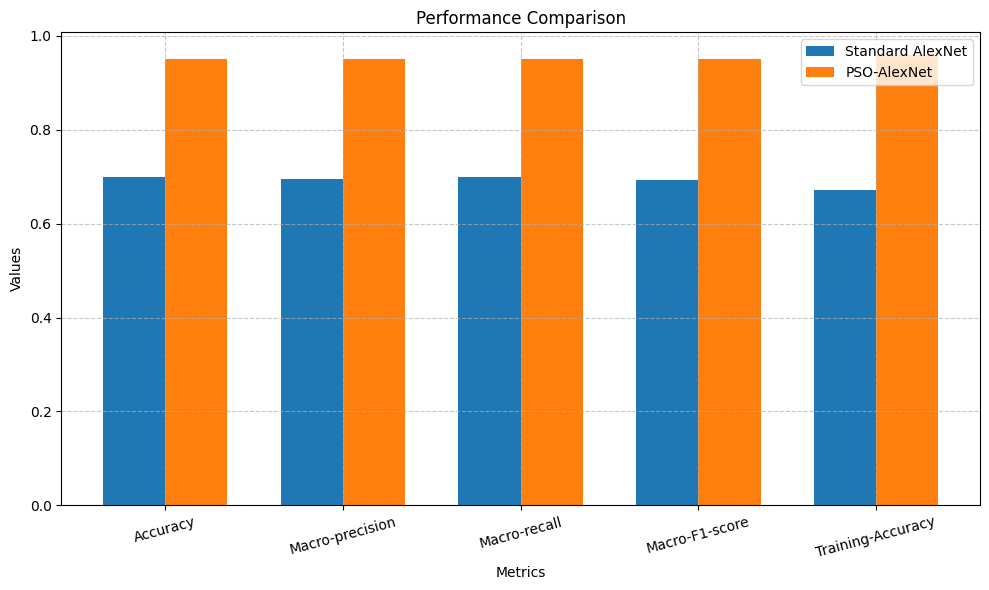

In [ ]:
# Plot comparison chart
plt.figure(figsize=(10, 6))
metrics_to_plot = ['Accuracy', 'Macro-precision', 'Macro-recall', 'Macro-F1-score', 'Training-Accuracy']
x = np.arange(len(metrics_to_plot))
width = 0.35

standard_values = [standard_metrics[m] for m in metrics_to_plot]
pso_values = [pso_metrics[m] for m in metrics_to_plot]

plt.bar(x - width/2, standard_values, width, label='Standard AlexNet')
plt.bar(x + width/2, pso_values, width, label='PSO-AlexNet')
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Performance Comparison')
plt.xticks(x, metrics_to_plot, rotation=15)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
print("\n===== SUMMARY =====")
print(f"Standard AlexNet Test Accuracy: {standard_metrics['Accuracy']:.4f}")
print(f"PSO-optimized AlexNet Test Accuracy: {pso_metrics['Accuracy']:.4f}")

improvement = ((pso_metrics['Accuracy'] - standard_metrics['Accuracy']) / standard_metrics['Accuracy']) * 100
print(f"Accuracy Improvement: {improvement:.2f}%")


===== SUMMARY =====
Standard AlexNet Test Accuracy: 0.7000
PSO-optimized AlexNet Test Accuracy: 0.9500
Accuracy Improvement: 35.71%


In [ ]:
# Print summary of all results
print("\n=== Summary of Results ===")
print(f"Best hyperparameters found by PSO:")
print(f"Dropout rate: {dropout_rate_options[int(best_params['dropout_rate'])]:.4f}")
print(f"Learning rate: {learning_rate_options[int(best_params['learning_rate'])]:.6f}")
print(f"Activation function: {activation_functions[int(best_params['activation'])]}")
print(f"Optimizer: {optimizers[int(best_params['optimizer'])]}")


=== Summary of Results ===
Best hyperparameters found by PSO:
Dropout rate: 0.1000
Learning rate: 0.010000
Activation function: relu
Optimizer: SGD


In [ ]:
print(f"\nFinal model accuracy on test set: {test_acc:.4f}")
print("\nClassification metrics summary:")
print(f" - Precision (macro avg): {report['macro avg']['precision']:.4f}")
print(f" - Recall (macro avg): {report['macro avg']['recall']:.4f}")
print(f" - F1-score (macro avg): {report['macro avg']['f1-score']:.4f}")

# Compare with standard model
improvement = ((test_acc - standard_metrics['Accuracy']) / standard_metrics['Accuracy']) * 100
print(f"\nImprovement over standard AlexNet: {improvement:.2f}%")


Final model accuracy on test set: 0.9500

Classification metrics summary:
 - Precision (macro avg): 0.9500
 - Recall (macro avg): 0.9500
 - F1-score (macro avg): 0.9497

Improvement over standard AlexNet: 35.71%


#**Save Final Model**

In [ ]:
# Save the final model
model_save_path = os.path.join(base_dir, 'Final Model Alexnet PSO.h5')
final_model.save(model_save_path)
print(f"\nFinal model saved to: {model_save_path}")


Final model saved to: /content/drive/MyDrive/Batik/Final Model Alexnet PSO.h5


#**Uji pada data baru**

##**Load Data**

In [ ]:
# Clear any previous Keras session to ensure a clean slate
tf.keras.backend.clear_session()

In [ ]:
# Set paths
base_dir = '/content/drive/MyDrive/Batik/'
model_path = '/content/drive/MyDrive/Batik/Final Model Alexnet PSO.h5'

# For visualizing new images
new_data_dir = '/content/drive/MyDrive/Batik/Data Baru'

# For better visualization, let's create an output directory
output_dir = os.path.join(base_dir, 'Layer_Visualizations')
os.makedirs(output_dir, exist_ok=True)

# Target size for resizing - same as what was used in training
TARGET_SIZE = (227, 227)

# Class names
class_names = ['Kawung', 'Parang', 'Truntum']

print("Setup complete. Base directory:", base_dir)
print("Output directory:", output_dir)

Setup complete. Base directory: /content/drive/MyDrive/Batik/
Output directory: /content/drive/MyDrive/Batik/Layer_Visualizations


In [ ]:
def preprocess_input_alexnet(x):
    # Scale to [0, 1]
    x = x / 255.0
    return x

In [ ]:
def preprocess_image(img_path):
    """Load and preprocess a single image for prediction"""
    img = load_img(img_path, target_size=TARGET_SIZE)
    arr = img_to_array(img)
    arr = np.expand_dims(arr, 0)
    return preprocess_input_alexnet(arr)

In [ ]:
print("Loading model...")
model = load_model(model_path)

dummy_image_path = os.path.join(new_data_dir, 'Kawung', 'Kawung01.jpg')
dummy_preprocessed_image = preprocess_image(dummy_image_path)

if not model.built:
    print("Model not built yet. Building it explicitly...")
    # Cara paling aman untuk membangun model yang dimuat adalah dengan memanggilnya.
    # Jika AlexNet Anda dimulai dengan Conv2D, ini akan berhasil.
    try:
        _ = model(dummy_preprocessed_image, training=False)
        print("Model built and initialized by dummy call!")
    except Exception as e:
        print(f"Failed to build model via call, trying .build(): {e}")
        model.build((None, TARGET_SIZE[0], TARGET_SIZE[1], 3))
        _ = model.predict(dummy_preprocessed_image, verbose=0)
        print("Model built explicitly and initialized!")
else:
    print("Model is already built.")
    # Bahkan jika sudah built, lakukan prediksi dummy untuk memastikan semua koneksi aktif.
    _ = model.predict(dummy_preprocessed_image, verbose=0)
    print("Model built and fully initialized successfully!")

print("Running model summary...")
model.summary()

Loading model...


Model is already built.


Model built and fully initialized successfully!
Running model summary...


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 55, 55, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 27, 27, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 27, 27, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 13, 13, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 13, 13, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 13, 13, 384)    │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 13, 13, 256)    │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 9216)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │    37,752,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │        12,291 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 58,293,637 (222.37 MB)

 Trainable params: 58,293,635 (222.37 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

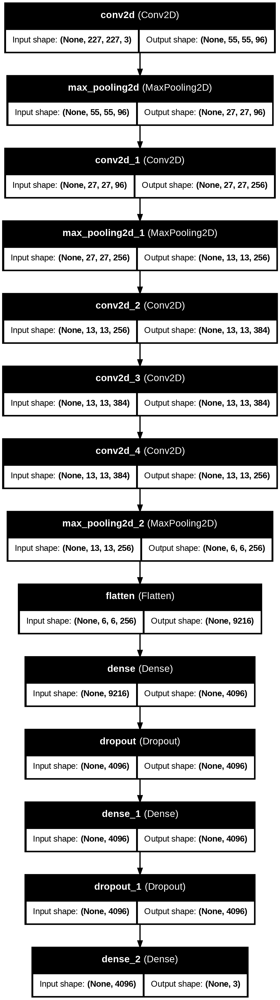

In [ ]:
# Misal nama model kamu adalah "model"
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

##**Fungsi Klasifikasi Data Tunggal**

In [ ]:
def visualize_image_only(img_path):
    """Function 1: Visualize and analyze an image independently"""
    print("="*80)
    print("1. BASIC IMAGE VISUALIZATION AND ANALYSIS")
    print("="*80)

    img = load_img(img_path, target_size=TARGET_SIZE)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"Original Image: {os.path.basename(img_path)}")
    plt.axis('off')
    plt.show()

    arr = img_to_array(img)
    print(f"Image file: {os.path.basename(img_path)}")
    print(f"Shape: {arr.shape}")
    print(f"Min/Max/Mean/Std: {arr.min():.2f}/{arr.max():.2f}/{arr.mean():.2f}/{arr.std():.2f}")

    return arr

In [ ]:
def predict_image_only(model, img_path):
    """Function 2: Predict class for image independently"""
    print("="*80)
    print("2. IMAGE PREDICTION ANALYSIS")
    print("="*80)

    arr = preprocess_image(img_path)
    preds = model.predict(arr, verbose=0)
    cls = np.argmax(preds[0])
    conf = preds[0][cls]

    img = load_img(img_path, target_size=TARGET_SIZE)
    plt.figure(figsize=(12, 5))

    # Display the image
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"Input Image: {os.path.basename(img_path)}")
    plt.axis('off')

    # Display prediction probabilities
    plt.subplot(1, 2, 2)
    y = np.arange(len(class_names))
    plt.barh(y, preds[0])
    plt.yticks(y, class_names)
    plt.title(f"Prediction: {class_names[cls]} ({conf:.2%})")
    plt.xlabel("Probability")
    plt.tight_layout()
    plt.show()

    # Print detailed results
    print(f"Predicted Class: {class_names[cls]}")
    print(f"Confidence: {conf:.4f} ({conf:.2%})")
    print("\nAll class probabilities:")
    for i, c in enumerate(class_names):
        print(f"  {c}: {preds[0][i]:.4f} ({preds[0][i]:.2%})")

    return cls, conf, preds[0]

In [ ]:
def display_image_matrix_enhanced(img_path, max_cols_display=7):
    """Enhanced function to display image matrix with normalization for research purposes,
    modified to display the complete matrix."""
    print("="*80)
    print("3. COMPLETE IMAGE MATRIX ANALYSIS - NORMALIZED FOR RESEARCH")
    print("="*80)

    # Load and preprocess image
    img = load_img(img_path, target_size=TARGET_SIZE)
    img_array = img_to_array(img)

    # Normalize to 0-1 range
    img_normalized = img_array / 255.0

    print(f"File: {os.path.basename(img_path)}")
    print(f"Dimensions: {img_array.shape}")
    print(f"Size: {img_array.shape[0]} x {img_array.shape[1]} pixels")
    print(f"Channels: {img_array.shape[2]} (RGB)")
    print(f"Values: Normalized to [0, 1] range for research analysis")

    height, width, channels = img_normalized.shape

    # MODIFICATION START: Display all rows and columns
    display_rows = list(range(height))
    display_cols = list(range(width))
    show_col_ellipsis = False # No ellipsis as all columns are displayed

    print(f"\n--- MATRIX DISPLAY STRATEGY ---")
    print(f"Complete matrix display ({height}x{width})")
    print(f"- Rows: All {height} rows displayed")
    print(f"- Columns: All {width} columns displayed")
    # MODIFICATION END

    for channel in range(channels):
        channel_names = ['Red', 'Green', 'Blue']
        print(f"\n{'='*80}")
        print(f"I_{channel + 1} = CHANNEL {channel + 1} ({channel_names[channel]}) - NORMALIZED MATRIX")
        print(f"{'='*80}")

        channel_data = img_normalized[:, :, channel]

        # Display column headers
        print("Row\\Col", end="")
        for j in display_cols: # Iterate through all columns
            print(f"{j:>10}", end="")
        print()

        # Calculate separator line length (simpler now as all columns are displayed)
        separator_length = 8 + len(display_cols) * 10
        print("-" * separator_length)

        # Display matrix rows with proper spacing for research format
        prev_row = -1 # Not strictly needed for full display, but good practice
        for i, row_idx in enumerate(display_rows):
            # No ellipsis logic for rows as all are displayed

            # Display actual row data
            print(f"{row_idx:>6} │", end="")

            # Display all columns
            for j in display_cols:
                value = channel_data[row_idx, j]
                print(f"{value:>9.4f}", end=" ")

            print()
            prev_row = row_idx

        # Research-focused statistics
        print(f"\nResearch Statistics for Channel {channel + 1} ({channel_names[channel]}):")
        print(f"   Matrix size: {height} × {width}")
        print(f"   Value range: [{channel_data.min():.6f}, {channel_data.max():.6f}]")
        print(f"   Mean (μ): {channel_data.mean():.6f}")
        print(f"   Standard deviation (σ): {channel_data.std():.6f}")
        print(f"   Variance (σ²): {channel_data.var():.6f}")

        # Quartile analysis for research
        q1 = np.percentile(channel_data, 25)
        q2 = np.percentile(channel_data, 50)  # median
        q3 = np.percentile(channel_data, 75)
        print(f"   Quartiles: Q1={q1:.4f}, Q2={q2:.4f}, Q3={q3:.4f}")

    # Export information for research documentation
    print(f"\n--- RESEARCH DOCUMENTATION ---")
    print(f"Matrix normalization: Original [0-255] → Normalized [0-1]")
    print(f"Sampling strategy: Complete matrix displayed") # Updated description
    print(f"Column strategy: Complete matrix displayed")   # Updated description
    print(f"Statistical measures: Complete population statistics")
    print(f"Data type: Float64 normalized pixel intensities")

    return img_normalized

In [ ]:
def export_matrix_for_research(img_path, output_file=None):
    """Export complete normalized matrix data for research use"""
    img = load_img(img_path, target_size=TARGET_SIZE)
    img_array = img_to_array(img)
    img_normalized = img_array / 255.0

    if output_file is None:
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        output_file = f"{base_name}_normalized_matrix.npz"

    # Save all channels
    np.savez_compressed(output_file,
                       red_channel=img_normalized[:,:,0],
                       green_channel=img_normalized[:,:,1],
                       blue_channel=img_normalized[:,:,2],
                       original_shape=img_normalized.shape,
                       normalization_info="Normalized from [0-255] to [0-1]")

    print(f"Research matrix data exported to: {output_file}")
    print(f"Channels saved: red_channel, green_channel, blue_channel")
    print(f"Load with: data = np.load('{output_file}')")

    return output_file

In [ ]:
def analyze_layer_kernels_selective(model, layer_name, filter_selection="first_last", specific_filters=None):
    print("="*80)
    print(f"SELECTIVE KERNEL/FILTER ANALYSIS FOR {layer_name.upper()}")
    print("="*80)

    try:
        if not model.built and hasattr(model, 'build'):
            try:
                input_shape = model.layers[0].input_shape
                if isinstance(input_shape, list) and len(input_shape) > 0:
                    input_shape = input_shape[0]

                if input_shape[0] is None:
                    model.build((None, *input_shape[1:]))
                else:
                    model.build(input_shape)
                print("Model built explicitly before getting layer.")
            except Exception as e_build:
                print(f"Warning: Could not explicitly build model before getting layer: {e_build}")
                pass

        layer = model.get_layer(layer_name)
        weights = layer.get_weights()

        if not weights:
            print(f"No weights found in layer {layer_name}")
            return None, None

        kernels = weights[0]
        biases = weights[1] if len(weights) > 1 else None

        print(f"Layer: {layer_name}")
        print(f"Kernel dimensions: {kernels.shape}")
        print(f"Kernel size: {kernels.shape[0]}x{kernels.shape[1]}")
        print(f"Input channels: {kernels.shape[2]}")
        print(f"Output channels (filters): {kernels.shape[3]}")

        if biases is not None:
            print(f"Bias dimensions: {biases.shape}")

        print(f"\n--- KERNEL STATISTICS (SUMMARY) ---")
        print(f"Weight Range: [{kernels.min():.6f}, {kernels.max():.6f}]")
        print(f"Mean ± Std: {kernels.mean():.6f} ± {kernels.std():.6f}")

        total_filters = kernels.shape[3]
        total_in_channels = kernels.shape[2]

        # Tentukan filter mana yang akan ditampilkan untuk analisis matriks
        if filter_selection == "all":
            filters_to_show = list(range(total_filters))
        elif filter_selection == "first_last":
            if total_filters == 1:
                filters_to_show = [0]
            elif total_filters == 2:
                filters_to_show = [0, 1]
            else:
                filters_to_show = [0, total_filters - 1]
        elif filter_selection == "first_n":
            n = specific_filters if isinstance(specific_filters, int) else 3
            filters_to_show = list(range(min(n, total_filters)))
        elif filter_selection == "last_n":
            n = specific_filters if isinstance(specific_filters, int) else 3
            start_idx = max(0, total_filters - n)
            filters_to_show = list(range(start_idx, total_filters))
        elif filter_selection == "first_last_n":
            n = specific_filters if isinstance(specific_filters, int) else 5
            if total_filters <= n * 2:
                # Jika total filter sedikit, tampilkan semua
                filters_to_show = list(range(total_filters))
            else:
                # n filter pertama + n filter terakhir
                first_n = list(range(n))
                last_n = list(range(total_filters - n, total_filters))
                filters_to_show = first_n + last_n
        elif filter_selection == "specific" and specific_filters:
            filters_to_show = [f for f in specific_filters if 0 <= f < total_filters]
        else:
            # Default: first and last
            filters_to_show = [0, total_filters - 1] if total_filters > 1 else [0]

        # Remove duplicates and sort
        filters_to_show = sorted(list(set(filters_to_show)))

        print(f"\n--- SELECTED FILTERS DETAILED ANALYSIS ---")
        print(f"Selection mode: {filter_selection}")
        print(f"Showing detailed analysis for {len(filters_to_show)} out of {total_filters} filters.")
        print(f"Selected filters: {[f+1 for f in filters_to_show]} (1-based numbering)")

        # Display selected filters
        for filter_idx in filters_to_show:
            print(f"\n{'='*50}")
            print(f"FILTER {filter_idx + 1}/{total_filters}")
            print(f"{'='*50}")

            print(f"    Showing kernel matrices for ALL {total_in_channels} input channels:")

            # Display ALL input channels for selected filter
            for in_channel in range(total_in_channels):
                print(f"    Ch{in_channel + 1}/{total_in_channels}:")
                kernel_matrix = kernels[:, :, in_channel, filter_idx]

                rows, cols = kernel_matrix.shape

                # Print column headers
                print("      ", end="")
                for j in range(cols):
                    print(f"{j:9}", end="")
                print()

                # Separator line
                separator_length = 8 + cols * 9
                print("    " + "-" * separator_length)

                # Print matrix rows and columns
                for r_idx in range(rows):
                    print(f"{r_idx:>4} │", end="")
                    for c_idx in range(cols):
                        print(f"{kernel_matrix[r_idx, c_idx]:9.4f}", end="")
                    print()

            if biases is not None:
                print(f"Bias: {biases[filter_idx]:8.4f}")

            filter_weights = kernels[:, :, :, filter_idx]
            print(f"Range (this filter): [{filter_weights.min():.4f}, {filter_weights.max():.4f}]")

        # Visualization - Tampilkan SEMUA kernel
        print(f"\n--- VISUALIZING ALL KERNELS ---")

        cols = min(8, total_filters)  # Maksimal 8 kolom
        rows = (total_filters + cols - 1) // cols

        print(f"Displaying ALL {total_filters} filters in the visualization.")

        plt.figure(figsize=(cols * 2, rows * 1.5))

        for filter_idx in range(total_filters):
            f = kernels[:, :, :, filter_idx]
            f_norm = (f - f.min()) / (f.max() - f.min() + 1e-7)
            if len(f_norm.shape) > 2:
                f_norm = f_norm.mean(-1)

            plt.subplot(rows, cols, filter_idx+1)
            plt.imshow(f_norm, cmap='viridis')
            plt.axis('off')
            plt.title(f'F{filter_idx+1}', fontsize=8)

        plt.suptitle(f'All Kernels - {layer_name}\n(All {total_filters} filters)', fontsize=12)
        plt.tight_layout()
        plt.show()

        return None, None

    except Exception as e:
        print(f"Error analyzing kernels for {layer_name}: {e}")
        import traceback
        traceback.print_exc()
        return None, None

In [ ]:
def display_feature_maps_calculation_only(model, img_path, layer_name, position=(0,0)):
    print("="*80)
    print(f"5. FEATURE MAPS CALCULATION ANALYSIS - {layer_name.upper()}")
    print("="*80)

    try:
        arr = preprocess_image(img_path)

        if not model.built:
            print("Model not built yet. Building it explicitly...")
            # Use arr.shape for building if first layer, else a dummy shape
            try:
                if len(arr.shape) == len(model.input.shape) - 1:
                    dummy_input_for_build = np.expand_dims(arr, axis=0)
                else:
                    dummy_input_for_build = arr

                _ = model(dummy_input_for_build, training=False)
                print("Model built explicitly and initialized!")
            except Exception as e_dummy_build:
                print(f"Warning: Could not build model explicitly using dummy input: {e_dummy_build}")
                print("Attempting to build with fallback shape (None, *TARGET_SIZE, 3).")
                model.build((None, *TARGET_SIZE, 3)) # Fallback if initial build fails
                print("Model built with fallback shape.")
        else:
            try:
                if len(arr.shape) == len(model.input.shape) - 1:
                    dummy_input_for_predict = np.expand_dims(arr, axis=0)
                else:
                    dummy_input_for_predict = arr
                _ = model(dummy_input_for_predict, training=False)
            except Exception as e_predict:
                print(f"Warning: Could not run prediction on built model properly, proceeding anyway: {e_predict}")


        layer = model.get_layer(layer_name)
        weights = layer.get_weights()

        if not weights:
            print(f"No weights found in layer {layer_name}")
            return None

        kernel = weights[0]
        bias = weights[1] if len(weights) > 1 else None

        layer_idx = None
        for i, l in enumerate(model.layers):
            if l.name == layer_name:
                layer_idx = i
                break

        if layer_idx is None:
            raise ValueError(f"Layer '{layer_name}' not found in the model.")

        if layer_idx == 0:
            # Input to the first layer is the preprocessed image
            img = load_img(img_path, target_size=TARGET_SIZE)
            input_data = img_to_array(img)
            input_data = np.expand_dims(input_data, axis=0) # Add batch dimension
            input_data = preprocess_input_alexnet(input_data) # Apply AlexNet specific preprocessing
        else:
            # Input to intermediate layer is output from previous layer
            try:
                intermediate_model = tf.keras.Model(inputs=model.input, outputs=model.layers[layer_idx-1].output)
                input_data = intermediate_model.predict(arr, verbose=0)
            except Exception as e:
                print(f"Error getting input data for layer {layer_name} from previous layer using Keras Model: {e}")
                print("Falling back to manual sequential layer execution for input data.")
                temp_output = arr
                for i in range(layer_idx):
                    temp_output = model.layers[i](temp_output)
                input_data = temp_output.numpy() if hasattr(temp_output, 'numpy') else temp_output


        print(f"Layer: {layer_name}")
        print(f"Position for calculation: ({position[0]},{position[1]})")
        print(f"Input to layer '{layer_name}': {input_data.shape}, Kernel shape: {kernel.shape}")

        h, w, in_ch, out_ch = kernel.shape
        y, x = position

        print(f"\n{'='*80}")
        print(f"MANUAL CALCULATIONS FOR ALL FILTERS AT POSITION ({y},{x})")
        print(f"{'='*80}")

        calculated_values = []

        for f in range(out_ch): # Iterate through ALL filters
            print(f"\n--- Filter {f+1}/{out_ch} ---")

            total_sum = 0
            calc_terms_display = [] # To display only a subset of terms
            max_display_terms = 10 # Limit number of terms printed

            for ch in range(in_ch):
                for ky in range(h):
                    for kx in range(w):
                        input_y = y + ky
                        input_x = x + kx

                        # Check if the input coordinates are within bounds
                        if (input_y >= 0 and input_y < input_data.shape[1] and
                            input_x >= 0 and input_x < input_data.shape[2]):
                            input_val = input_data[0, input_y, input_x, ch]
                            kernel_val = kernel[ky, kx, ch, f]
                            product = input_val * kernel_val
                            total_sum += product

                            if len(calc_terms_display) < max_display_terms:
                                # MODIFIKASI: Mengubah menjadi 4 desimal
                                calc_terms_display.append(f"({input_val:.4f}×{kernel_val:.4f})")
                        else:
                            pass # If out of bounds, this term is skipped

            calc_str = " + ".join(calc_terms_display)
            if h * w * in_ch > max_display_terms:
                calc_str += " + ..."
            # MODIFIKASI: Mengubah total_sum menjadi 4 desimal
            print(f"   Sum of (Input × Kernel): {calc_str} = {total_sum:.4f}")

            if bias is not None:
                total_sum_with_bias = total_sum + bias[f]
                # MODIFIKASI: Mengubah bias dan total_sum_with_bias menjadi 4 desimal
                print(f"   + Bias ({bias[f]:.4f}) = {total_sum_with_bias:.4f}")
                total_sum = total_sum_with_bias # Update total_sum for ReLU

            activated_val = max(0, total_sum) # Apply ReLU activation
            # MODIFIKASI: Mengubah activated_val menjadi 4 desimal
            print(f"   ReLU Activated Value = {activated_val:.4f}")
            calculated_values.append(activated_val)

    except Exception as e:
        print(f"Error in feature maps calculation for {layer_name}: {e}")
        import traceback
        traceback.print_exc()
        return None

In [ ]:
def display_all_feature_maps_matrix(model, img_path, layer_name):
    print("="*80)
    print(f"6. COMPLETE FEATURE MAPS MATRIX DISPLAY - {layer_name.upper()}")
    print("="*80)

    try:
        arr = preprocess_image(img_path)

        if not model.built:
            print("Model not built yet. Building it explicitly...")
            try:
                if len(arr.shape) == len(model.input.shape) - 1:
                    dummy_input_for_build = np.expand_dims(arr, axis=0)
                else:
                    dummy_input_for_build = arr
                _ = model(dummy_input_for_build, training=False)
                print("Model built explicitly and initialized!")
            except Exception as e_dummy_build:
                print(f"Warning: Could not build model explicitly using dummy input: {e_dummy_build}")
                print("Attempting to build with fallback shape (None, *TARGET_SIZE, 3).")
                model.build((None, *TARGET_SIZE, 3))
                print("Model built with fallback shape.")
        else:
            try:
                if len(arr.shape) == len(model.input.shape) - 1:
                    dummy_input_for_predict = np.expand_dims(arr, axis=0)
                else:
                    dummy_input_for_predict = arr
                _ = model(dummy_input_for_predict, training=False)
            except Exception as e_predict:
                print(f"Warning: Could not run prediction on built model properly, proceeding anyway: {e_predict}")


        actual_features = None
        try:
            feature_map_model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
            actual_features = feature_map_model.predict(arr, verbose=0)
        except Exception as e:
            print(f"Error using tf.keras.Model to get feature maps for {layer_name}: {e}")
            print("Falling back to manual layer iteration to get feature maps.")
            current_output = arr
            for i, layer_obj in enumerate(model.layers):
                current_output = layer_obj(current_output)
                if layer_obj.name == layer_name:
                    actual_features = current_output.numpy() if hasattr(current_output, 'numpy') else current_output
                    break
            if actual_features is None:
                raise RuntimeError(f"Could not retrieve actual feature maps for layer {layer_name}.")

        if actual_features is None:
            print(f"Could not retrieve actual feature maps for layer {layer_name}.")
            return

        print(f"Feature maps shape: {actual_features.shape}")
        map_height, map_width, out_ch = actual_features.shape[1], actual_features.shape[2], actual_features.shape[3]

        # --- LOGIKA SELEKSI FILTER (FEATURE MAP) UNTUK DISPLAY TEKSTUAL ---
        num_filters_to_display_per_side = 40
        filters_for_textual_display = []

        if out_ch <= 2 * num_filters_to_display_per_side:
            filters_for_textual_display = list(range(out_ch))
            print(f"\n--- ALL FEATURE MAPS MATRICES ({out_ch} filters total) ---")
            print(f"Displaying ALL {out_ch} feature maps.")
        else:
            filters_for_textual_display.extend(range(num_filters_to_display_per_side))
            filters_for_textual_display.extend(range(out_ch - num_filters_to_display_per_side, out_ch))
            filters_for_textual_display = sorted(list(set(filters_for_textual_display)))
            print(f"\n--- SELECTED FEATURE MAPS MATRICES ({out_ch} filters total) ---")
            print(f"Displaying first {num_filters_to_display_per_side} and last {num_filters_to_display_per_side} feature maps (total {len(filters_for_textual_display)}).")


        prev_f_idx_text = -2 # Initialize to ensure no ellipsis on first map
        for f_idx in filters_for_textual_display:
            # Add ellipsis for skipped feature maps in textual display
            if f_idx - prev_f_idx_text > 1: # If there's a gap between displayed filters
                 print("\n" + "="*20 + " ... OMITTED FILTERS ... " + "="*20)
                 print(" " * 30 + "⋮" + " " * 30) # Vertical ellipsis for filters
                 print(" " * 30 + "⋮" + " " * 30)


            print(f"\nS^{f_idx+1} (Filter {f_idx+1} Feature Map):")
            feature_map = actual_features[0, :, :, f_idx] # Get the 2D feature map for the current filter

            # Print column headers (ALL columns)
            print("Row\\Col", end="")
            for j in range(map_width):
                print(f"{j:>10}", end="")
            print()
            print("-" * (8 + map_width * 10)) # Separator line

            # Print matrix rows (ALL rows and ALL columns)
            for i in range(map_height):
                print(f"{i:>6} │", end="")
                for j in range(map_width):
                    value = feature_map[i, j]
                    print(f"{value:>9.4f}", end=" ") # Display with 4 decimal places
                print()

            prev_f_idx_text = f_idx # Update for next iteration's ellipsis check

        print(f"\n{'='*80}")
        print(f"FEATURE MAPS VISUALIZATION ({out_ch} filters total)")
        print(f"{'='*80}")

        # --- LOGIKA SELEKSI FILTER (FEATURE MAP) UNTUK VISUALISASI PLOT ---
        filters_for_viz_plot = []

        if out_ch <= 2 * num_filters_to_display_per_side:
            filters_for_viz_plot = list(range(out_ch))
            print(f"Displaying ALL {out_ch} filters in the visualization.")
        else:
            filters_for_viz_plot.extend(range(num_filters_to_display_per_side))
            filters_for_viz_plot.extend(range(out_ch - num_filters_to_display_per_side, out_ch))
            filters_for_viz_plot = sorted(list(set(filters_for_viz_plot)))
            print(f"Displaying first {num_filters_to_display_per_side} and last {num_filters_to_display_per_side} filters in the plot (total {len(filters_for_viz_plot)}).")
            print("Omitted filters are not shown in the plot.")


        # Calculate grid dimensions for visualization
        num_viz_maps = len(filters_for_viz_plot)
        if num_viz_maps <= 16:
            cols_viz = min(4, num_viz_maps)
        elif num_viz_maps <= 64:
            cols_viz = 8
        elif num_viz_maps <= 100: # Adjust cols for better layout with many filters
            cols_viz = 10
        else: # For > 100 (e.g., 80 filters to display), might need more columns
            cols_viz = 10

        rows_viz = (num_viz_maps + cols_viz - 1) // cols_viz

        plt.figure(figsize=(min(25, cols_viz*2.5), min(20, rows_viz*2))) # Max size for better readability

        for i, f_idx in enumerate(filters_for_viz_plot):
            feature_map = actual_features[0, :, :, f_idx]
            plt.subplot(rows_viz, cols_viz, i+1)
            plt.imshow(feature_map, cmap='viridis', interpolation='nearest') # 'viridis' often gives good contrast
            plt.title(f'S^{f_idx+1}', fontsize=8)
            plt.axis('off') # Hide axes ticks and labels

        plt.suptitle(f'Feature Maps - {layer_name}', fontsize=12)
        plt.tight_layout() # Adjust subplot params for a tight layout
        plt.show()

        print(f"\nFeature maps display completed for layer: {layer_name}")

    except Exception as e:
        print(f"Error in displaying feature maps for {layer_name}: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
def analyze_model_weights_only(model):
    """Function 6: Analyze all model weights independently"""
    print("="*80)
    print("6. COMPLETE MODEL WEIGHTS AND BIAS ANALYSIS")
    print("="*80)

    # Get layer information
    conv_layers = []
    dense_layers = []

    for i, layer in enumerate(model.layers):
        if isinstance(layer, layers.Conv2D):
            conv_layers.append((i, layer.name, layer))
        elif isinstance(layer, layers.Dense):
            dense_layers.append((i, layer.name, layer))

    print("CONVOLUTIONAL LAYERS:")
    print("-" * 50)

    for idx, name, layer in conv_layers:
        weights = layer.get_weights()
        if weights:
            kernels = weights[0]
            biases = weights[1] if len(weights) > 1 else None

            print(f"\nLayer {idx}: {name}")
            print(f"  Kernel shape: {kernels.shape}")
            if biases is not None:
                print(f"  Bias shape: {biases.shape}")
            print(f"  Kernel stats: min={kernels.min():.4f}, max={kernels.max():.4f}, mean={kernels.mean():.4f}")
            if biases is not None:
                print(f"  Bias stats: min={biases.min():.4f}, max={biases.max():.4f}, mean={biases.mean():.4f}")

    print("\n" + "="*50)
    print("DENSE LAYERS:")
    print("-" * 50)

    for idx, name, layer in dense_layers:
        weights = layer.get_weights()
        if weights:
            w_matrix = weights[0]
            biases = weights[1] if len(weights) > 1 else None

            print(f"\nLayer {idx}: {name}")
            print(f"  Weight matrix shape: {w_matrix.shape}")
            if biases is not None:
                print(f"  Bias shape: {biases.shape}")
            print(f"  Weight stats: min={w_matrix.min():.4f}, max={w_matrix.max():.4f}, mean={w_matrix.mean():.4f}")
            if biases is not None:
                print(f"  Bias stats: min={biases.min():.4f}, max={biases.max():.4f}, mean={biases.mean():.4f}")

In [ ]:
def run_basic_analysis(img_path):
    """Run basic image analysis and prediction"""
    print("\n" + "🔍 RUNNING BASIC ANALYSIS")
    print("="*80)

    # 1. Image visualization
    img_array = visualize_image_only(img_path)

    print("\n" + "="*80)

    # 2. Prediction
    cls, conf, probs = predict_image_only(model, img_path)

    return img_array, cls, conf, probs

def run_weights_analysis():
    """Run complete model weights analysis"""
    print("\n" + "⚖️ RUNNING WEIGHTS ANALYSIS")
    print("="*80)

    analyze_model_weights_only(model)

In [ ]:
def get_intermediate_layer_output(model, input_data, target_layer_name):
    current_output = input_data
    found_layer = False

    # Pastikan model sudah dibangun sebelum iterasi
    # (Ini seharusnya sudah ditangani oleh global setup, tapi untuk keamanan)
    if not model.built:
        try:
            model.build(input_data.shape)
            _ = model(input_data, training=False)
            print("Warning: Model built explicitly within get_intermediate_layer_output for safety.")
        except Exception as e:
            print(f"Error: Model could not be built/initialized within get_intermediate_layer_output: {e}")
            return None

    for layer_obj in model.layers:
        try:
            # Jika layer_obj adalah lapisan yang target, kita berhenti di sini.
            # Jika tidak, kita teruskan output sebagai input untuk lapisan berikutnya.
            current_output = layer_obj(current_output, training=False)
            if layer_obj.name == target_layer_name:
                found_layer = True
                break
        except Exception as e:
            print(f"Error processing layer '{layer_obj.name}' during sequential output extraction: {e}")
            return None # Gagal mendapatkan output, kembalikan None

    if found_layer:
        # Konversi output ke NumPy array jika itu adalah TensorFlow Tensor
        if hasattr(current_output, 'numpy'):
            return current_output.numpy()
        return current_output # Jika sudah NumPy atau tipe lain yang kompatibel
    else:
        print(f"Error: Layer '{target_layer_name}' not found during sequential pass.")
        return None

In [ ]:
def display_pooling_matrix_all_filters(pooling_output, layer_name, position=(0,0), show_full_matrix=True):
    print("\n" + "="*80)
    print(f"POOLING LAYER OUTPUT MATRIX - {layer_name.upper()}")
    print("="*80)

    num_features = pooling_output.shape[-1]
    map_height, map_width = pooling_output.shape[1], pooling_output.shape[2]

    print(f"Layer: {layer_name}")
    print(f"Output shape: {pooling_output.shape} (Batch, Height, Width, Features)")
    print(f"Number of feature maps: {num_features}")
    print(f"Feature map dimensions: {map_height}x{map_width}")

    print(f"\nShowing ALL {num_features} pooling output matrices:")

    # Tampilkan SEMUA feature map
    for f_idx in range(num_features):
        print(f"\nPooling Output Matrix for Filter/Feature Map {f_idx + 1}:")
        feature_map = pooling_output[0, :, :, f_idx]

        if show_full_matrix:
            # Tentukan lebar kolom berdasarkan nilai maksimum untuk formatting yang konsisten
            max_val = np.max(np.abs(feature_map))
            if max_val == 0:
                col_width = 8
            else:
                # Hitung lebar berdasarkan nilai terbesar
                col_width = max(8, len(f"{max_val:.4f}") + 1)

            # Tampilkan header kolom
            col_header = "     "  # Space untuk row numbers (5 karakter)
            for col_idx in range(map_width):
                col_header += f"{col_idx:>{col_width}}"
            print(col_header)

            # Tampilkan garis pemisah
            separator = "     " + "-" * (col_width * map_width)
            print(separator)

            # Tampilkan setiap baris dengan nomor baris
            for row_idx in range(map_height):
                row_str = f"{row_idx:>4d} |"  # Nomor baris dengan separator (4 digit + |)
                for col_idx in range(map_width):
                    value = feature_map[row_idx, col_idx]
                    # Highlight posisi yang diminta
                    if row_idx == position[0] and col_idx == position[1]:
                        row_str += f"{value:>{col_width-1}.4f}*"  # Tambah asterisk untuk highlight
                    else:
                        row_str += f"{value:>{col_width}.4f}"
                print(row_str)
        else:
            # Gunakan logika subset yang sudah ada
            if map_height <= 15 and map_width <= 15:
                # Tentukan lebar kolom untuk subset juga
                max_val = np.max(np.abs(feature_map))
                col_width = max(8, len(f"{max_val:.4f}") + 1) if max_val != 0 else 8

                # Tampilkan header kolom
                col_header = "     "
                for col_idx in range(map_width):
                    col_header += f"{col_idx:>{col_width}}"
                print(col_header)

                separator = "     " + "-" * (col_width * map_width)
                print(separator)

                for row_idx in range(map_height):
                    row_str = f"{row_idx:>4d} |"
                    for col_idx in range(map_width):
                        value = feature_map[row_idx, col_idx]
                        if row_idx == position[0] and col_idx == position[1]:
                            row_str += f"{value:>{col_width-1}.4f}*"
                        else:
                            row_str += f"{value:>{col_width}.4f}"
                    print(row_str)
            else:
                # Logika subset yang sudah ada dengan penomoran yang diperbaiki
                display_rows = []
                if map_height <= 10:
                    display_rows = list(range(map_height))
                else:
                    display_rows.extend(range(3))
                    display_rows.append(-1)
                    mid_start_row = map_height // 2 - 2
                    mid_end_row = map_height // 2 + 2
                    display_rows.extend(range(max(3, mid_start_row), min(map_height - 3, mid_end_row)))
                    display_rows.append(-1)
                    display_rows.extend(range(map_height - 3, map_height))
                display_rows = sorted(list(set([r for r in display_rows if r != -1 and 0 <= r < map_height])))

                # Add ellipsis placeholders
                temp_rows = []
                if len(display_rows) > 0:
                    temp_rows.append(display_rows[0])
                    for i_idx_val in range(1, len(display_rows)):
                        if display_rows[i_idx_val] - display_rows[i_idx_val-1] > 1:
                            temp_rows.append(-1)
                        temp_rows.append(display_rows[i_idx_val])
                display_rows = temp_rows

                display_cols = []
                if map_width <= 10:
                    display_cols = list(range(map_width))
                else:
                    display_cols.extend(range(3))
                    display_cols.append(-1)
                    mid_start_col = map_width // 2 - 2
                    mid_end_col = map_width // 2 + 2
                    display_cols.extend(range(max(3, mid_start_col), min(map_width - 3, mid_end_col)))
                    display_cols.append(-1)
                    display_cols.extend(range(map_width - 3, map_width))
                display_cols = sorted(list(set([c for c in display_cols if c != -1 and 0 <= c < map_width])))

                # Add ellipsis placeholders
                temp_cols = []
                if len(display_cols) > 0:
                    temp_cols.append(display_cols[0])
                    for j_idx_val in range(1, len(display_cols)):
                        if display_cols[j_idx_val] - display_cols[j_idx_val-1] > 1:
                            temp_cols.append(-1)
                        temp_cols.append(display_cols[j_idx_val])
                display_cols = temp_cols

                # Tentukan lebar kolom untuk subset
                max_val = np.max(np.abs(feature_map))
                col_width = max(8, len(f"{max_val:.4f}") + 1) if max_val != 0 else 8

                # Tampilkan header kolom untuk subset
                col_header = "     "
                for c_idx in display_cols:
                    if c_idx == -1:
                        col_header += f"{'...':>{col_width}}"
                    else:
                        col_header += f"{c_idx:>{col_width}}"
                print(col_header)

                separator = "     " + "-" * (len(display_cols) * col_width)
                print(separator)

                for r_idx in display_rows:
                    if r_idx == -1:  # Ellipsis row
                        row_str = "  ⋮  |"
                        for c_idx in display_cols:
                            row_str += f"{'⋮':>{col_width}}"
                    else:
                        row_str = f"{r_idx:>4d} |"
                        for c_idx in display_cols:
                            if c_idx == -1:  # Ellipsis column
                                row_str += f"{'...':>{col_width}}"
                            else:
                                value = feature_map[r_idx, c_idx]
                                if r_idx == position[0] and c_idx == position[1]:
                                    row_str += f"{value:>{col_width-1}.4f}*"
                                else:
                                    row_str += f"{value:>{col_width}.4f}"
                    print(row_str)

        # Check a specific position if provided
        if position[0] < map_height and position[1] < map_width:
            print(f"\n   → Value at position (row {position[0]}, col {position[1]}): {feature_map[position[0], position[1]]:.4f}")

    print("\n--- VISUALIZING ALL POOLING OUTPUTS ---")
    # Visualization code tetap sama seperti aslinya
    if num_features <= 16:
        cols, rows = min(4, num_features), (num_features + 3) // 4
        show_all_viz = True
    elif num_features <= 64:
        cols, rows = 8, (num_features + 7) // 8
        show_all_viz = True
    else:
        cols, rows = 8, 8
        show_all_viz = False
        sample_indices = np.linspace(0, num_features-1, 64, dtype=int)
        print(f"Showing representative sample of {len(sample_indices)}/{num_features} feature maps in the plot.")

    plt.figure(figsize=(min(20, cols*2.5), min(16, rows*2)))

    if show_all_viz:
        for i in range(num_features):
            feature_map = pooling_output[0, :, :, i]
            plt.subplot(rows, cols, i+1)
            plt.imshow(feature_map, cmap='gray', interpolation='nearest')
            plt.title(f'Filter {i+1}', fontsize=8)
            plt.axis('off')
            if position[0] < map_height and position[1] < map_width:
                plt.plot(position[1], position[0], 'r*', markersize=6)
    else:
        for i, idx in enumerate(sample_indices):
            feature_map = pooling_output[0, :, :, idx]
            plt.subplot(rows, cols, i+1)
            plt.imshow(feature_map, cmap='gray', interpolation='nearest')
            plt.title(f'Filter {idx+1}', fontsize=7)
            plt.axis('off')
            if position[0] < map_height and position[1] < map_width:
                plt.plot(position[1], position[0], 'r*', markersize=4)

    plt.suptitle(f'All Pooling Output Feature Maps - {layer_name}', fontsize=12)
    plt.tight_layout()
    plt.show()

In [ ]:
def calculate_manual_pooling_all_positions(input_data, pool_size, strides, padding='valid', pooling_type='max'):
    """
    Melakukan perhitungan pooling secara manual pada satu channel input untuk posisi tertentu.
    Menampilkan perhitungan detail untuk 10 filter pertama dan 10 filter terakhir saja.
    """
    input_height, input_width = input_data.shape[0], input_data.shape[1]
    pool_height, pool_width = pool_size
    stride_height, stride_width = strides

    if padding == 'same':
        output_height = np.ceil(float(input_height) / float(stride_height)).astype(int)
        output_width = np.ceil(float(input_width) / float(stride_width)).astype(int)

        # Calculate padding amounts
        if input_height % stride_height == 0:
            pad_h = max(pool_height - stride_height, 0)
        else:
            pad_h = max(pool_height - (input_height % stride_height), 0)

        if input_width % stride_width == 0:
            pad_w = max(pool_width - stride_width, 0)
        else:
            pad_w = max(pool_width - (input_width % stride_width), 0)

        pad_top = pad_h // 2
        pad_bottom = pad_h - pad_top
        pad_left = pad_w // 2
        pad_right = pad_w - pad_left

        padded_input = np.pad(input_data, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=0)
    else: # 'valid' padding
        output_height = ((input_height - pool_height) // stride_height) + 1
        output_width = ((input_width - pool_width) // stride_width) + 1
        padded_input = input_data

    output_matrix = np.zeros((output_height, output_width))

    print(f"\n--- MANUAL POOLING CALCULATION ({pooling_type.upper()} Pooling) ---")
    print(f"Input Data Shape (after padding if 'same'): {padded_input.shape}")
    print(f"Pool Size: {pool_size}, Strides: {strides}, Padding: {padding}")
    print(f"Expected Output Shape: {output_height}x{output_width}")

    total_positions = output_height * output_width

    # Hitung semua posisi tapi tampilkan hanya yang diperlukan
    for i in range(output_height):
        for j in range(output_width):
            window_y_start = i * stride_height
            window_y_end = window_y_start + pool_height
            window_x_start = j * stride_width
            window_x_end = window_x_start + pool_width

            window = padded_input[window_y_start:window_y_end, window_x_start:window_x_end]

            if pooling_type == 'max':
                output_matrix[i, j] = np.max(window)
            elif pooling_type == 'average':
                output_matrix[i, j] = np.mean(window)
            else:
                raise ValueError("Invalid pooling_type. Choose 'max' or 'average'.")

    # Tampilkan perhitungan detail untuk 10 posisi pertama dan 10 posisi terakhir
    print(f"\nDetailed Calculation Steps (showing first 10 and last 10 positions out of {total_positions} total positions):")

    positions_to_show = []

    # Kumpulkan semua posisi dalam urutan linear
    all_positions = []
    for i in range(output_height):
        for j in range(output_width):
            all_positions.append((i, j))

    # Ambil 10 posisi pertama
    first_positions = all_positions[:min(10, total_positions)]
    for pos in first_positions:
        positions_to_show.append((pos[0], pos[1], "FIRST_10"))

    # Jika ada lebih dari 10 posisi, ambil 10 posisi terakhir
    if total_positions > 10:
        last_positions = all_positions[-10:]
        # Hindari duplikasi dengan posisi pertama
        for pos in last_positions:
            if pos not in [(p[0], p[1]) for p in positions_to_show]:
                positions_to_show.append((pos[0], pos[1], "LAST_10"))

    for pos_idx, (i, j, label) in enumerate(positions_to_show):
        if label == "FIRST_10" and pos_idx == 0:
            print(f"\n--- FIRST 10 POSITIONS ---")
        elif label == "LAST_10" and pos_idx == len([p for p in positions_to_show if p[2] == "FIRST_10"]):
            print(f"\n--- LAST 10 POSITIONS ---")

        window_y_start = i * stride_height
        window_y_end = window_y_start + pool_height
        window_x_start = j * stride_width
        window_x_end = window_x_start + pool_width

        window = padded_input[window_y_start:window_y_end, window_x_start:window_x_end]
        flattened_window_values = window.flatten()

        # Format sesuai dengan contoh: P¹₁(i,j) = max(S¹₁(values))
        if pooling_type == 'max':
            op_symbol = "max"
        elif pooling_type == 'average':
            op_symbol = "avg"
        else:
            op_symbol = pooling_type

        # Format nilai dalam window dengan lebih rapi
        formatted_values = []
        for val in flattened_window_values:
            formatted_values.append(f"{val:.4f}")

        # Buat string perhitungan
        values_str = "; ".join(formatted_values)

        print(f"P¹₁({i},{j}) = {op_symbol}(S¹₁({window_y_start}:{window_y_end-1},{window_x_start}:{window_x_end-1})) = {op_symbol}({values_str})")
        print(f"P¹₁({i},{j}) = {output_matrix[i,j]:.4f}")

    # Jika ada posisi yang dilewati, tampilkan informasi ringkas
    shown_positions = len(positions_to_show)
    if total_positions > shown_positions:
        print(f"\n... (calculations for {total_positions - shown_positions} intermediate positions omitted) ...")

    print(f"\nCompleted pooling calculation for all {total_positions} positions.")

    return output_matrix

In [ ]:
def display_all_pooling_matrix(model, img_path, layer_name, position=(0,0)):
    """
    Fungsi untuk menampilkan matriks pooling lengkap dengan penomoran baris dan kolom.
    """
    print("\n" + "---" * 25)
    print(f"--- DISPLAYING FULL POOLING MATRIX (ALL FILTERS): {layer_name.upper()} ---")
    print("---" * 25)

    arr = preprocess_image(img_path)

    # Dapatkan output aktual dari lapisan pooling
    actual_pooling_output = get_intermediate_layer_output(model, arr, layer_name)

    if actual_pooling_output is None:
        print(f"Could not retrieve pooling output for layer {layer_name}.")
        return

    if len(actual_pooling_output.shape) == 3:
        actual_pooling_output = np.expand_dims(actual_pooling_output, axis=0)

    # Tampilkan matriks pooling untuk semua filter dengan penomoran
    display_pooling_matrix_all_filters(
        actual_pooling_output,
        layer_name,
        position=position,
        show_full_matrix=True  # Set True untuk tampilan penuh
    )

In [ ]:
def display_pooling_calculation_only(model, img_path, layer_name, position=(0,0)):
    """
    Fungsi independen untuk menampilkan HANYA perhitungan manual pooling untuk 10 filter pertama dan terakhir.
    """
    print("\n" + "---" * 25)
    print(f"--- DISPLAYING POOLING CALCULATION (SELECTED FILTERS): {layer_name.upper()} ---")
    print("---" * 25)

    arr = preprocess_image(img_path)

    # Dapatkan input ke lapisan pooling
    layer_idx = None
    for i, l in enumerate(model.layers):
        if l.name == layer_name:
            layer_idx = i
            break

    if layer_idx is None:
        print(f"Error: Layer '{layer_name}' not found in the model.")
        return

    if layer_idx == 0:
        input_to_pooling = arr
    else:
        prev_layer_name = model.layers[layer_idx - 1].name
        input_to_pooling = get_intermediate_layer_output(model, arr, prev_layer_name)

    if input_to_pooling is None:
        print("Failed to prepare input data for the pooling layer.")
        return

    if len(input_to_pooling.shape) == 3:
        input_to_pooling = np.expand_dims(input_to_pooling, axis=0)

    print(f"Input to Pooling Layer ({model.layers[layer_idx-1].name if layer_idx > 0 else 'Original Image'}): {input_to_pooling.shape}")

    # Extract pooling parameters
    pooling_layer = model.get_layer(layer_name)
    if not isinstance(pooling_layer, (layers.MaxPooling2D, layers.AveragePooling2D)):
        print(f"Error: Layer '{layer_name}' is not a pooling layer.")
        return

    pool_size = pooling_layer.pool_size
    strides = pooling_layer.strides
    padding = pooling_layer.padding
    pooling_type = 'max' if isinstance(pooling_layer, layers.MaxPooling2D) else 'average'

    print(f"\nPooling Parameters for {layer_name}:")
    print(f"   Type: {pooling_type.capitalize()} Pooling")
    print(f"   Pool Size: {pool_size}")
    print(f"   Strides: {strides}")
    print(f"   Padding: '{padding}'")

    # Perform manual pooling calculation untuk filter terpilih
    num_feature_maps = input_to_pooling.shape[-1]

    print("\n" + "="*80)
    print("MANUAL POOLING CALCULATION FOR SELECTED FILTERS")
    print("="*80)

    # Tentukan filter mana yang akan ditampilkan
    filters_to_show = []

    # 10 filter pertama
    first_filters = list(range(min(10, num_feature_maps)))
    filters_to_show.extend([(i, "FIRST_10") for i in first_filters])

    # 10 filter terakhir (jika ada lebih dari 10 filter)
    if num_feature_maps > 10:
        last_filters = list(range(max(0, num_feature_maps - 10), num_feature_maps))
        # Hindari duplikasi
        for i in last_filters:
            if i not in first_filters:
                filters_to_show.append((i, "LAST_10"))

    print(f"Displaying manual pooling calculation for {len(filters_to_show)} out of {num_feature_maps} total feature maps.")
    print(f"(Showing first 10 and last 10 filters)")

    current_section = None

    for filter_idx, (i, section) in enumerate(filters_to_show):
        # Print section header jika berganti section
        if section != current_section:
            if section == "FIRST_10":
                print(f"\n{'='*60}")
                print("FIRST 10 FILTERS")
                print(f"{'='*60}")
            elif section == "LAST_10":
                print(f"\n{'='*60}")
                print("LAST 10 FILTERS")
                print(f"{'='*60}")
            current_section = section

        input_channel = input_to_pooling[0, :, :, i]

        print(f"\n--- FILTER/FEATURE MAP {i + 1}/{num_feature_maps} ---")
        print(f"Input Feature Map {i+1} shape: {input_channel.shape}")

        # Tampilkan sebagian input feature map untuk referensi (lebih compact)
        print(f"Input Feature Map {i+1} (sample 3x5 values):")
        display_height, display_width = min(3, input_channel.shape[0]), min(5, input_channel.shape[1])
        for r in range(display_height):
            row_vals = []
            for c in range(display_width):
                row_vals.append(f"{input_channel[r, c]:7.3f}")
            if display_width < input_channel.shape[1]:
                row_vals.append("...")
            print("   " + " ".join(row_vals))
        if display_height < input_channel.shape[0]:
            print("   " + "   ⋮" + "      " * (display_width - 1))

        # Hitung manual pooling dengan fungsi yang sudah dimodifikasi
        manual_output_channel = calculate_manual_pooling_all_positions(
            input_channel, pool_size, strides, padding, pooling_type
        )

        # Tampilkan nilai di posisi tertentu jika diminta
        if position[0] < manual_output_channel.shape[0] and position[1] < manual_output_channel.shape[1]:
            manual_val = manual_output_channel[position[0], position[1]]
            print(f"\nResult at position ({position[0]},{position[1]}): {manual_val:.4f}")

    # Summary
    if num_feature_maps > len(filters_to_show):
        skipped = num_feature_maps - len(filters_to_show)
        print(f"\n{'='*60}")
        print(f"SUMMARY: Processed {len(filters_to_show)} filters, skipped {skipped} intermediate filters")
        print(f"{'='*60}")

    print(f"\nCompleted pooling calculation display for selected filters from {layer_name}.")

In [ ]:
def analyze_flatten_layer(model, img_path, layer_name):
    """
    Menganalisis dan menampilkan output dari lapisan Flatten secara penuh
    dalam format vektor kolom (5 atas, ellipsis, 5 tengah, ellipsis, 5 akhir).
    """
    print("\n" + "="*80)
    print(f"9a. FLATTEN LAYER OUTPUT ANALYSIS - {layer_name.upper()}")
    print("="*80)

    try:
        arr = preprocess_image(img_path)
        layer_output = get_intermediate_layer_output(model, arr, layer_name)

        if layer_output is None:
            print(f"Could not retrieve output for layer {layer_name}. Skipping analysis.")
            return

        # Flatten output biasanya (1, N) atau (N,) jika batch_size 1. Pastikan jadi (N,)
        if len(layer_output.shape) > 1 and layer_output.shape[0] == 1:
            output_vector = layer_output[0]
        else:
            output_vector = layer_output # Jika sudah 1D

        print(f"Layer: {layer_name}")
        print(f"Output shape: {output_vector.shape} (Flattened Vector)")
        print(f"Total elements: {output_vector.size}")

        print("\n--- FULL FLATTENED VECTOR (COLUMN FORMAT - 5 Top, 5 Mid, 5 End) ---")

        # --- BAGIAN PERUBAHAN UTAMA UNTUK FORMAT OUTPUT YANG LEBIH DETAIL ---
        output_lines = []
        total_elements = output_vector.size

        # Minimum elements needed for all sections (5 top + ellipsis + 5 mid + ellipsis + 5 end = 15 + 2 ellipses)
        # If total_elements is <= 15, we can just display all
        if total_elements <= 15: # Jika total elemen kecil, tampilkan semua tanpa ellipsis
            for val in output_vector:
                output_lines.append(f"{val:>8.4f}") # Format angka dengan 4 desimal, rata kanan
        else:
            # 5 elemen teratas
            for i in range(5):
                output_lines.append(f"{output_vector[i]:>8.4f}")

            # Ellipsis pertama
            output_lines.append("   ⋮    ")

            # 5 elemen tengah
            # Pastikan ada cukup elemen di tengah untuk diambil 5
            mid_start_idx = total_elements // 2 - 2
            mid_end_idx = total_elements // 2 + 3 # end index is exclusive

            # Sesuaikan jika tengah terlalu dekat ke atas atau bawah
            if mid_start_idx < 5: # Jika bagian tengah tumpang tindih dengan bagian atas
                mid_start_idx = 5
            if mid_end_idx > total_elements - 5: # Jika bagian tengah tumpang tindih dengan bagian bawah
                mid_end_idx = total_elements - 5

            for i in range(mid_start_idx, mid_start_idx + 5): # Pastikan mengambil 5 elemen
                output_lines.append(f"{output_vector[i]:>8.4f}")

            # Ellipsis kedua
            output_lines.append("   ⋮    ")

            # 5 elemen terbawah
            for i in range(total_elements - 5, total_elements):
                output_lines.append(f"{output_vector[i]:>8.4f}")

        # Cetak dalam format vektor kolom
        # Perlu menyesuaikan lebar kurung berdasarkan lebar angka
        max_line_width = max(len(line) for line in output_lines) if output_lines else 8 # Min lebar
        box_width = max_line_width + 4 # 2 spasi + angka + 2 spasi

        print("x = ┌" + "─" * box_width + "┐")
        for i, line in enumerate(output_lines):
            # Sesuaikan spasi di tengah agar rata tengah dalam kurung
            padding_left = (box_width - len(line)) // 2
            padding_right = box_width - len(line) - padding_left
            print(f"    │{' ' * padding_left}{line}{' ' * padding_right}│")
        print("    └" + "─" * box_width + "┘")
        # --- AKHIR BAGIAN PERUBAHAN ---

        print(f"\nValue range: [{output_vector.min():.4f}, {output_vector.max():.4f}]")
        print(f"Mean: {output_vector.mean():.4f}, Std: {output_vector.std():.4f}")

    except Exception as e:
        print(f"Error analyzing Flatten layer {layer_name}: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
def display_weights_and_bias(model, layer_name):
    """
    Fungsi terpisah untuk menampilkan bobot dan bias dari Dense layer.
    """
    print("\n" + "="*80)
    print(f"WEIGHTS AND BIAS - {layer_name.upper()}")
    print("="*80)

    try:
        # Dapatkan layer objek
        dense_layer_obj = model.get_layer(layer_name)

        # Dapatkan bobot dan bias
        weights, biases = dense_layer_obj.get_weights()

        print(f"Layer: {layer_name}")
        print(f"Weight matrix shape: {weights.shape}")
        print(f"Bias vector shape: {biases.shape}")

        num_neurons = biases.shape[0]

        # Tentukan neuron yang akan ditampilkan (10 pertama, 10 terakhir)
        if num_neurons <= 20:
            neurons_to_show = list(range(num_neurons))
        else:
            neurons_to_show = list(range(10)) + list(range(num_neurons - 10, num_neurons))
            neurons_to_show = sorted(list(set(neurons_to_show)))

        print(f"\nShowing weights and bias for {len(neurons_to_show)} neurons:")

        for neuron_idx in neurons_to_show:
            print(f"\n--- NEURON {neuron_idx + 1}/{num_neurons} ---")

            # Tampilkan bias
            current_bias = biases[neuron_idx]
            print(f"Bias: {current_bias:.6f}")

            # Tampilkan bobot (preview)
            neuron_weights = weights[:, neuron_idx]
            print(f"Weights ({neuron_weights.shape[0]} connections):")

            if neuron_weights.shape[0] <= 20:
                # Tampilkan semua jika sedikit
                for w_idx, weight_val in enumerate(neuron_weights):
                    print(f"    w[{w_idx:3d}] = {weight_val:>8.6f}")
            else:
                # Tampilkan 10 pertama dan 10 terakhir
                print("  First 10 weights:")
                for w_idx in range(10):
                    print(f"    w[{w_idx:3d}] = {neuron_weights[w_idx]:>8.6f}")
                print("    ...")
                print("  Last 10 weights:")
                for w_idx in range(neuron_weights.shape[0] - 10, neuron_weights.shape[0]):
                    print(f"    w[{w_idx:3d}] = {neuron_weights[w_idx]:>8.6f}")

            # Statistik bobot
            print(f"  Stats: Range[{neuron_weights.min():.4f}, {neuron_weights.max():.4f}], Mean: {neuron_weights.mean():.4f}")

        # Statistik keseluruhan
        print(f"\n--- OVERALL STATISTICS ---")
        print(f"Weight Matrix - Range: [{weights.min():.6f}, {weights.max():.6f}], Mean: {weights.mean():.6f}")
        print(f"Bias Vector - Range: [{biases.min():.6f}, {biases.max():.6f}], Mean: {biases.mean():.6f}")

    except Exception as e:
        print(f"Error displaying weights and bias: {e}")

In [ ]:
def analyze_dense_layer(model, img_path, layer_name):
    """
    Fungsi utama untuk menganalisis Dense layer dengan memperhitungkan activation function.
    """
    print("\n" + "="*80)
    print(f"DENSE LAYER OUTPUT ANALYSIS - {layer_name.upper()}")
    print("="*80)

    try:
        arr = preprocess_image(img_path)

        # Dapatkan layer objek
        dense_layer_obj = model.get_layer(layer_name)

        # Dapatkan indeks layer untuk mengakses input dari layer sebelumnya
        layer_idx = -1
        for i, l in enumerate(model.layers):
            if l.name == layer_name:
                layer_idx = i
                break

        if layer_idx == -1:
            print(f"Error: Layer '{layer_name}' not found in the model.")
            return

        # Dapatkan input ke lapisan Dense ini
        if layer_idx == 0:
            input_to_dense = arr
        else:
            prev_layer_name = model.layers[layer_idx - 1].name
            input_to_dense = get_intermediate_layer_output(model, arr, prev_layer_name)

        if input_to_dense is None:
            print(f"Could not retrieve input for Dense layer {layer_name}. Skipping manual calculation.")
            return

        # Pastikan input_to_dense adalah vektor 1D
        if len(input_to_dense.shape) == 4:
            input_to_dense_vector = input_to_dense[0].flatten()
        elif len(input_to_dense.shape) == 2 and input_to_dense.shape[0] == 1:
            input_to_dense_vector = input_to_dense[0]
        else:
            input_to_dense_vector = input_to_dense[0] if len(input_to_dense.shape) > 1 else input_to_dense

        # Dapatkan bobot dan bias
        weights, biases = dense_layer_obj.get_weights()

        # Dapatkan activation function
        activation_func = dense_layer_obj.activation
        activation_name = activation_func.__name__ if hasattr(activation_func, '__name__') else str(activation_func)

        print(f"Layer: {layer_name}")
        print(f"Activation function: {activation_name}")
        print(f"Input shape: {input_to_dense_vector.shape}")
        print(f"Weight matrix shape: {weights.shape}")
        print(f"Bias vector shape: {biases.shape}")

        # Dapatkan output setelah activation
        output_vector = get_intermediate_layer_output(model, arr, layer_name)

        if output_vector is None:
            print(f"Could not retrieve output for layer {layer_name}. Skipping analysis.")
            return

        if len(output_vector.shape) > 1 and output_vector.shape[0] == 1:
            output_vector = output_vector[0]

        print(f"Output shape: {output_vector.shape}")
        print(f"Total elements: {output_vector.size}")

        # --- Perhitungan Manual Detail ---
        print("\n" + "="*80)
        print("MANUAL CALCULATION DETAILS")
        print("="*80)

        num_neurons = biases.shape[0]
        neurons_to_show = []

        if num_neurons <= 20:
            neurons_to_show = list(range(num_neurons))
        else:
            neurons_to_show.extend(range(10))
            neurons_to_show.extend(range(num_neurons - 10, num_neurons))
            neurons_to_show = sorted(list(set(neurons_to_show)))

        print(f"Showing detailed calculations for {len(neurons_to_show)} neurons.")

        # Hitung raw output (sebelum activation)
        raw_outputs = []

        for neuron_idx in neurons_to_show:
            print(f"\n--- NEURON {neuron_idx + 1}/{num_neurons} ---")

            calculated_z = 0
            calculation_terms = []

            # Batasi jumlah term yang ditampilkan
            max_terms_to_show = 10
            displayed_terms_count = 0

            for input_idx in range(input_to_dense_vector.size):
                input_val = input_to_dense_vector[input_idx]
                weight_val = weights[input_idx, neuron_idx]
                product = input_val * weight_val
                calculated_z += product

                if displayed_terms_count < max_terms_to_show:
                    calculation_terms.append(f"({input_val:.4f} * {weight_val:.4f})")
                    displayed_terms_count += 1

            # Tambahkan bias
            current_bias = biases[neuron_idx]
            calculated_z += current_bias

            # Simpan raw output untuk perhitungan activation
            raw_outputs.append(calculated_z)

            # Cetak perhitungan
            terms_str = " + ".join(calculation_terms)
            if input_to_dense_vector.size > max_terms_to_show:
                terms_str += " + ..."

            print(f"  {terms_str} + Bias({current_bias:.4f})")
            print(f"  = Raw output (z): {calculated_z:.4f}")

        # Terapkan activation function pada semua raw outputs
        print(f"\n--- APPLYING ACTIVATION FUNCTION: {activation_name.upper()} ---")

        if activation_name == 'softmax':
            # Manual softmax calculation
            raw_outputs_array = np.array(raw_outputs)

            # Untuk stabilitas numerik, kurangi nilai maksimum
            exp_values = np.exp(raw_outputs_array - np.max(raw_outputs_array))
            softmax_outputs = exp_values / np.sum(exp_values)

            print("Raw outputs (z):", [f"{z:.4f}" for z in raw_outputs])
            print("Exp(z - max(z)):", [f"{exp_val:.6f}" for exp_val in exp_values])
            print("Sum of exp values:", f"{np.sum(exp_values):.6f}")
            print("Softmax outputs:", [f"{out:.6f}" for out in softmax_outputs])

            # Bandingkan dengan actual output
            for i, neuron_idx in enumerate(neurons_to_show):
                print(f"Neuron {neuron_idx + 1}: Manual={softmax_outputs[i]:.6f}, Actual={output_vector[neuron_idx]:.6f}, Diff={abs(softmax_outputs[i] - output_vector[neuron_idx]):.2e}")

        elif activation_name == 'relu':
            for i, neuron_idx in enumerate(neurons_to_show):
                activated_value = max(0, raw_outputs[i])
                print(f"Neuron {neuron_idx + 1}: ReLU({raw_outputs[i]:.4f}) = {activated_value:.4f}, Actual={output_vector[neuron_idx]:.4f}")

        elif activation_name == 'sigmoid':
            for i, neuron_idx in enumerate(neurons_to_show):
                activated_value = 1 / (1 + np.exp(-raw_outputs[i]))
                print(f"Neuron {neuron_idx + 1}: Sigmoid({raw_outputs[i]:.4f}) = {activated_value:.4f}, Actual={output_vector[neuron_idx]:.4f}")

        elif activation_name == 'linear':
            for i, neuron_idx in enumerate(neurons_to_show):
                print(f"Neuron {neuron_idx + 1}: Linear({raw_outputs[i]:.4f}) = {raw_outputs[i]:.4f}, Actual={output_vector[neuron_idx]:.4f}")

        else:
            print(f"Unknown activation function: {activation_name}")
            for i, neuron_idx in enumerate(neurons_to_show):
                print(f"Neuron {neuron_idx + 1}: Raw={raw_outputs[i]:.4f}, Actual={output_vector[neuron_idx]:.4f}")

        # --- Output Vector Display ---
        print("\n--- FULL DENSE VECTOR (COLUMN FORMAT) ---")

        output_lines = []
        total_elements = output_vector.size

        if total_elements <= 15:
            for val in output_vector:
                output_lines.append(f"{val:>8.4f}")
        else:
            # 5 elemen teratas
            for i in range(5):
                output_lines.append(f"{output_vector[i]:>8.4f}")

            output_lines.append("   ⋮    ")

            # 5 elemen tengah
            mid_start = total_elements // 2 - 2
            mid_end = total_elements // 2 + 3
            for i in range(mid_start, mid_end):
                output_lines.append(f"{output_vector[i]:>8.4f}")

            output_lines.append("   ⋮    ")

            # 5 elemen terbawah
            for i in range(total_elements - 5, total_elements):
                output_lines.append(f"{output_vector[i]:>8.4f}")

        # Cetak dalam format vektor kolom
        max_line_width = max(len(line) for line in output_lines) if output_lines else 8
        box_width = max_line_width + 4

        print("x = ┌" + "─" * box_width + "┐")
        for i, line in enumerate(output_lines):
            padding_left = (box_width - len(line)) // 2
            padding_right = box_width - len(line) - padding_left
            print(f"    │{' ' * padding_left}{line}{' ' * padding_right}│")
        print("    └" + "─" * box_width + "┘")

        print(f"\nValue range: [{output_vector.min():.4f}, {output_vector.max():.4f}]")
        print(f"Mean: {output_vector.mean():.4f}, Std: {output_vector.std():.4f}")

        # Jika ini layer output untuk klasifikasi
        if layer_name == model.layers[-1].name and activation_name == 'softmax':
            print("\n**Classification Results:**")
            max_class_name_len = max(len(c) for c in class_names) if 'class_names' in globals() else 10

            for i, prob_val in enumerate(output_vector):
                class_name = class_names[i] if 'class_names' in globals() and i < len(class_names) else f"Class {i}"
                print(f"  {class_name.ljust(max_class_name_len)}: {prob_val:.4f}")

            predicted_class_idx = np.argmax(output_vector)
            predicted_class_name = class_names[predicted_class_idx] if 'class_names' in globals() and predicted_class_idx < len(class_names) else f"Class {predicted_class_idx}"
            print(f"Predicted Class: {predicted_class_name} (Confidence: {np.max(output_vector):.2%})")

    except Exception as e:
        print(f"Error analyzing Dense layer {layer_name}: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
def analyze_dropout_layer(model, img_path, layer_name):
    """
    Menganalisis lapisan Dropout dan menampilkan outputnya dalam format vektor kolom.
    Outputnya identik dengan input saat inference (training=False).
    """
    print("\n" + "="*80)
    print(f"9c. DROPOUT LAYER ANALYSIS - {layer_name.upper()}")
    print("="*80)

    try:
        arr = preprocess_image(img_path)

        # Output Dropout layer saat `training=False` (mode inferensi)
        # akan sama persis dengan inputnya.
        layer_output = get_intermediate_layer_output(model, arr, layer_name)

        if layer_output is None:
            print(f"Could not retrieve output for layer {layer_name}. Skipping analysis.")
            return

        dropout_layer = model.get_layer(layer_name)
        rate = dropout_layer.rate

        print(f"Layer: {layer_name}")
        print(f"Dropout Rate: {rate}")
        print(f"Output shape (during inference, training=False): {layer_output.shape}")

        print("\nNote: During inference (training=False), Dropout layers pass inputs directly.")
        print("Thus, the output is identical to the input for this layer.")

        # --- LOGIKA TAMPILAN VECTOR KOLOM ---
        # Output Dropout bisa berupa feature map (4D) atau vektor (2D/1D).
        # Kita perlu menanganinya agar konsisten dengan format vektor kolom.

        # Jika outputnya 4D (feature map), kita akan meratakannya dulu untuk tampilan vektor
        if len(layer_output.shape) == 4 and layer_output.shape[0] == 1:
            output_vector = layer_output[0].flatten() # Ratakan feature map
            print("\n--- DROPOUT OUTPUT (FLATTENED TO VECTOR FOR DISPLAY) ---")
        elif len(layer_output.shape) > 1 and layer_output.shape[0] == 1:
            output_vector = layer_output[0] # Jika sudah (1, N)
            print("\n--- DROPOUT OUTPUT VECTOR ---")
        else:
            output_vector = layer_output # Jika sudah 1D
            print("\n--- DROPOUT OUTPUT VECTOR ---")

        output_lines = []
        total_elements = output_vector.size

        if total_elements <= 15:
            for val in output_vector:
                output_lines.append(f"{val:>8.4f}")
        else:
            for i in range(5):
                output_lines.append(f"{output_vector[i]:>8.4f}")
            output_lines.append("   ⋮    ")

            mid_start_idx = total_elements // 2 - 2
            mid_end_idx = total_elements // 2 + 3
            if mid_start_idx < 5: mid_start_idx = 5
            if mid_end_idx > total_elements - 5: mid_end_idx = total_elements - 5

            for i in range(mid_start_idx, mid_start_idx + 5):
                output_lines.append(f"{output_vector[i]:>8.4f}")
            output_lines.append("   ⋮    ")

            for i in range(total_elements - 5, total_elements):
                output_lines.append(f"{output_vector[i]:>8.4f}")

        # Cetak dalam format vektor kolom
        max_line_width = max(len(line) for line in output_lines) if output_lines else 8
        box_width = max_line_width + 4

        print("x = ┌" + "─" * box_width + "┐")
        for i, line in enumerate(output_lines):
            padding_left = (box_width - len(line)) // 2
            padding_right = box_width - len(line) - padding_left
            print(f"    │{' ' * padding_left}{line}{' ' * padding_right}│")
        print("    └" + "─" * box_width + "┘")
        # --- AKHIR LOGIKA TAMPILAN VECTOR KOLOM ---

        print(f"\nValue range: [{output_vector.min():.4f}, {output_vector.max():.4f}]")
        print(f"Mean: {output_vector.mean():.4f}, Std: {output_vector.std():.4f}")

    except Exception as e:
        print(f"Error analyzing Dropout layer {layer_name}: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
def analyze_other_layers(model, img_path, layer_name):
    """
    Fungsi pengarah untuk menganalisis berbagai jenis lapisan lainnya.
    Ini akan memanggil fungsi analisis spesifik berdasarkan jenis lapisan.
    """
    layer = model.get_layer(layer_name)

    if isinstance(layer, layers.Flatten):
        analyze_flatten_layer(model, img_path, layer_name)
    elif isinstance(layer, layers.Dense):
        analyze_dense_layer(model, img_path, layer_name)
    elif isinstance(layer, layers.Dropout):
        analyze_dropout_layer(model, img_path, layer_name)
    else:
        print("\n" + "="*80)
        print(f"9e. GENERIC LAYER ANALYSIS - {layer_name.upper()}")
        print("="*80)
        print(f"Layer '{layer_name}' is of type {type(layer).__name__}.")
        print("No specific analysis function implemented for this layer type.")
        print("Attempting to get raw output (may not be human-readable):")
        try:
            arr = preprocess_image(img_path)
            layer_output = get_intermediate_layer_output(model, arr, layer_name)
            if layer_output is not None:
                print(f"Output shape: {layer_output.shape}")
                print(f"Output sample:\n{layer_output}")
            else:
                print("Could not retrieve raw output.")
        except Exception as e:
            print(f"Error getting raw output for layer {layer_name}: {e}")
            import traceback
            traceback.print_exc()

##**Klasifikasi Data Tunggal**

###**Menampilkan Gambar dan Prediksi**

🎯 TARGET IMAGE: Truntum01.jpg
✅ Image normalized to [0,1] range: [0.000, 0.988]

🔍 RUNNING BASIC ANALYSIS
1. BASIC IMAGE VISUALIZATION AND ANALYSIS


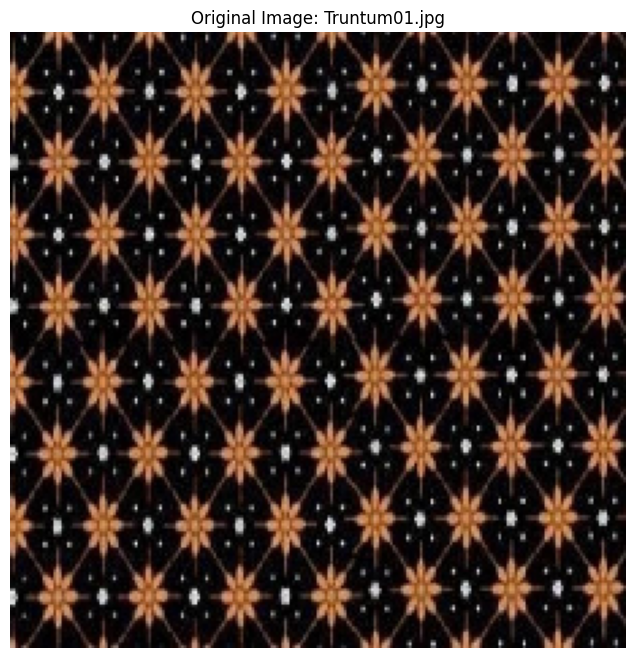

Image file: Truntum01.jpg
Shape: (227, 227, 3)
Min/Max/Mean/Std: 0.00/245.00/41.31/54.82

2. IMAGE PREDICTION ANALYSIS


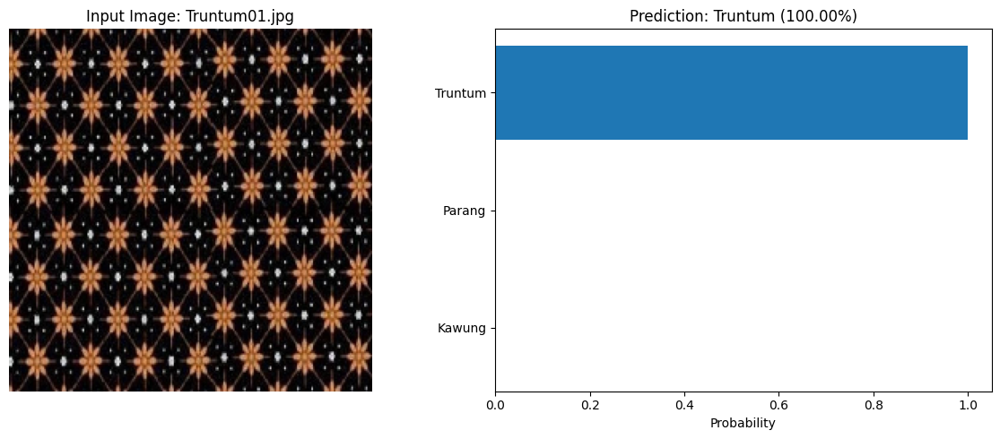

Predicted Class: Truntum
Confidence: 1.0000 (100.00%)

All class probabilities:
  Kawung: 0.0000 (0.00%)
  Parang: 0.0000 (0.00%)
  Truntum: 1.0000 (100.00%)


In [ ]:
if __name__ == "__main__":
    # Get sample image
    Truntum_dir = os.path.join(new_data_dir, 'Truntum')

    if os.path.exists(Truntum_dir):
        files = sorted(os.listdir(Truntum_dir))

        # Try to find Truntum01 specifically
        Truntum01_path = None
        for file in files:
            if any(pattern in file.lower() for pattern in ['Truntum01', 'Truntum_01', '01']):
                Truntum01_path = os.path.join(Truntum_dir, file)
                break

        if Truntum01_path is None and len(files) >= 1:
            Truntum01_path = os.path.join(Truntum_dir, files[7])

        if Truntum01_path:
            print(f"🎯 TARGET IMAGE: {os.path.basename(Truntum01_path)}")
            print("="*80)

            # Normalize image to [0,1]
            img = cv2.imread(Truntum01_path)
            if img is not None:
                img_normalized = img.astype(np.float32) / 255.0
                print(f"✅ Image normalized to [0,1] range: [{img_normalized.min():.3f}, {img_normalized.max():.3f}]")

            # 1. Basic Analysis
            img_array, predicted_class, confidence, probabilities = run_basic_analysis(Truntum01_path)

###**Menampilkan Representasi Numerik Gambar**

In [ ]:
img_matrix =  display_image_matrix_enhanced(Truntum01_path)

3. COMPLETE IMAGE MATRIX ANALYSIS - NORMALIZED FOR RESEARCH
File: Truntum01.jpg
Dimensions: (227, 227, 3)
Size: 227 x 227 pixels
Channels: 3 (RGB)
Values: Normalized to [0, 1] range for research analysis

--- MATRIX DISPLAY STRATEGY ---
Complete matrix display (227x227)
- Rows: All 227 rows displayed
- Columns: All 227 columns displayed

I_1 = CHANNEL 1 (Red) - NORMALIZED MATRIX
Row\Col         0         1         2         3         4         5         6         7         8         9        10        11        12        13        14        15        16        17        18        19        20        21        22        23        24        25        26        27        28        29        30        31        32        33        34        35        36        37        38        39        40        41        42        43        44        45        46        47        48        49        50        51        52        53        54        55        56        57        58        59        60 

###**Menampilkan Convolutional Layer 1**

####**Matriks Kernel dan Bias**

SELECTIVE KERNEL/FILTER ANALYSIS FOR CONV2D
Layer: conv2d
Kernel dimensions: (11, 11, 3, 96)
Kernel size: 11x11
Input channels: 3
Output channels (filters): 96
Bias dimensions: (96,)

--- KERNEL STATISTICS (SUMMARY) ---
Weight Range: [-0.178022, 0.199710]
Mean ± Std: -0.004144 ± 0.024139

--- SELECTED FILTERS DETAILED ANALYSIS ---
Selection mode: All
Showing detailed analysis for 2 out of 96 filters.
Selected filters: [1, 96] (1-based numbering)

FILTER 1/96
    Showing kernel matrices for ALL 3 input channels:
    Ch1/3:
              0        1        2        3        4        5        6        7        8        9       10
    -----------------------------------------------------------------------------------------------------------
   0 │   0.0159   0.0217  -0.0061  -0.0242   0.0040  -0.0207   0.0190  -0.0120   0.0056   0.0092  -0.0003
   1 │   0.0202   0.0175   0.0152  -0.0229  -0.0102  -0.0275  -0.0079  -0.0032   0.0059  -0.0118   0.0075
   2 │  -0.0041  -0.0033   0.0058  -0.0061

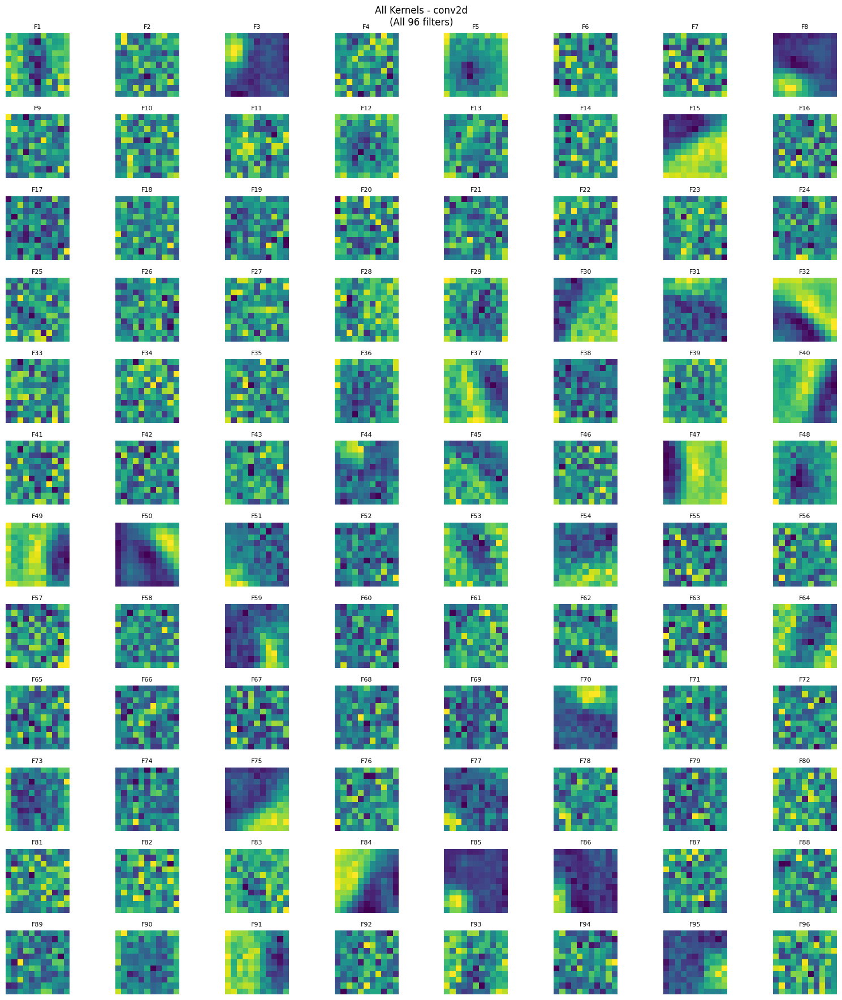

(None, None)

In [ ]:
# Analisis satu layer
analyze_layer_kernels_selective(model, 'conv2d', "All")

####**Perhitungan Feature Maps**

In [ ]:
display_feature_maps_calculation_only(model, Truntum01_path, 'conv2d', position=(0,0))

5. FEATURE MAPS CALCULATION ANALYSIS - CONV2D
Layer: conv2d
Position for calculation: (0,0)
Input to layer 'conv2d': (1, 227, 227, 3), Kernel shape: (11, 11, 3, 96)

MANUAL CALCULATIONS FOR ALL FILTERS AT POSITION (0,0)

--- Filter 1/96 ---
   Sum of (Input × Kernel): (0.0431×0.0159) + (0.0588×0.0217) + (0.0392×-0.0061) + (0.0667×-0.0242) + (0.0392×0.0040) + (0.0745×-0.0207) + (0.0196×0.0190) + (0.0157×-0.0120) + (0.0196×0.0056) + (0.0039×0.0092) + ... = -0.0055
   + Bias (-0.0377) = -0.0433
   ReLU Activated Value = 0.0000

--- Filter 2/96 ---
   Sum of (Input × Kernel): (0.0431×0.0095) + (0.0588×0.0184) + (0.0392×-0.0112) + (0.0667×-0.0065) + (0.0392×-0.0101) + (0.0745×-0.0214) + (0.0196×-0.0170) + (0.0157×-0.0047) + (0.0196×0.0167) + (0.0039×-0.0153) + ... = -0.0356
   + Bias (-0.0037) = -0.0393
   ReLU Activated Value = 0.0000

--- Filter 3/96 ---
   Sum of (Input × Kernel): (0.0431×0.0421) + (0.0588×0.0667) + (0.0392×0.0201) + (0.0667×-0.0049) + (0.0392×-0.0355) + (0.0745×-0.0275)

6. COMPLETE FEATURE MAPS MATRIX DISPLAY - CONV2D
Error using tf.keras.Model to get feature maps for conv2d: The layer sequential has never been called and thus has no defined input.
Falling back to manual layer iteration to get feature maps.
Feature maps shape: (1, 55, 55, 96)

--- SELECTED FEATURE MAPS MATRICES (96 filters total) ---
Displaying first 40 and last 40 feature maps (total 80).

==================== ... OMITTED FILTERS ... ====================
                              ⋮                              
                              ⋮                              

S^1 (Filter 1 Feature Map):
Row\Col         0         1         2         3         4         5         6         7         8         9        10        11        12        13        14        15        16        17        18        19        20        21        22        23        24        25        26        27        28        29        30        31        32        33        34        35        36        3

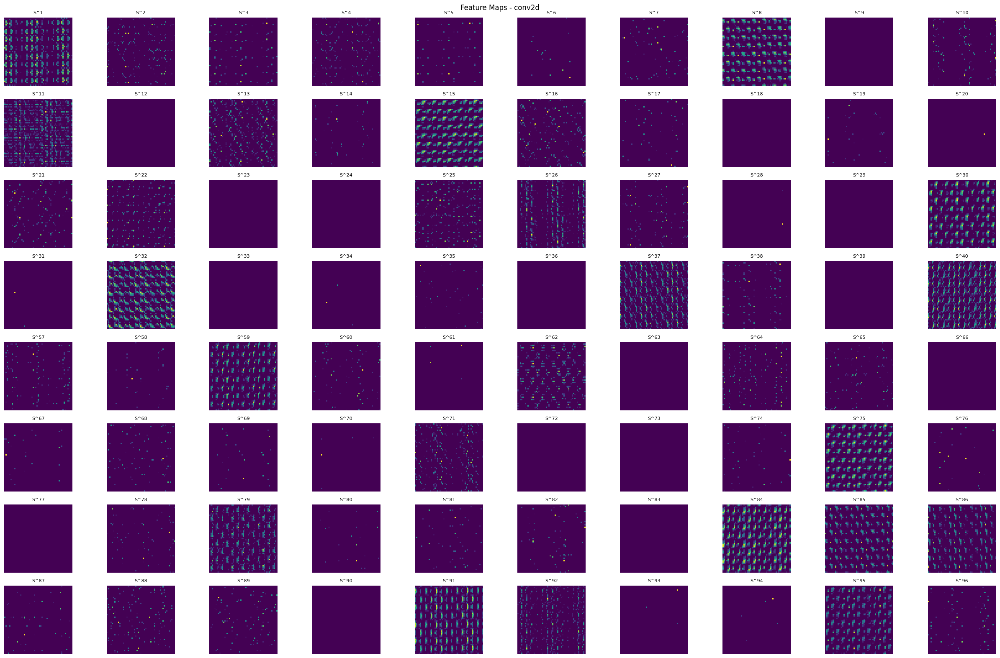


Feature maps display completed for layer: conv2d


In [ ]:
display_all_feature_maps_matrix(model, Truntum01_path, 'conv2d')

###**Menampilkan Convolutional Layer 2**

####**Matriks Kernel dan Bias**

SELECTIVE KERNEL/FILTER ANALYSIS FOR CONV2D_1
Layer: conv2d_1
Kernel dimensions: (5, 5, 96, 256)
Kernel size: 5x5
Input channels: 96
Output channels (filters): 256
Bias dimensions: (256,)

--- KERNEL STATISTICS (SUMMARY) ---
Weight Range: [-0.178850, 0.202246]
Mean ± Std: -0.000610 ± 0.015881

--- SELECTED FILTERS DETAILED ANALYSIS ---
Selection mode: first_last_n
Showing detailed analysis for 4 out of 256 filters.
Selected filters: [1, 2, 255, 256] (1-based numbering)

FILTER 1/256
    Showing kernel matrices for ALL 96 input channels:
    Ch1/96:
              0        1        2        3        4
    -----------------------------------------------------
   0 │  -0.0160   0.0071   0.0143   0.0072   0.0131
   1 │  -0.0114   0.0209   0.0058   0.0115  -0.0195
   2 │   0.0171   0.0278   0.0078   0.0053   0.0232
   3 │  -0.0045  -0.0058  -0.0067   0.0054   0.0065
   4 │   0.0014  -0.0129   0.0269   0.0060   0.0209
    Ch2/96:
              0        1        2        3        4
    -------

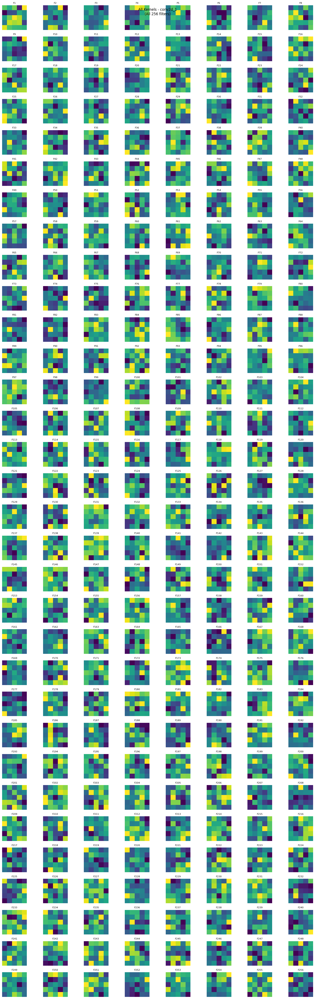

(None, None)

In [ ]:
# Analisis satu layer
analyze_layer_kernels_selective(model, 'conv2d_1',"first_last_n", 2)

####**Perhitungan Feature Maps**

In [ ]:
display_feature_maps_calculation_only(model, Truntum01_path, 'conv2d_1', position=(0,0))

5. FEATURE MAPS CALCULATION ANALYSIS - CONV2D_1
Error getting input data for layer conv2d_1 from previous layer using Keras Model: The layer sequential has never been called and thus has no defined input.
Falling back to manual sequential layer execution for input data.
Layer: conv2d_1
Position for calculation: (0,0)
Input to layer 'conv2d_1': (1, 27, 27, 96), Kernel shape: (5, 5, 96, 256)

MANUAL CALCULATIONS FOR ALL FILTERS AT POSITION (0,0)

--- Filter 1/256 ---
   Sum of (Input × Kernel): (0.0983×-0.0160) + (0.0504×0.0071) + (0.0698×0.0143) + (0.0000×0.0072) + (0.0432×0.0131) + (0.1479×-0.0114) + (0.1425×0.0209) + (0.1425×0.0058) + (0.0000×0.0115) + (0.0606×-0.0195) + ... = -0.8768
   + Bias (0.0715) = -0.8054
   ReLU Activated Value = 0.0000

--- Filter 2/256 ---
   Sum of (Input × Kernel): (0.0983×-0.0203) + (0.0504×0.0126) + (0.0698×-0.0072) + (0.0000×-0.0167) + (0.0432×0.0201) + (0.1479×-0.0059) + (0.1425×0.0058) + (0.1425×0.0159) + (0.0000×0.0099) + (0.0606×0.0023) + ... = -0.

6. COMPLETE FEATURE MAPS MATRIX DISPLAY - CONV2D_1
Error using tf.keras.Model to get feature maps for conv2d_1: The layer sequential has never been called and thus has no defined input.
Falling back to manual layer iteration to get feature maps.
Feature maps shape: (1, 27, 27, 256)

--- SELECTED FEATURE MAPS MATRICES (256 filters total) ---
Displaying first 40 and last 40 feature maps (total 80).

==================== ... OMITTED FILTERS ... ====================
                              ⋮                              
                              ⋮                              

S^1 (Filter 1 Feature Map):
Row\Col         0         1         2         3         4         5         6         7         8         9        10        11        12        13        14        15        16        17        18        19        20        21        22        23        24        25        26
------------------------------------------------------------------------------------------------------

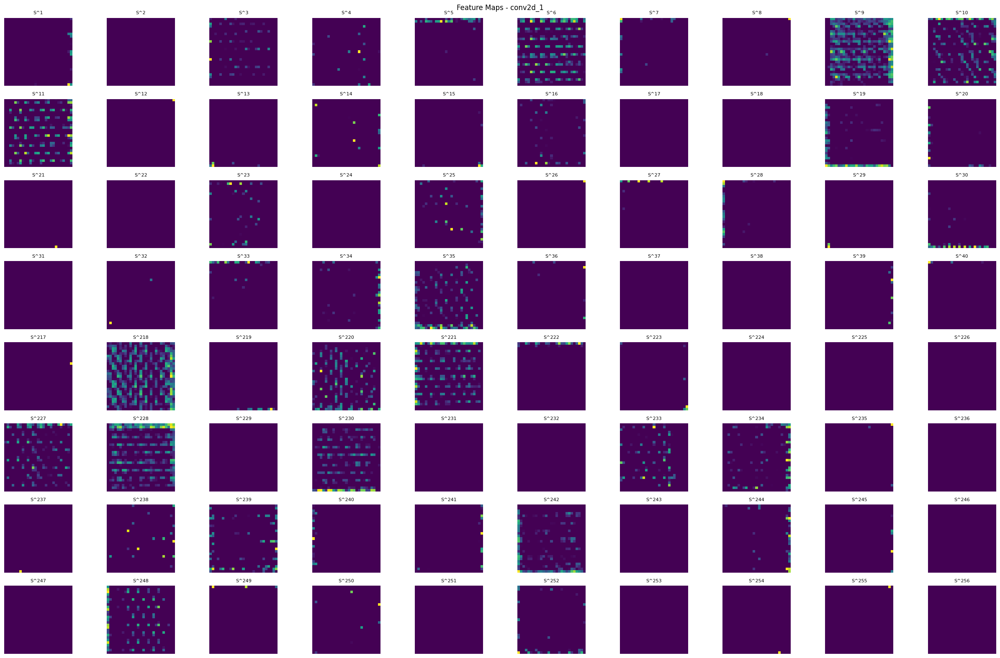


Feature maps display completed for layer: conv2d_1


In [ ]:
display_all_feature_maps_matrix(model, Truntum01_path, 'conv2d_1')

###**Menampilkan Convolutional Layer 3**

####**Matriks Kernel dan Bias**

SELECTIVE KERNEL/FILTER ANALYSIS FOR CONV2D_2
Layer: conv2d_2
Kernel dimensions: (3, 3, 256, 384)
Kernel size: 3x3
Input channels: 256
Output channels (filters): 384
Bias dimensions: (384,)

--- KERNEL STATISTICS (SUMMARY) ---
Weight Range: [-0.055636, 0.053705]
Mean ± Std: -0.000304 ± 0.018780

--- SELECTED FILTERS DETAILED ANALYSIS ---
Selection mode: first_last_n
Showing detailed analysis for 2 out of 384 filters.
Selected filters: [1, 384] (1-based numbering)

FILTER 1/384
    Showing kernel matrices for ALL 256 input channels:
    Ch1/256:
              0        1        2
    -----------------------------------
   0 │   0.0236  -0.0117   0.0179
   1 │  -0.0080   0.0298  -0.0196
   2 │   0.0007   0.0099  -0.0286
    Ch2/256:
              0        1        2
    -----------------------------------
   0 │  -0.0143  -0.0247   0.0013
   1 │  -0.0302   0.0024  -0.0132
   2 │  -0.0110  -0.0103  -0.0152
    Ch3/256:
              0        1        2
    ---------------------------------

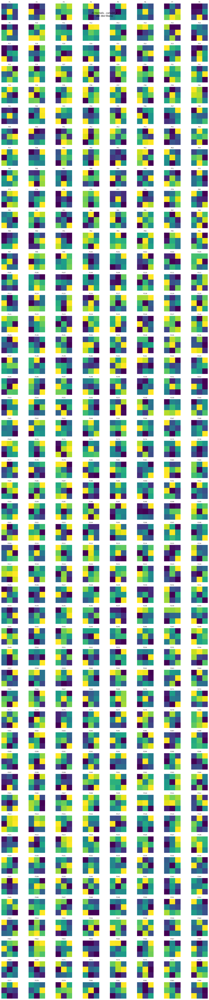

(None, None)

In [ ]:
# Analisis satu layer
analyze_layer_kernels_selective(model, 'conv2d_2',"first_last_n", 1)

####**Perhitungan Feature Maps**

In [ ]:
display_feature_maps_calculation_only(model, Truntum01_path, 'conv2d_2', position=(0,0))

5. FEATURE MAPS CALCULATION ANALYSIS - CONV2D_2
Error getting input data for layer conv2d_2 from previous layer using Keras Model: The layer sequential has never been called and thus has no defined input.
Falling back to manual sequential layer execution for input data.
Layer: conv2d_2
Position for calculation: (0,0)
Input to layer 'conv2d_2': (1, 13, 13, 256), Kernel shape: (3, 3, 256, 384)

MANUAL CALCULATIONS FOR ALL FILTERS AT POSITION (0,0)

--- Filter 1/384 ---
   Sum of (Input × Kernel): (0.0000×0.0236) + (0.0000×-0.0117) + (0.0000×0.0179) + (0.0000×-0.0080) + (0.0000×0.0298) + (0.0000×-0.0196) + (0.0000×0.0007) + (0.0000×0.0099) + (0.0000×-0.0286) + (0.0000×-0.0143) + ... = 0.1769
   + Bias (-0.0139) = 0.1630
   ReLU Activated Value = 0.1630

--- Filter 2/384 ---
   Sum of (Input × Kernel): (0.0000×0.0184) + (0.0000×0.0275) + (0.0000×0.0269) + (0.0000×-0.0034) + (0.0000×-0.0266) + (0.0000×-0.0136) + (0.0000×0.0110) + (0.0000×0.0307) + (0.0000×-0.0266) + (0.0000×-0.0278) + ... =

6. COMPLETE FEATURE MAPS MATRIX DISPLAY - CONV2D_2
Error using tf.keras.Model to get feature maps for conv2d_2: The layer sequential has never been called and thus has no defined input.
Falling back to manual layer iteration to get feature maps.
Feature maps shape: (1, 13, 13, 384)

--- SELECTED FEATURE MAPS MATRICES (384 filters total) ---
Displaying first 40 and last 40 feature maps (total 80).

==================== ... OMITTED FILTERS ... ====================
                              ⋮                              
                              ⋮                              

S^1 (Filter 1 Feature Map):
Row\Col         0         1         2         3         4         5         6         7         8         9        10        11        12
------------------------------------------------------------------------------------------------------------------------------------------
     0 │   0.0000    0.1471    0.0000    0.0302    0.0000    0.0587    0.0174    0.1350    0.0844    0.

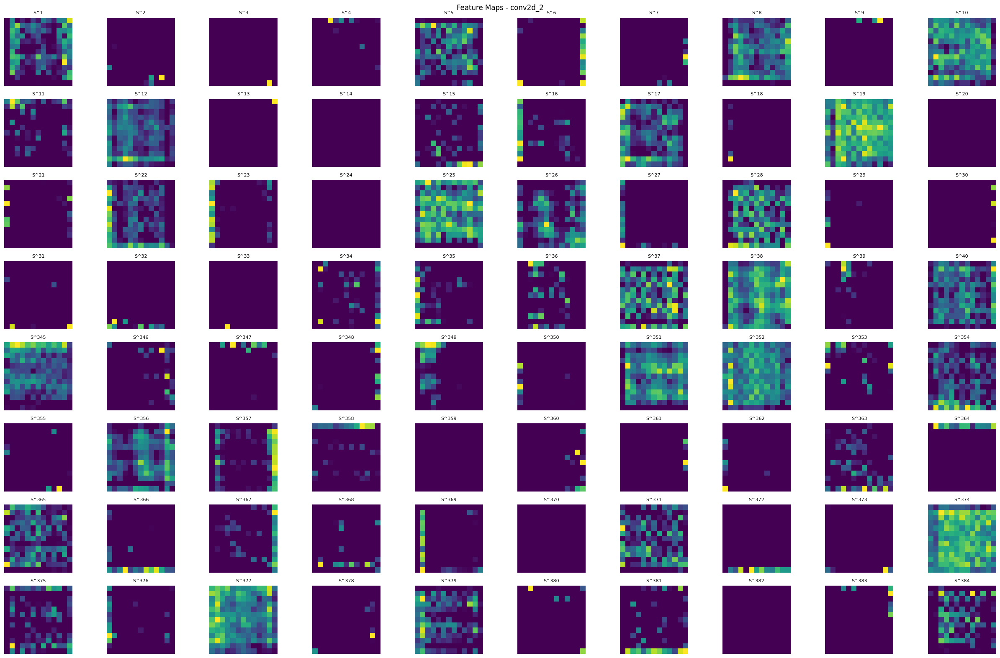


Feature maps display completed for layer: conv2d_2


In [ ]:
display_all_feature_maps_matrix(model, Truntum01_path, 'conv2d_2')

###**Menampilkan Convolutional Layer 4**

####**Matriks Kernel dan Bias**

SELECTIVE KERNEL/FILTER ANALYSIS FOR CONV2D_3
Layer: conv2d_3
Kernel dimensions: (3, 3, 384, 384)
Kernel size: 3x3
Input channels: 384
Output channels (filters): 384
Bias dimensions: (384,)

--- KERNEL STATISTICS (SUMMARY) ---
Weight Range: [-0.049439, 0.047492]
Mean ± Std: -0.000212 ± 0.017094

--- SELECTED FILTERS DETAILED ANALYSIS ---
Selection mode: first_last_n
Showing detailed analysis for 2 out of 384 filters.
Selected filters: [1, 384] (1-based numbering)

FILTER 1/384
    Showing kernel matrices for ALL 384 input channels:
    Ch1/384:
              0        1        2
    -----------------------------------
   0 │  -0.0099  -0.0289   0.0192
   1 │  -0.0138  -0.0037  -0.0110
   2 │   0.0164  -0.0087   0.0018
    Ch2/384:
              0        1        2
    -----------------------------------
   0 │   0.0252  -0.0245   0.0058
   1 │   0.0172  -0.0248  -0.0205
   2 │  -0.0123  -0.0162  -0.0076
    Ch3/384:
              0        1        2
    ---------------------------------

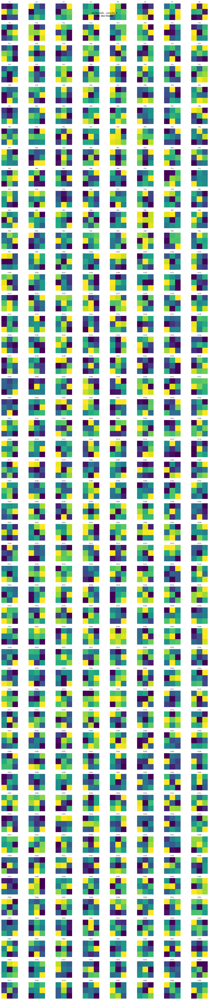

(None, None)

In [ ]:
# Analisis satu layer
analyze_layer_kernels_selective(model, 'conv2d_3',"first_last_n", 1)

####**Perhitungan Feature Maps**

In [ ]:
display_feature_maps_calculation_only(model, Truntum01_path, 'conv2d_3', position=(0,0))

5. FEATURE MAPS CALCULATION ANALYSIS - CONV2D_3
Error getting input data for layer conv2d_3 from previous layer using Keras Model: The layer sequential has never been called and thus has no defined input.
Falling back to manual sequential layer execution for input data.
Layer: conv2d_3
Position for calculation: (0,0)
Input to layer 'conv2d_3': (1, 13, 13, 384), Kernel shape: (3, 3, 384, 384)

MANUAL CALCULATIONS FOR ALL FILTERS AT POSITION (0,0)

--- Filter 1/384 ---
   Sum of (Input × Kernel): (0.0000×-0.0099) + (0.1471×-0.0289) + (0.0000×0.0192) + (0.0000×-0.0138) + (0.1630×-0.0037) + (0.2602×-0.0110) + (0.0000×0.0164) + (0.2147×-0.0087) + (0.1563×0.0018) + (0.0000×0.0252) + ... = -0.0358
   + Bias (-0.0259) = -0.0617
   ReLU Activated Value = 0.0000

--- Filter 2/384 ---
   Sum of (Input × Kernel): (0.0000×-0.0151) + (0.1471×-0.0091) + (0.0000×-0.0095) + (0.0000×-0.0236) + (0.1630×-0.0189) + (0.2602×-0.0301) + (0.0000×0.0281) + (0.2147×0.0130) + (0.1563×0.0182) + (0.0000×-0.0004) + 

6. COMPLETE FEATURE MAPS MATRIX DISPLAY - CONV2D_3
Error using tf.keras.Model to get feature maps for conv2d_3: The layer sequential has never been called and thus has no defined input.
Falling back to manual layer iteration to get feature maps.
Feature maps shape: (1, 13, 13, 384)

--- SELECTED FEATURE MAPS MATRICES (384 filters total) ---
Displaying first 40 and last 40 feature maps (total 80).

==================== ... OMITTED FILTERS ... ====================
                              ⋮                              
                              ⋮                              

S^1 (Filter 1 Feature Map):
Row\Col         0         1         2         3         4         5         6         7         8         9        10        11        12
------------------------------------------------------------------------------------------------------------------------------------------
     0 │   0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.

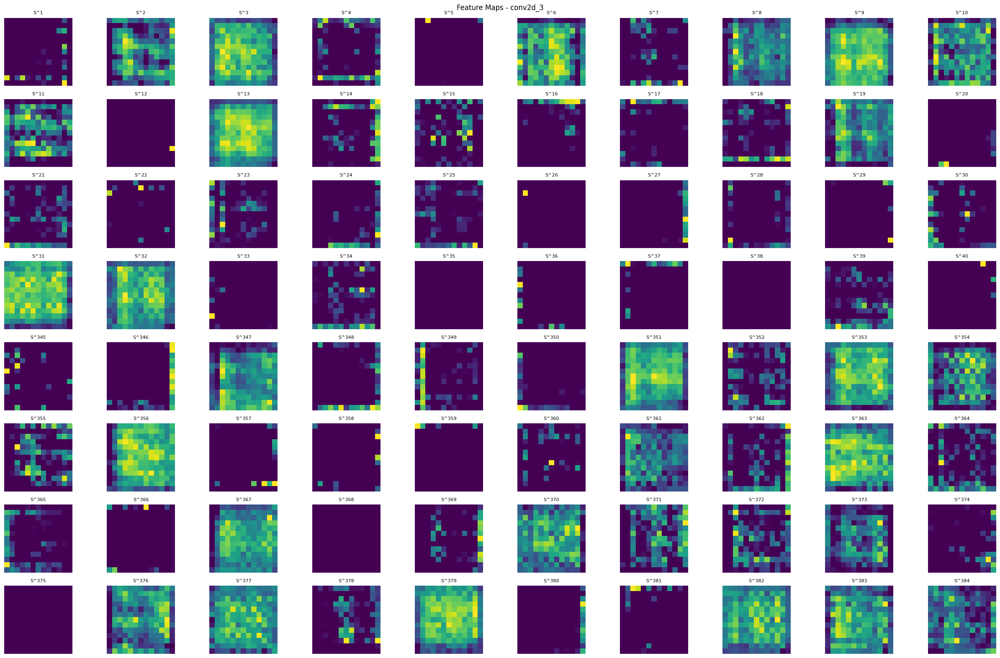


Feature maps display completed for layer: conv2d_3


In [ ]:
display_all_feature_maps_matrix(model, Truntum01_path, 'conv2d_3')

###**Menampilkan Convolutional Layer 5**

####**Matriks Kernel dan Bias**

SELECTIVE KERNEL/FILTER ANALYSIS FOR CONV2D_4
Layer: conv2d_4
Kernel dimensions: (3, 3, 384, 256)
Kernel size: 3x3
Input channels: 384
Output channels (filters): 256
Bias dimensions: (256,)

--- KERNEL STATISTICS (SUMMARY) ---
Weight Range: [-0.055113, 0.066238]
Mean ± Std: -0.000342 ± 0.018729

--- SELECTED FILTERS DETAILED ANALYSIS ---
Selection mode: first_last_n
Showing detailed analysis for 2 out of 256 filters.
Selected filters: [1, 256] (1-based numbering)

FILTER 1/256
    Showing kernel matrices for ALL 384 input channels:
    Ch1/384:
              0        1        2
    -----------------------------------
   0 │  -0.0154  -0.0023  -0.0238
   1 │   0.0314   0.0166  -0.0104
   2 │  -0.0214   0.0020   0.0298
    Ch2/384:
              0        1        2
    -----------------------------------
   0 │  -0.0133  -0.0031  -0.0164
   1 │  -0.0100   0.0092  -0.0079
   2 │  -0.0054  -0.0285  -0.0128
    Ch3/384:
              0        1        2
    ---------------------------------

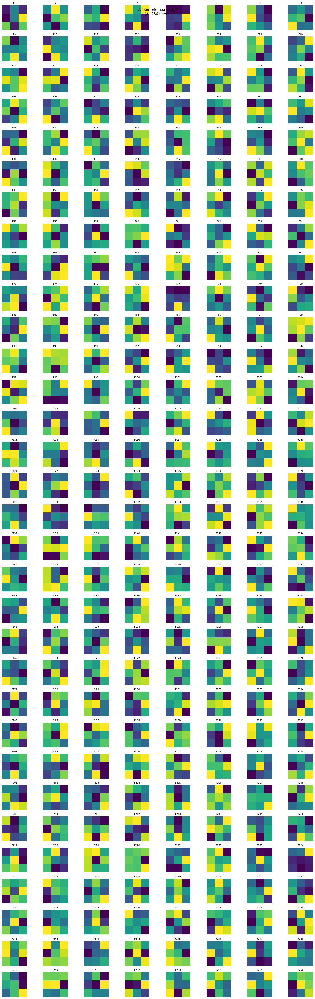

(None, None)

In [ ]:
# Analisis satu layer
analyze_layer_kernels_selective(model, 'conv2d_4',"first_last_n", 1)

####**Perhitungan Feature Maps**

In [ ]:
display_feature_maps_calculation_only(model, Truntum01_path, 'conv2d_4', position=(0,0))

5. FEATURE MAPS CALCULATION ANALYSIS - CONV2D_4
Error getting input data for layer conv2d_4 from previous layer using Keras Model: The layer sequential has never been called and thus has no defined input.
Falling back to manual sequential layer execution for input data.
Layer: conv2d_4
Position for calculation: (0,0)
Input to layer 'conv2d_4': (1, 13, 13, 384), Kernel shape: (3, 3, 384, 256)

MANUAL CALCULATIONS FOR ALL FILTERS AT POSITION (0,0)

--- Filter 1/256 ---
   Sum of (Input × Kernel): (0.0000×-0.0154) + (0.0000×-0.0023) + (0.0000×-0.0238) + (0.0000×0.0314) + (0.0000×0.0166) + (0.0000×-0.0104) + (0.0000×-0.0214) + (0.0000×0.0020) + (0.0000×0.0298) + (0.0481×-0.0133) + ... = -0.1647
   + Bias (-0.0059) = -0.1705
   ReLU Activated Value = 0.0000

--- Filter 2/256 ---
   Sum of (Input × Kernel): (0.0000×-0.0042) + (0.0000×0.0212) + (0.0000×0.0202) + (0.0000×0.0251) + (0.0000×0.0154) + (0.0000×-0.0164) + (0.0000×-0.0288) + (0.0000×-0.0060) + (0.0000×-0.0047) + (0.0481×0.0227) + ..

6. COMPLETE FEATURE MAPS MATRIX DISPLAY - CONV2D_4
Error using tf.keras.Model to get feature maps for conv2d_4: The layer sequential has never been called and thus has no defined input.
Falling back to manual layer iteration to get feature maps.
Feature maps shape: (1, 13, 13, 256)

--- SELECTED FEATURE MAPS MATRICES (256 filters total) ---
Displaying first 40 and last 40 feature maps (total 80).

==================== ... OMITTED FILTERS ... ====================
                              ⋮                              
                              ⋮                              

S^1 (Filter 1 Feature Map):
Row\Col         0         1         2         3         4         5         6         7         8         9        10        11        12
------------------------------------------------------------------------------------------------------------------------------------------
     0 │   0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.0000    0.

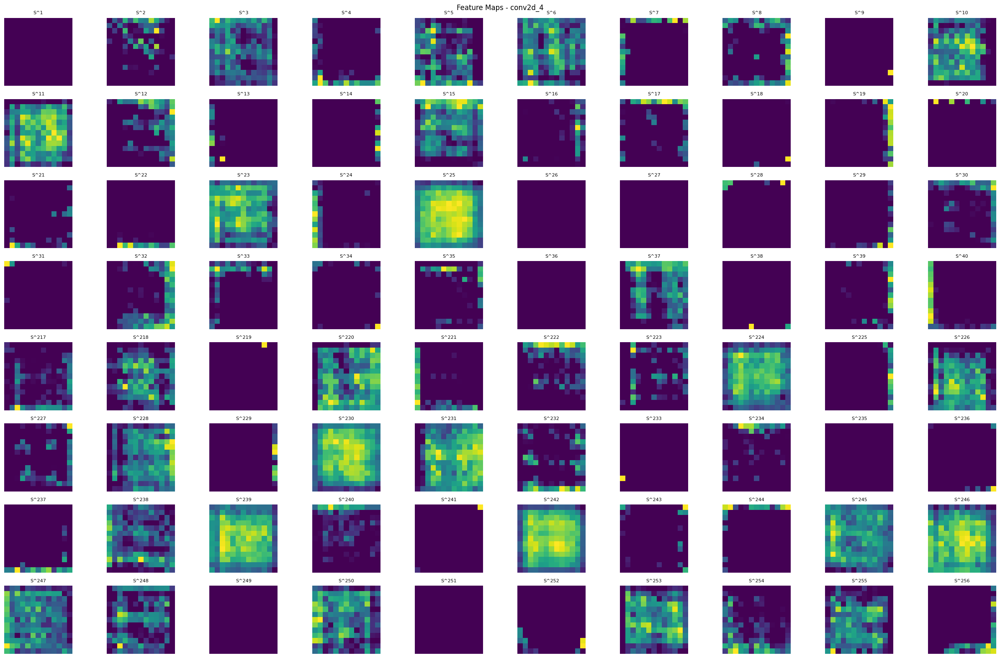


Feature maps display completed for layer: conv2d_4


In [ ]:
display_all_feature_maps_matrix(model, Truntum01_path, 'conv2d_4')

##**Pooling Layer**

###**Pooling Layer 1**

In [ ]:
display_pooling_calculation_only(model, Truntum01_path, 'max_pooling2d', position=(0,0))


---------------------------------------------------------------------------
--- DISPLAYING POOLING CALCULATION (SELECTED FILTERS): MAX_POOLING2D ---
---------------------------------------------------------------------------
Input to Pooling Layer (conv2d): (1, 55, 55, 96)

Pooling Parameters for max_pooling2d:
   Type: Max Pooling
   Pool Size: (3, 3)
   Strides: (2, 2)
   Padding: 'valid'

MANUAL POOLING CALCULATION FOR SELECTED FILTERS
Displaying manual pooling calculation for 20 out of 96 total feature maps.
(Showing first 10 and last 10 filters)

FIRST 10 FILTERS

--- FILTER/FEATURE MAP 1/96 ---
Input Feature Map 1 shape: (55, 55)
Input Feature Map 1 (sample 3x5 values):
     0.000   0.000   0.000   0.000   0.000 ...
     0.025   0.000   0.005   0.000   0.050 ...
     0.000   0.098   0.000   0.000   0.000 ...
      ⋮                        

--- MANUAL POOLING CALCULATION (MAX Pooling) ---
Input Data Shape (after padding if 'same'): (55, 55)
Pool Size: (3, 3), Strides: (2, 2), Pa


---------------------------------------------------------------------------
--- DISPLAYING FULL POOLING MATRIX (ALL FILTERS): MAX_POOLING2D ---
---------------------------------------------------------------------------

POOLING LAYER OUTPUT MATRIX - MAX_POOLING2D
Layer: max_pooling2d
Output shape: (1, 27, 27, 96) (Batch, Height, Width, Features)
Number of feature maps: 96
Feature map dimensions: 27x27

Showing ALL 96 pooling output matrices:

Pooling Output Matrix for Filter/Feature Map 1:
            0       1       2       3       4       5       6       7       8       9      10      11      12      13      14      15      16      17      18      19      20      21      22      23      24      25      26
     ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
   0 | 0.0983*  0.0504  0.0698  0.0000  0.0432  0.0000  0.0

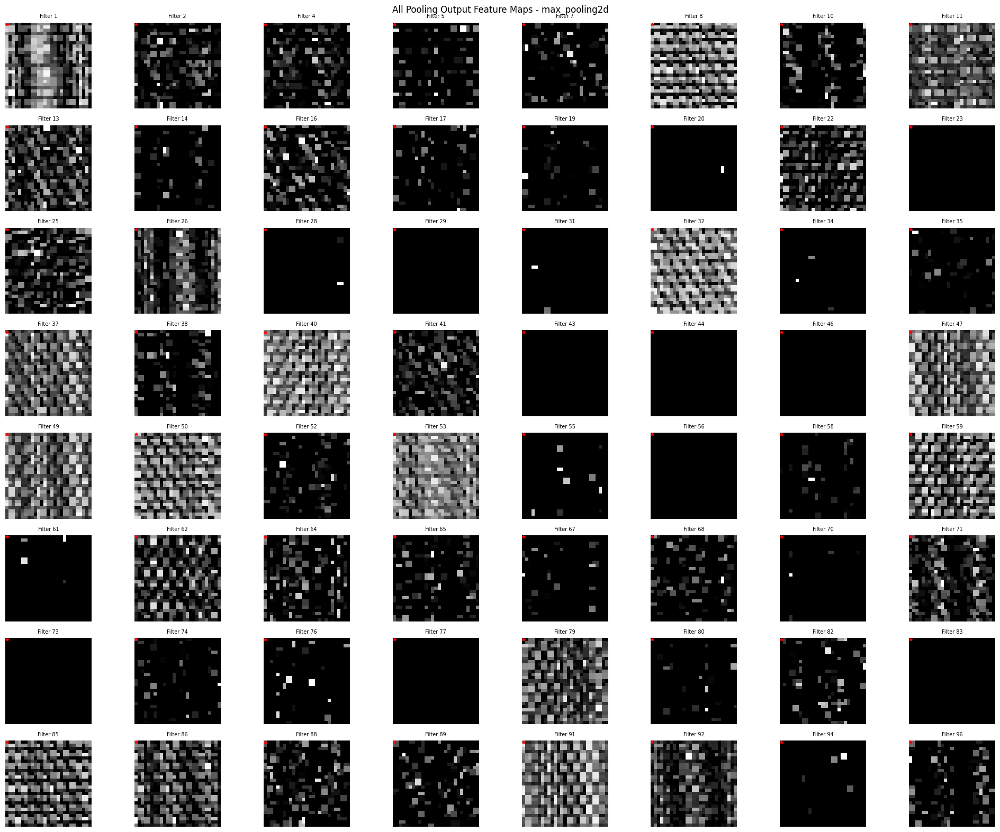

In [ ]:
display_all_pooling_matrix(model, Truntum01_path, 'max_pooling2d')

###**Pooling Layer 2**

In [ ]:
display_pooling_calculation_only(model, Truntum01_path, 'max_pooling2d_1', position=(0,0))


---------------------------------------------------------------------------
--- DISPLAYING POOLING CALCULATION (SELECTED FILTERS): MAX_POOLING2D_1 ---
---------------------------------------------------------------------------
Input to Pooling Layer (conv2d_1): (1, 27, 27, 256)

Pooling Parameters for max_pooling2d_1:
   Type: Max Pooling
   Pool Size: (3, 3)
   Strides: (2, 2)
   Padding: 'valid'

MANUAL POOLING CALCULATION FOR SELECTED FILTERS
Displaying manual pooling calculation for 20 out of 256 total feature maps.
(Showing first 10 and last 10 filters)

FIRST 10 FILTERS

--- FILTER/FEATURE MAP 1/256 ---
Input Feature Map 1 shape: (27, 27)
Input Feature Map 1 (sample 3x5 values):
     0.000   0.000   0.000   0.000   0.000 ...
     0.000   0.000   0.000   0.000   0.000 ...
     0.000   0.000   0.000   0.000   0.000 ...
      ⋮                        

--- MANUAL POOLING CALCULATION (MAX Pooling) ---
Input Data Shape (after padding if 'same'): (27, 27)
Pool Size: (3, 3), Strides: (


---------------------------------------------------------------------------
--- DISPLAYING FULL POOLING MATRIX (ALL FILTERS): MAX_POOLING2D_1 ---
---------------------------------------------------------------------------

POOLING LAYER OUTPUT MATRIX - MAX_POOLING2D_1
Layer: max_pooling2d_1
Output shape: (1, 13, 13, 256) (Batch, Height, Width, Features)
Number of feature maps: 256
Feature map dimensions: 13x13

Showing ALL 256 pooling output matrices:

Pooling Output Matrix for Filter/Feature Map 1:
            0       1       2       3       4       5       6       7       8       9      10      11      12
     --------------------------------------------------------------------------------------------------------
   0 | 0.0000*  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0613
   1 |  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0023
   2 |  0.0000  0.0000  0.0000  0.0000  0.0000  0.00

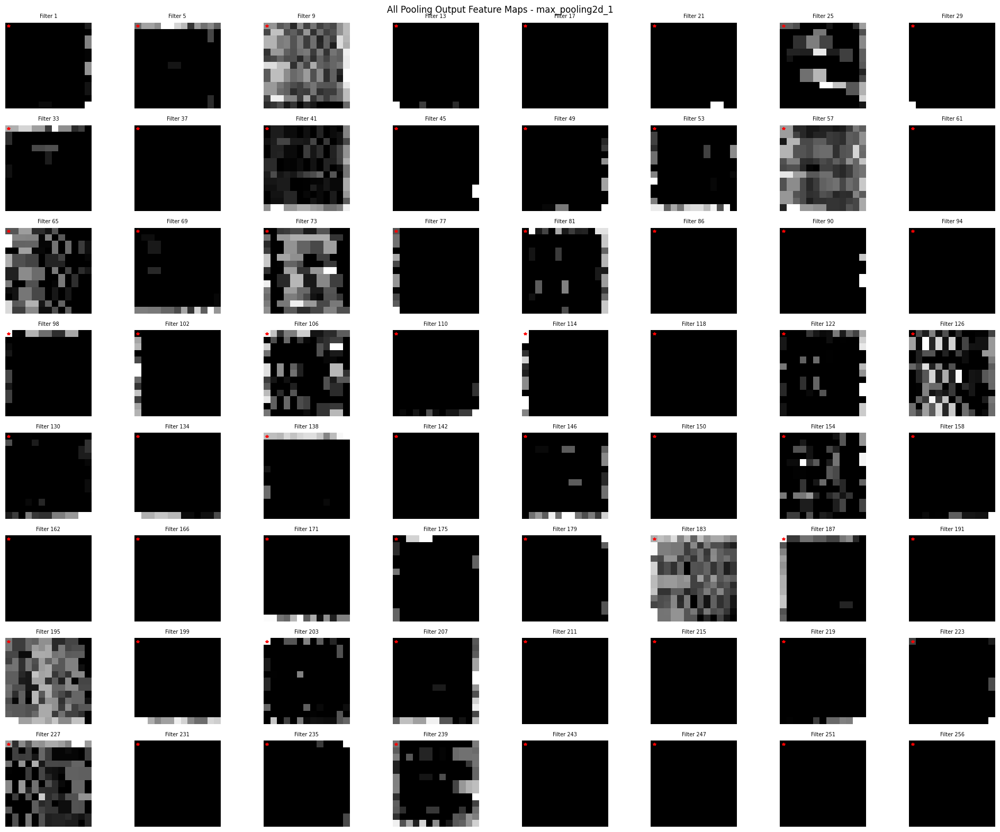

In [ ]:
display_all_pooling_matrix(model, Truntum01_path, 'max_pooling2d_1')

###**Pooling Layer 3**

In [ ]:
display_pooling_calculation_only(model, Truntum01_path, 'max_pooling2d_2', position=(0,0))


---------------------------------------------------------------------------
--- DISPLAYING POOLING CALCULATION (SELECTED FILTERS): MAX_POOLING2D_2 ---
---------------------------------------------------------------------------
Input to Pooling Layer (conv2d_4): (1, 13, 13, 256)

Pooling Parameters for max_pooling2d_2:
   Type: Max Pooling
   Pool Size: (3, 3)
   Strides: (2, 2)
   Padding: 'valid'

MANUAL POOLING CALCULATION FOR SELECTED FILTERS
Displaying manual pooling calculation for 20 out of 256 total feature maps.
(Showing first 10 and last 10 filters)

FIRST 10 FILTERS

--- FILTER/FEATURE MAP 1/256 ---
Input Feature Map 1 shape: (13, 13)
Input Feature Map 1 (sample 3x5 values):
     0.000   0.000   0.000   0.000   0.000 ...
     0.000   0.000   0.000   0.000   0.000 ...
     0.000   0.000   0.000   0.000   0.000 ...
      ⋮                        

--- MANUAL POOLING CALCULATION (MAX Pooling) ---
Input Data Shape (after padding if 'same'): (13, 13)
Pool Size: (3, 3), Strides: (


---------------------------------------------------------------------------
--- DISPLAYING FULL POOLING MATRIX (ALL FILTERS): MAX_POOLING2D_2 ---
---------------------------------------------------------------------------

POOLING LAYER OUTPUT MATRIX - MAX_POOLING2D_2
Layer: max_pooling2d_2
Output shape: (1, 6, 6, 256) (Batch, Height, Width, Features)
Number of feature maps: 256
Feature map dimensions: 6x6

Showing ALL 256 pooling output matrices:

Pooling Output Matrix for Filter/Feature Map 1:
            0       1       2       3       4       5
     ------------------------------------------------
   0 | 0.0000*  0.0000  0.0000  0.0000  0.0000  0.0000
   1 |  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
   2 |  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
   3 |  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
   4 |  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
   5 |  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000

   → Value at position (row 0, col 0): 0.0000

Pooling Outp

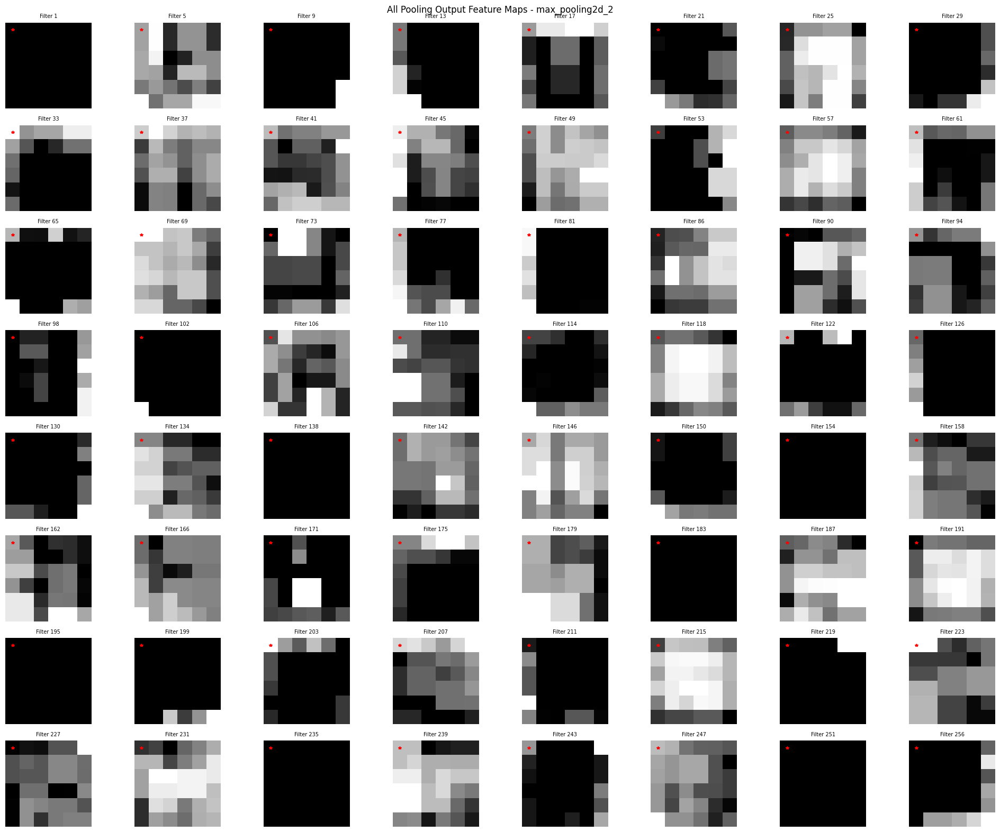

In [ ]:
display_all_pooling_matrix(model, Truntum01_path, 'max_pooling2d_2')

##**Output Flatten Layer**

In [ ]:
print("\n" + "#" * 90)
print("### MEMULAI ANALISIS LAYER FLATTEN ###")
print("#" * 90)

# Ganti 'flatten' dengan nama layer Flatten yang ada di model.summary() Anda.
flatten_layer_name = 'flatten'
analyze_flatten_layer(model, Truntum01_path, flatten_layer_name)


##########################################################################################
### MEMULAI ANALISIS LAYER FLATTEN ###
##########################################################################################

9a. FLATTEN LAYER OUTPUT ANALYSIS - FLATTEN
Layer: flatten
Output shape: (9216,) (Flattened Vector)
Total elements: 9216

--- FULL FLATTENED VECTOR (COLUMN FORMAT - 5 Top, 5 Mid, 5 End) ---
x = ┌────────────┐
    │    0.0000  │
    │    0.0296  │
    │    0.1932  │
    │    0.0356  │
    │    0.0574  │
    │     ⋮      │
    │    0.1137  │
    │    0.0179  │
    │    0.0000  │
    │    0.0000  │
    │    0.1222  │
    │     ⋮      │
    │    0.0338  │
    │    0.1056  │
    │    0.0527  │
    │    0.1012  │
    │    0.0536  │
    └────────────┘

Value range: [0.0000, 1.3448]
Mean: 0.0984, Std: 0.1971


##**Output Dropout Layer**

In [ ]:
print("\n" + "#" * 90)
print("### MEMULAI ANALISIS LAYER DROPOUT ###")
print("#" * 90)

# Ganti 'dropout' dengan nama layer Dropout yang ada di model.summary() Anda.
dropout_layer_name = 'dropout' # Atau 'dropout_1', dsb.
analyze_dropout_layer(model, Truntum01_path, dropout_layer_name)


##########################################################################################
### MEMULAI ANALISIS LAYER DROPOUT ###
##########################################################################################

9c. DROPOUT LAYER ANALYSIS - DROPOUT
Layer: dropout
Dropout Rate: 0.1
Output shape (during inference, training=False): (1, 4096)

Note: During inference (training=False), Dropout layers pass inputs directly.
Thus, the output is identical to the input for this layer.

--- DROPOUT OUTPUT VECTOR ---
x = ┌────────────┐
    │    0.0000  │
    │    0.1005  │
    │    0.0000  │
    │    0.0000  │
    │    0.8152  │
    │     ⋮      │
    │    0.0000  │
    │    0.0000  │
    │    0.2553  │
    │    0.2836  │
    │    0.0000  │
    │     ⋮      │
    │    0.0000  │
    │    0.4573  │
    │    0.0777  │
    │    0.0000  │
    │    0.0000  │
    └────────────┘

Value range: [0.0000, 1.5917]
Mean: 0.1276, Std: 0.2151


##**Output Dense Layer**

###**Dense 1**

In [ ]:
display_weights_and_bias(model, 'dense')


WEIGHTS AND BIAS - DENSE
Layer: dense
Weight matrix shape: (9216, 4096)
Bias vector shape: (4096,)

Showing weights and bias for 20 neurons:

--- NEURON 1/4096 ---
Bias: -0.000378
Weights (9216 connections):
  First 10 weights:
    w[  0] = 0.008744
    w[  1] = 0.003071
    w[  2] = -0.013619
    w[  3] = 0.014853
    w[  4] = -0.014415
    w[  5] = 0.014504
    w[  6] = -0.020166
    w[  7] = -0.007694
    w[  8] = -0.016692
    w[  9] = -0.018305
    ...
  Last 10 weights:
    w[9206] = -0.005499
    w[9207] = -0.010602
    w[9208] = 0.018954
    w[9209] = 0.004397
    w[9210] = 0.012994
    w[9211] = -0.017966
    w[9212] = -0.011616
    w[9213] = -0.008259
    w[9214] = 0.019009
    w[9215] = -0.000494
  Stats: Range[-0.0215, 0.0216], Mean: 0.0000

--- NEURON 2/4096 ---
Bias: -0.002951
Weights (9216 connections):
  First 10 weights:
    w[  0] = 0.010836
    w[  1] = 0.019623
    w[  2] = -0.007235
    w[  3] = -0.011241
    w[  4] = -0.020429
    w[  5] = -0.017912
    w[  6] = 

In [ ]:
print("\n" + "#" * 90)
print("### MEMULAI ANALISIS LAYER DENSE ###")
print("#" * 90)

# Ganti 'dense' dengan nama layer Dense pertama yang ada di model.summary() Anda.
dense_layer_name_1 = 'dense'
analyze_dense_layer(model, Truntum01_path, dense_layer_name_1)


##########################################################################################
### MEMULAI ANALISIS LAYER DENSE ###
##########################################################################################

DENSE LAYER OUTPUT ANALYSIS - DENSE
Layer: dense
Activation function: relu
Input shape: (9216,)
Weight matrix shape: (9216, 4096)
Bias vector shape: (4096,)
Output shape: (4096,)
Total elements: 4096

MANUAL CALCULATION DETAILS
Showing detailed calculations for 20 neurons.

--- NEURON 1/4096 ---
  (0.0000 * 0.0087) + (0.0296 * 0.0031) + (0.1932 * -0.0136) + (0.0356 * 0.0149) + (0.0574 * -0.0144) + (0.0819 * 0.0145) + (0.0384 * -0.0202) + (0.0544 * -0.0077) + (0.0000 * -0.0167) + (0.0828 * -0.0183) + ... + Bias(-0.0004)
  = Raw output (z): -0.0672

--- NEURON 2/4096 ---
  (0.0000 * 0.0108) + (0.0296 * 0.0196) + (0.1932 * -0.0072) + (0.0356 * -0.0112) + (0.0574 * -0.0204) + (0.0819 * -0.0179) + (0.0384 * -0.0164) + (0.0544 * 0.0003) + (0.0000 * -0.0117) + (0.0828 * 0.007

###**Dense 2**

In [ ]:
display_weights_and_bias(model, 'dense_1')


WEIGHTS AND BIAS - DENSE_1
Layer: dense_1
Weight matrix shape: (4096, 4096)
Bias vector shape: (4096,)

Showing weights and bias for 20 neurons:

--- NEURON 1/4096 ---
Bias: -0.003644
Weights (4096 connections):
  First 10 weights:
    w[  0] = 0.016504
    w[  1] = -0.020622
    w[  2] = -0.025496
    w[  3] = -0.014865
    w[  4] = 0.021549
    w[  5] = -0.006417
    w[  6] = 0.019701
    w[  7] = -0.008007
    w[  8] = -0.006665
    w[  9] = -0.004913
    ...
  Last 10 weights:
    w[4086] = -0.003040
    w[4087] = -0.024964
    w[4088] = 0.003810
    w[4089] = 0.010121
    w[4090] = 0.026000
    w[4091] = 0.012825
    w[4092] = -0.019240
    w[4093] = -0.021798
    w[4094] = -0.011812
    w[4095] = 0.015431
  Stats: Range[-0.0282, 0.0270], Mean: -0.0005

--- NEURON 2/4096 ---
Bias: 0.001419
Weights (4096 connections):
  First 10 weights:
    w[  0] = -0.021325
    w[  1] = 0.018492
    w[  2] = 0.023337
    w[  3] = 0.016814
    w[  4] = -0.026388
    w[  5] = -0.012415
    w[  6]

In [ ]:
print("\n" + "#" * 90)
print("### MEMULAI ANALISIS LAYER DENSE ###")
print("#" * 90)

# Ganti 'dense' dengan nama layer Dense pertama yang ada di model.summary() Anda.
dense_layer_name_1 = 'dense_1'
analyze_dense_layer(model, Truntum01_path, dense_layer_name_1)


##########################################################################################
### MEMULAI ANALISIS LAYER DENSE ###
##########################################################################################

DENSE LAYER OUTPUT ANALYSIS - DENSE_1
Layer: dense_1
Activation function: relu
Input shape: (4096,)
Weight matrix shape: (4096, 4096)
Bias vector shape: (4096,)
Output shape: (4096,)
Total elements: 4096

MANUAL CALCULATION DETAILS
Showing detailed calculations for 20 neurons.

--- NEURON 1/4096 ---
  (0.0000 * 0.0165) + (0.1005 * -0.0206) + (0.0000 * -0.0255) + (0.0000 * -0.0149) + (0.8152 * 0.0215) + (0.0000 * -0.0064) + (0.0000 * 0.0197) + (0.6185 * -0.0080) + (0.2895 * -0.0067) + (0.0416 * -0.0049) + ... + Bias(-0.0036)
  = Raw output (z): -0.3476

--- NEURON 2/4096 ---
  (0.0000 * -0.0213) + (0.1005 * 0.0185) + (0.0000 * 0.0233) + (0.0000 * 0.0168) + (0.8152 * -0.0264) + (0.0000 * -0.0124) + (0.0000 * -0.0032) + (0.6185 * -0.0109) + (0.2895 * 0.0206) + (0.0416 * 0

###**Dense 3**

In [ ]:
display_weights_and_bias(model, 'dense_2')


WEIGHTS AND BIAS - DENSE_2
Layer: dense_2
Weight matrix shape: (4096, 3)
Bias vector shape: (3,)

Showing weights and bias for 3 neurons:

--- NEURON 1/3 ---
Bias: 0.176769
Weights (4096 connections):
  First 10 weights:
    w[  0] = 0.005571
    w[  1] = 0.033968
    w[  2] = 0.000972
    w[  3] = -0.028652
    w[  4] = 0.056773
    w[  5] = 0.013235
    w[  6] = 0.036866
    w[  7] = 0.001817
    w[  8] = -0.033546
    w[  9] = 0.024942
    ...
  Last 10 weights:
    w[4086] = -0.021446
    w[4087] = -0.000573
    w[4088] = -0.012660
    w[4089] = 0.015265
    w[4090] = -0.029217
    w[4091] = 0.022339
    w[4092] = -0.024417
    w[4093] = 0.032701
    w[4094] = 0.011985
    w[4095] = 0.002381
  Stats: Range[-0.0649, 0.0819], Mean: 0.0024

--- NEURON 2/3 ---
Bias: -0.431032
Weights (4096 connections):
  First 10 weights:
    w[  0] = -0.032400
    w[  1] = 0.020781
    w[  2] = -0.043090
    w[  3] = -0.036769
    w[  4] = -0.047468
    w[  5] = -0.009498
    w[  6] = -0.006635
    

In [ ]:
print("\n" + "#" * 90)
print("### MEMULAI ANALISIS LAYER DENSE ###")
print("#" * 90)

# Ganti 'dense' dengan nama layer Dense pertama yang ada di model.summary() Anda.
dense_layer_name_1 = 'dense_2'
analyze_dense_layer(model, Truntum01_path, dense_layer_name_1)


##########################################################################################
### MEMULAI ANALISIS LAYER DENSE ###
##########################################################################################

DENSE LAYER OUTPUT ANALYSIS - DENSE_2
Layer: dense_2
Activation function: softmax
Input shape: (4096,)
Weight matrix shape: (4096, 3)
Bias vector shape: (3,)
Output shape: (3,)
Total elements: 3

MANUAL CALCULATION DETAILS
Showing detailed calculations for 3 neurons.

--- NEURON 1/3 ---
  (0.0000 * 0.0056) + (0.0000 * 0.0340) + (0.2775 * 0.0010) + (0.3532 * -0.0287) + (0.0000 * 0.0568) + (0.0000 * 0.0132) + (0.0000 * 0.0369) + (0.9323 * 0.0018) + (0.2301 * -0.0335) + (0.0000 * 0.0249) + ... + Bias(0.1768)
  = Raw output (z): 0.6546

--- NEURON 2/3 ---
  (0.0000 * -0.0324) + (0.0000 * 0.0208) + (0.2775 * -0.0431) + (0.3532 * -0.0368) + (0.0000 * -0.0475) + (0.0000 * -0.0095) + (0.0000 * -0.0066) + (0.9323 * -0.0410) + (0.2301 * -0.0007) + (0.0000 * 0.0091) + ... + Bias(

##**Bobot Masing-Masing Layer**

In [ ]:
run_weights_analysis()


⚖️ RUNNING WEIGHTS ANALYSIS
6. COMPLETE MODEL WEIGHTS AND BIAS ANALYSIS
CONVOLUTIONAL LAYERS:
--------------------------------------------------

Layer 0: conv2d
  Kernel shape: (11, 11, 3, 96)
  Bias shape: (96,)
  Kernel stats: min=-0.1780, max=0.1997, mean=-0.0041
  Bias stats: min=-0.4274, max=0.2637, mean=-0.0229

Layer 2: conv2d_1
  Kernel shape: (5, 5, 96, 256)
  Bias shape: (256,)
  Kernel stats: min=-0.1789, max=0.2022, mean=-0.0006
  Bias stats: min=-0.1350, max=0.0746, mean=-0.0092

Layer 4: conv2d_2
  Kernel shape: (3, 3, 256, 384)
  Bias shape: (384,)
  Kernel stats: min=-0.0556, max=0.0537, mean=-0.0003
  Bias stats: min=-0.0931, max=0.1333, mean=0.0010

Layer 5: conv2d_3
  Kernel shape: (3, 3, 384, 384)
  Bias shape: (384,)
  Kernel stats: min=-0.0494, max=0.0475, mean=-0.0002
  Bias stats: min=-0.0733, max=0.1099, mean=0.0078

Layer 6: conv2d_4
  Kernel shape: (3, 3, 384, 256)
  Bias shape: (256,)
  Kernel stats: min=-0.0551, max=0.0662, mean=-0.0003
  Bias stats: min=

##**Klasifikasi Semua Data**

In [ ]:
def evaluate_folder(model, data_dir, batch_size=32, max_show_wrong=9):
    """Evaluate model on a folder of images"""
    # Create data generator for the test folder
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input_alexnet)
    gen = datagen.flow_from_directory(
        data_dir,
        target_size=TARGET_SIZE,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Evaluate model performance
    loss, acc = model.evaluate(gen, verbose=1)
    print(f"\nTest Loss: {loss:.4f}\nTest Accuracy: {acc:.4f}")

    # Get predictions
    probs = model.predict(gen, verbose=1)
    y_pred = np.argmax(probs, 1)
    y_true = gen.classes

    # Display confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix – Data Baru')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'confusion_matrix_data_baru.png'), dpi=150)
    plt.show()

    # Display classification report
    print("\nClassification Report:\n",
          classification_report(y_true, y_pred, target_names=class_names))

    # Return generator and result arrays for further analysis
    return gen, y_true, y_pred

Found 60 images belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 802ms/step - accuracy: 0.9704 - loss: 0.0512

Test Loss: 0.0430
Test Accuracy: 0.9833


4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 831ms/step


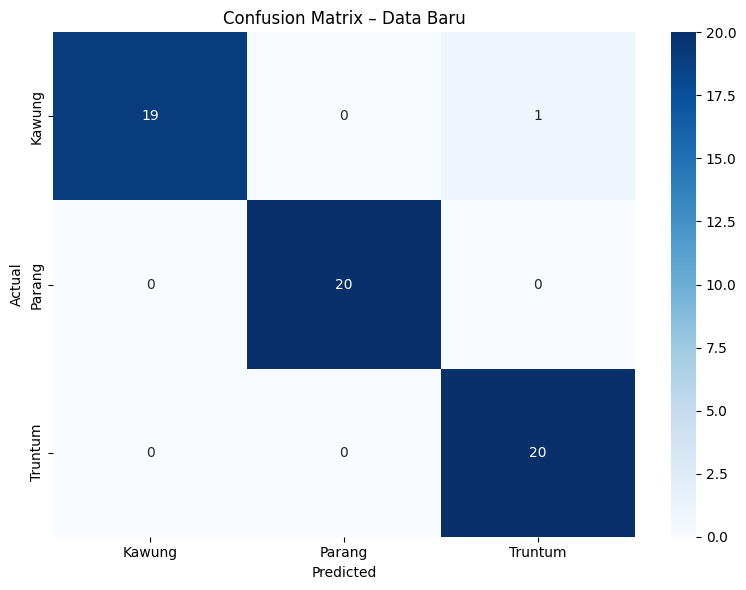


Classification Report:
               precision    recall  f1-score   support

      Kawung       1.00      0.95      0.97        20
      Parang       1.00      1.00      1.00        20
     Truntum       0.95      1.00      0.98        20

    accuracy                           0.98        60
   macro avg       0.98      0.98      0.98        60
weighted avg       0.98      0.98      0.98        60



In [ ]:
# Evaluate model on new data
gen, y_true, y_pred = evaluate_folder(model, new_data_dir, batch_size=16)

In [ ]:
def list_misclassified(gen, y_true, y_pred):
    """List misclassified images with their true and predicted labels"""
    idx_wrong = np.where(y_true != y_pred)[0]

    if not len(idx_wrong):
        print("No misclassifications! 🎉")
        return []

    mis_list = []
    print(f"\nTotal misclassifications: {len(idx_wrong)}\n")

    for i, idx in enumerate(idx_wrong, 1):
        file_path = gen.filepaths[idx]
        true_lab = class_names[y_true[idx]]
        pred_lab = class_names[y_pred[idx]]
        print(f"{i:>3}. {os.path.basename(file_path):30s} | True: {true_lab:12s} → Pred: {pred_lab}")
        mis_list.append((file_path, true_lab, pred_lab))

    return mis_list

In [ ]:
# 3. Panggil fungsi untuk menampilkan salah klasifikasi
misclassified = list_misclassified(gen, y_true, y_pred)


Total misclassifications: 1

  1. Kawung013.jpg                  | True: Kawung       → Pred: Truntum
